# Section 1: Importing Important Packages

In [1]:
%%time
from IPython.utils import io
import math
import matplotlib.pyplot as plt
from multiprocessing import freeze_support
import numpy as np
import os
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import pubchempy as pcp
import sklearn
from mordred import Calculator, descriptors
from rdkit import Chem
import shutil
from sklearn.feature_selection import RFECV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import (
    GridSearchCV,
    StratifiedShuffleSplit,
    cross_val_predict,
    cross_validate
)
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.utils import shuffle
import statistics
import scipy.stats as stats
import seaborn as sns
import sys
from sys import stdout
import time

CPU times: total: 562 ms
Wall time: 3.51 s


# Section 2: Defining Some Key Functions

In [2]:
%%time
import pandas as pd

def select_input_files_playground(TrainTest_Book, Target_Book, X_traintest, X_target, split_percentage=80, verbose=False):
    """
    Splits the provided DataFrames into training and testing sets based on the specified percentage.
    Removes internal standard rows before shuffling and splitting.

    Parameters:
        TrainTest_Book (pd.DataFrame): DataFrame containing combined training and testing data.
        Target_Book (pd.DataFrame): DataFrame containing target data.
        X_traintest (pd.DataFrame): Feature set corresponding to TrainTest_Book.
        X_target (pd.DataFrame): Feature set corresponding to Target_Book.
        split_percentage (int): The percentage of the data to be used as the training set.
        verbose (bool): Flag to control output of debug messages.

    Returns:
        tuple: Contains split data sets and extracted internal standard rows.
    """
    if TrainTest_Book.empty or Target_Book.empty:
        raise ValueError("Input DataFrames cannot be empty.")
    if len(TrainTest_Book) < 2 or len(Target_Book) < 2:
        raise ValueError("DataFrames should have more than one row.")

    if verbose:
        print("Extracting internal standard rows...")
    TrainTest_Internal_Standard_Row = TrainTest_Book.iloc[0]
    Target_Internal_Standard_Row = Target_Book.iloc[0]

    # Drop the first row (internal standard) from both TrainTest_Book and Target_Book
    TrainTest_Book = TrainTest_Book.drop(index=0).reset_index(drop=True)
    Target_Book = Target_Book.drop(index=0).reset_index(drop=True)
    # Assume X_traintest and X_target already have the internal standard row removed

    if verbose:
        print("Shuffling and splitting the TrainTest_Book and X_traintest DataFrames together...")
    # Concatenate TrainTest_Book and X_traintest to shuffle them together
    combined = pd.concat([TrainTest_Book, X_traintest], axis=1)
    combined = combined.sample(frac=1, random_state=None).reset_index(drop=True)  # Shuffle

    # Split the combined DataFrame back into TrainTest_Book and X_traintest
    TrainTest_Book = combined.iloc[:, :TrainTest_Book.shape[1]]
    X_traintest = combined.iloc[:, TrainTest_Book.shape[1]:]

    # Determine split index
    split_index = int(len(TrainTest_Book) * (split_percentage / 100))

    # Use the shuffled DataFrame to split TrainTest_Book and X_traintest directly
    Train_Book = TrainTest_Book.iloc[:split_index].reset_index(drop=True)
    Test_Book = TrainTest_Book.iloc[split_index:].reset_index(drop=True)
    X_train = X_traintest.iloc[:split_index].reset_index(drop=True)
    X_test = X_traintest.iloc[split_index:].reset_index(drop=True)

    if verbose:
        print("Data splitting complete.")

    return Train_Book, Test_Book, Target_Book, X_train, X_test, X_target, TrainTest_Internal_Standard_Row, Target_Internal_Standard_Row

###########################################################################################################################################################
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
from IPython.display import display

def plot_individual_relative_response_vs_concentration(input_book, internal_standard_data, plot_graphs=True, display_table=True, verbose=False):
    
    """
    Analyzes and plots the relative response versus concentration for compounds in the provided DataFrame.

    Parameters:
        input_book (pd.DataFrame): DataFrame containing compound data.
        internal_standard_data (pd.DataFrame): DataFrame containing internal standard data for normalization.
        plot_graphs (bool): If True, generate plots for each compound.
        display_table (bool): If True, display the results table.
        verbose (bool): If True, print additional debug information.

    Returns:
        dict, dict, dict, pd.DataFrame: Slopes, intercepts, R² values, and results DataFrame.
    """
    if verbose:
        print("Initializing data structures and checking input data...")

    # Initialization
    slopes, intercepts, r2_values = {}, {}, {}
    results_df = pd.DataFrame(columns=['Compound', 'Slope', 'Intercept', 'R² Value'])
    color_scale = px.colors.qualitative.Set1

    # Data Processing
    for idx, row in input_book.iterrows():
        relative_concentration = pd.to_numeric(row.filter(like='(ug/mL)'), errors='coerce') / pd.to_numeric(internal_standard_data.filter(like='(ug/mL)'), errors='coerce')
        relative_response = pd.to_numeric(row.filter(like='Response'), errors='coerce') / pd.to_numeric(internal_standard_data.filter(like='Response'), errors='coerce')
        clean_data = pd.DataFrame({'x': relative_concentration.values, 'y': relative_response.values}).dropna()

        # Linear Fit
        x_values_clean, y_values_clean = clean_data['x'].values, clean_data['y'].values
        slope, intercept = np.polyfit(x_values_clean, y_values_clean, 1)
        y_pred = slope * x_values_clean + intercept
        residuals = y_values_clean - y_pred
        ss_res = np.sum(residuals**2)
        ss_tot = np.sum((y_values_clean - np.mean(y_values_clean))**2)
        r2 = 1 - (ss_res / ss_tot)

        # Store Results
        slopes[row['Name']] = slope
        intercepts[row['Name']] = intercept
        r2_values[row['Name']] = r2

        # Plotting
        if plot_graphs:
            plot_data_slopes(row['Name'], x_values_clean, y_values_clean, y_pred, slope, intercept, r2, idx, color_scale)

        # Append to DataFrame
        results_row = pd.DataFrame({
            'Compound': [row['Name']],
            'Slope': [slope],
            'Intercept': [intercept],
            'R² Value': [r2]
        })

        # Exclude empty or all-NA columns before concatenation
        results_row = results_row.dropna(axis=1, how='all')
        results_df = pd.concat([results_df, results_row], ignore_index=True)

    # Display Results Table
    if display_table:
        if verbose:
            print("Displaying results table...")
        display(results_df)

    return slopes, intercepts, r2_values, results_df

def plot_data_slopes(name, x_values, y_values, y_pred, slope, intercept, r2, index, color_scale):
    """
    Helper function to plot data for individual compounds.

    Parameters:
        name (str): Name of the compound.
        x_values, y_values (array): Numeric data points for the plot.
        y_pred (array): Predicted values from the fit.
        slope, intercept (float): Coefficients of the fitted line.
        r2 (float): Coefficient of determination.
        index (int): Index for color selection.
        color_scale (list): List of colors for plotting.
    """
    color = color_scale[index % len(color_scale)]
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=x_values, y=y_values, mode='markers', name='Data Points', marker=dict(color=color, opacity=0.7)))
    fig.add_trace(go.Scatter(x=x_values, y=y_pred, mode='lines', name='Fit', line=dict(color=color, dash='dash')))
    fig.add_annotation(xref='paper', x=0.10, yref='paper', y=0.95, text=f"y = {slope:.2f}x + {intercept:.2f}, R² = {r2:.2f}", showarrow=False, font=dict(size=14, color="black"))
    fig.update_layout(title=f"{name}: Relative Concentration vs. Relative Response", xaxis_title="Relative Concentration", yaxis_title="Relative Response", showlegend=True)
    fig.update_layout(template='none', height=600, width=800)
    fig.update_xaxes(showline=True, linewidth=1, linecolor='black', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='black', mirror=True)
    fig.show()


###########################################################################################################################################################

def filter_datasets_by_results(threshold, results_dfs_names, input_books_names, descriptor_books_names, verbose=False):
    """
    Filters datasets by removing compounds that do not meet specified criteria of slope and R² value.

    Parameters:
        threshold (float): The minimum acceptable R² value for a compound to be retained.
        results_dfs_names (list of tuples): List of tuples containing results DataFrames and their names.
        input_books_names (list of tuples): List of tuples containing input book DataFrames and their names.
        descriptor_books_names (list of tuples): List of tuples containing descriptor DataFrames and their names.
        verbose (bool): If True, print which compounds are removed and why.

    Returns:
        tuple: Contains filtered books, results, and descriptors, each paired with their names.
    """
    results_dfs, results_names = zip(*results_dfs_names)
    input_books, book_names = zip(*input_books_names)
    descriptor_books, descriptor_names = zip(*descriptor_books_names)

    compounds_to_remove = set()

    # Criteria application and logging
    for results_df, r_name in zip(results_dfs, results_names):
        for idx, row in results_df.iterrows():
            if row['Slope'] <= 0:
                compounds_to_remove.add(idx)  # Use index for removal
                if verbose:
                    print(f"Removing '{row['Compound']}' from {r_name} because the slope is negative.")
            elif row['R² Value'] < threshold:
                compounds_to_remove.add(idx)  # Use index for removal
                if verbose:
                    print(f"Removing '{row['Compound']}' from {r_name} because the R² value is below the threshold.")

    # Dataset filtering for input_books
    filtered_books = [(book[~book.index.isin(compounds_to_remove)].reset_index(drop=True), b_name)
                      for book, b_name in zip(input_books, book_names)]

    # Dataset filtering for descriptor_books
    filtered_descriptors = [(descriptor[~descriptor.index.isin(compounds_to_remove)].reset_index(drop=True), b_name)
                            for descriptor, b_name in zip(descriptor_books, descriptor_names)]

    # Remove these compounds from the results DataFrames
    filtered_results = [(results_df[~results_df.index.isin(compounds_to_remove)].reset_index(drop=True), r_name)
                        for results_df, r_name in zip(results_dfs, results_names)]

    return filtered_books, filtered_results, filtered_descriptors

###########################################################################################################################################################

import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

def box_cox_transform_and_plot(train_slopes, test_slopes, plot_graphs=True, verbose=False):
    """
    Applies a Box-Cox transformation to slope data to improve normality, with optional plotting.

    Parameters:
        train_slopes (np.array): Array of training set slopes.
        test_slopes (np.array): Array of testing set slopes.
        plot_graphs (bool): If True, generates and displays histograms and Q-Q plots.
        verbose (bool): If True, prints details about the transformations and tests.

    Returns:
        np.array, np.array, float: Transformed training slopes, transformed test slopes, and lambda value.
    """
    if verbose:
        shapiro_test_initial = stats.shapiro(train_slopes)
        print(f"Shapiro-Wilk test for the initial slopes (Training set): {shapiro_test_initial}")

    transformed_train_slopes, lambda_value = stats.boxcox(train_slopes)
    
    if verbose:
        print(f"Best-fitting lambda value for training set: {lambda_value}")
        shapiro_test_transformed = stats.shapiro(transformed_train_slopes)
        print(f"Shapiro-Wilk test for Box-Cox transformed slopes (Training set): {shapiro_test_transformed}")

    transformed_test_slopes = (np.power(test_slopes, lambda_value) - 1) / lambda_value if lambda_value != 0 else np.log(test_slopes)

    if plot_graphs:
        plot_data_boxcox('Original Slopes (Training set)', train_slopes, 'Histogram')
        plot_data_boxcox('Original Slopes (Training set)', train_slopes, 'Q-Q')
        plot_data_boxcox('Box-Cox Transformed Slopes (Training set)', transformed_train_slopes, 'Histogram')
        plot_data_boxcox('Box-Cox Transformed Slopes (Training set)', transformed_train_slopes, 'Q-Q')

    return transformed_train_slopes, transformed_test_slopes, lambda_value

def plot_data_boxcox(title, data, plot_type):
    """
    Helper function to plot data for visualization.

    Parameters:
        title (str): Title for the plot.
        data (np.array): Data to be plotted.
        plot_type (str): Type of plot ('Histogram' or 'Q-Q').
    """
    plt.figure(figsize=(10, 6))
    if plot_type == 'Histogram':
        plt.hist(data, bins=10, density=True, alpha=0.6, color="b" if 'Original' in title else "g")
    elif plot_type == 'Q-Q':
        stats.probplot(data, dist="norm", plot=plt)
    plt.title(f"{title}")
    plt.show()

#######################################################################################################
    
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def calculate_and_plot_percent_error(df, internal_standard_row, slopes, plot=True, verbose=True):
    """
    Calculates and optionally plots the percent error in predicted concentrations of standards.

    Parameters:
        df (pd.DataFrame): DataFrame containing concentration and response data.
        internal_standard_row (pd.Series): Series containing internal standard data.
        slopes (list or np.array): List or array of slope values used for prediction.
        plot (bool): If True, generates heatmap and CDF plot of percent errors.
        verbose (bool): If True, prints statistical outputs.

    Returns:
        np.array: Matrix of percent errors.
    """
    concentration_columns = [col for col in df.columns if "(ug/mL)" in col]
    response_columns = [col for col in df.columns if "Response" in col]

    percent_errors = []

    for idx, row in df.iterrows():
        errors_for_this_compound = []
        for conc_col, resp_col in zip(concentration_columns, response_columns):
            response = pd.to_numeric(row[resp_col], errors='coerce')
            blank_response = pd.to_numeric(row.get("Blank Response", 0), errors='coerce')

            if not np.isnan(response) and not np.isnan(blank_response):
                adjusted_slope = slopes[idx] * (internal_standard_row[resp_col] / internal_standard_row[conc_col])
                if adjusted_slope != 0:
                    predicted_concentration = (response - blank_response) / adjusted_slope
                    true_concentration = row[conc_col]
                    if true_concentration != 0:
                        percent_error = ((predicted_concentration - true_concentration) / true_concentration) * 100
                        errors_for_this_compound.append(abs(percent_error))
                    else:
                        errors_for_this_compound.append(np.nan)
                else:
                    errors_for_this_compound.append(np.nan)
            else:
                errors_for_this_compound.append(np.nan)

        percent_errors.append(errors_for_this_compound)

    percent_errors_matrix = np.array(percent_errors)

    if plot:
        plot_percent_errors_heatmap(percent_errors_matrix, concentration_columns, df['Name'])
        plot_percent_errors_cdf(percent_errors_matrix)

    flattened_errors = percent_errors_matrix.flatten()
    flattened_errors = flattened_errors[~np.isnan(flattened_errors)]  # Remove NaN values for analysis

    if verbose:
        mean_error = np.mean(flattened_errors)
        std_error = np.std(flattened_errors)
        median_error = np.median(flattened_errors)
        print(f"Mean Percent Error: {mean_error:.2f}%")
        print(f"Standard Deviation of Percent Errors: {std_error:.2f}%")
        print(f"Median Percent Error: {median_error:.2f}%")

    return percent_errors_matrix

'''

def plot_percent_errors_heatmap(percent_errors_matrix, concentration_columns, compound_names):
    """
    Helper function to plot a heatmap of percent errors.

    Parameters:
        percent_errors_matrix (np.array): Matrix of percent errors.
        concentration_columns (list): List of concentration column names.
        compound_names (pd.Series): Series of compound names for y-axis labels.
    """
    cmap = sns.diverging_palette(10, 150, s=80, l=55, n=9, center="light")
    plt.figure(figsize=(12, 8))
    sns.heatmap(percent_errors_matrix, annot=True, fmt=".2f", cmap=cmap, center=0,
                xticklabels=concentration_columns, yticklabels=compound_names, cbar_kws={'label': 'Percent Error'})
    plt.title("Percent Error in Predicted Concentration")
    plt.xlabel("Concentration Levels")
    plt.ylabel("Standards")
    plt.tight_layout()
    plt.show()

'''

#New version of the function that omits the blanks from the heatmap.

def plot_percent_errors_heatmap(percent_errors_matrix, concentration_columns, compound_names):
    """
    Helper function to plot a heatmap of percent errors, excluding the first column which represents the blank.

    Parameters:
        percent_errors_matrix (np.array): Matrix of percent errors.
        concentration_columns (list): List of concentration column names.
        compound_names (pd.Series): Series of compound names for y-axis labels.
    """
    # Exclude the first column from the percent errors matrix
    adjusted_percent_errors = percent_errors_matrix[:, 1:]  # Slice off the first column

    # Adjust concentration columns to exclude the first column (assumed to be blank)
    adjusted_concentration_columns = concentration_columns[1:]  # Skip the first column

    # Set the color map
    cmap = sns.diverging_palette(10, 150, s=80, l=55, n=9, center="light")

    # Plot the heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(adjusted_percent_errors, annot=True, fmt=".2f", cmap=cmap, center=0,
                xticklabels=adjusted_concentration_columns, yticklabels=compound_names, cbar_kws={'label': 'Percent Error'})
    plt.title("Percent Error in Predicted Concentration")
    plt.xlabel("Concentration Levels")
    plt.ylabel("Compounds")
    plt.tight_layout()
    plt.show()







def plot_percent_errors_cdf(percent_errors_matrix):
    """
    Helper function to plot the cumulative distribution function of percent errors.

    Parameters:
        percent_errors_matrix (np.array): Matrix of percent errors to analyze.
    """
    flattened_errors = percent_errors_matrix.flatten()
    flattened_errors = flattened_errors[~np.isnan(flattened_errors)]
    plt.figure(figsize=(8, 6))
    sns.ecdfplot(flattened_errors)
    plt.xlabel('Percent Error')
    plt.ylabel('CDF')
    plt.title('CDF of Percent Errors')
    plt.grid(True)
    plt.show()
    
###############################################################################################################################

import numpy as np

def box_cox_untransform(transformed_data, lambda_value):
    """
    Reverts data from a Box-Cox transformation back to its original scale, adjusting NaN values to zero.

    Parameters:
        transformed_data (numpy array or list): Data that has been Box-Cox transformed.
        lambda_value (float): Lambda value used in the Box-Cox transformation.

    Returns:
        numpy array: Untransformed data, with NaN values adjusted to zero.
    """
    # Convert input to numpy array to ensure compatibility with numpy operations
    transformed_data = np.array(transformed_data, dtype=np.float64)

    if lambda_value == 0:
        # Revert logarithmic transformation
        untransformed = np.exp(transformed_data)
    else:
        # Apply the inverse Box-Cox transformation
        untransformed = (lambda_value * transformed_data + 1) ** (1 / lambda_value)

    # Adjust NaN values to zero, which may result from invalid operations or data issues
    untransformed = np.nan_to_num(untransformed, nan=0)

    return untransformed

###############################################################################################################################

import numpy as np

def calculate_summary_statistics(matrix):
    """
    Calculates mean, standard deviation, and median for a given data matrix after flattening and removing NaN values.

    Parameters:
        matrix (numpy array): A multi-dimensional array from which statistics will be calculated.

    Returns:
        tuple: Contains the mean, standard deviation, and median of the data. Returns NaN for all if input is empty or only contains NaN.
    """
    flattened_errors = matrix.flatten()
    flattened_errors = flattened_errors[~np.isnan(flattened_errors)]  # Remove NaN values

    # Handle case where all values are NaN or matrix is empty
    if flattened_errors.size == 0:
        return (np.nan, np.nan, np.nan)

    mean_error = np.mean(flattened_errors)
    std_error = np.std(flattened_errors, ddof=1)  # Using Bessel's correction for sample standard deviation
    median_error = np.median(flattened_errors)

    return mean_error, std_error, median_error

def untransform_predictions(y_train_predicted_transformed, y_train_cross_validation_transformed, y_test_predicted_transformed, y_target_predicted_transformed, lambda_value, verbose=True):
    if verbose: print("Untransforming predictions...")
    y_train_predicted_untransformed = box_cox_untransform(y_train_predicted_transformed, lambda_value)
    y_train_cross_validation_untransformed = box_cox_untransform(y_train_cross_validation_transformed, lambda_value)
    y_test_predicted_untransformed = box_cox_untransform(y_test_predicted_transformed, lambda_value)
    y_target_predicted_untransformed = box_cox_untransform(y_target_predicted_transformed, lambda_value)
    return y_train_predicted_untransformed, y_train_cross_validation_untransformed, y_test_predicted_untransformed, y_target_predicted_untransformed


CPU times: total: 0 ns
Wall time: 0 ns


In [3]:
import pandas as pd
from rdkit import Chem

def check_inputs(Book, column_title='Input', verbose=True):
    """
    Determines the input identifier type (CID, InChI, or SMILES) in a DataFrame column and checks for invalid inputs.

    Parameters:
        Book (pd.DataFrame): DataFrame containing chemical identifiers.
        column_title (str): Title of the column containing the identifiers. Default is 'Input'.
        verbose (bool): If True, prints messages about the assumed input type.

    Returns:
        tuple: Type of identifiers used ("CID", "InChI", or "SMILES") and a list of invalid identifiers.
    """
    input_errors = []
    sample = Book[column_title].iloc[0]

    if pd.api.types.is_integer_dtype(Book[column_title]):
        input_type = 'CID'
        if verbose:
            print("   Input type CID assumed.")
        input_errors = [i for i in Book[column_title] if not isinstance(i, int)]
    elif isinstance(sample, str) and 'InChI' in sample:
        input_type = 'InChI'
        if verbose:
            print("   Input type InChI assumed.")
        input_errors = [i for i in Book[column_title] if Chem.MolFromInchi(i) is None]
    else:
        input_type = 'SMILES'
        if verbose:
            print("   Input type SMILES assumed.")
        input_errors = [i for i in Book[column_title] if Chem.MolFromSmiles(i) is None]

    return input_type, input_errors

###############################################################################################################################

import pandas as pd
import pubchempy as pcp
from sys import stdout

def get_compounds_from_cid(input_list):
    """
    Fetches compound data from PubChem for given CIDs, handling requests in batches due to API limitations.

    Parameters:
        input_list (pd.Series): Series of input identifiers in CID form.

    Returns:
        list: Compound data for each input CID, retrieved from PubChem.
    """
    CID_list = [int(i) for i in input_list if pd.notna(i)]
    reconstructed_compounds = []
    batch_size = 100

    for start in range(0, len(CID_list), batch_size):
        end = min(start + batch_size, len(CID_list))
        batch = CID_list[start:end]
        try:
            compounds_vals = pcp.get_compounds(batch, 'cid')
            reconstructed_compounds.extend(compounds_vals)
            # Progress reporting
            progress = (end / len(CID_list)) * 100
            stdout.write(f"\r        {progress:.2f}% of compound files retrieved from PubChem.")
            stdout.flush()
        except Exception as e:
            print(f"\nError retrieving data for CIDs from {start} to {end}: {e}")

    stdout.write("\n")
    # Verify all CIDs were processed
    if len(reconstructed_compounds) != len(CID_list):
        print("WARNING: At least one CID was not converted into a PubChem compound file correctly.")

    return reconstructed_compounds

###############################################################################################################################

from rdkit import Chem
from mordred import Calculator, descriptors
import pandas as pd

def calculate_descriptors(input_list, input_type='InChI', verbose=True):
    """
    Calculates molecular descriptors from a list of chemical identifiers using Mordred.

    Parameters:
        input_list (pd.Series): Series containing chemical identifiers (CID, InChI, SMILES).
        input_type (str): Type of identifiers in the input list; defaults to 'InChI'.
        verbose (bool): If True, prints details about the processing steps.

    Returns:
        pd.DataFrame: DataFrame containing calculated molecular descriptors.
    """
    # Convert identifiers to RDKit molecules
    mol_list = convert_identifiers_to_molecules(input_list, input_type, verbose)

    # Initialize Mordred Calculator
    calc = Calculator(descriptors, ignore_3D=True)

    # Calculate descriptors
    try:
        descriptor_list = calc.pandas(mol_list)
    except Exception as e:
        if verbose:
            print(f"Error calculating descriptors: {e}")
        return pd.DataFrame()  # Return an empty DataFrame in case of error

    return descriptor_list

def convert_identifiers_to_molecules(input_list, input_type, verbose):
    """
    Helper function to convert chemical identifiers to RDKit molecule objects.

    Parameters:
        input_list (pd.Series): Series of chemical identifiers.
        input_type (str): Type of chemical identifier (CID, InChI, SMILES).
        verbose (bool): Prints processing details if True.

    Returns:
        list: List of RDKit molecule objects.
    """
    mol_list = []
    if input_type == 'InChI':
        mol_list = [Chem.MolFromInchi(i) for i in input_list if i]
    elif input_type == 'SMILES':
        mol_list = [Chem.MolFromSmiles(i) for i in input_list if i]
    elif input_type == 'CID':
        if verbose:
            print("Fetching compounds from PubChem...")
        compounds_list = get_compounds_from_cid(input_list)
        mol_list = [Chem.MolFromSmiles(compound.isomeric_smiles) for compound in compounds_list if compound]

    if verbose:
        print(f"Converted {len(mol_list)} identifiers to molecules.")

    return mol_list

###############################################################################################################################

import pandas as pd

def clean_up_descriptors(input_frame, verbose=True):
    """
    Cleans a DataFrame of molecular descriptors by removing non-numerical columns.

    Parameters:
        input_frame (pd.DataFrame): DataFrame containing molecular descriptors.
        verbose (bool): If True, prints details about the number of descriptors removed.

    Returns:
        pd.DataFrame: DataFrame containing only numerical molecular descriptors.
    """
    if input_frame.empty:
        if verbose:
            print("Input DataFrame is empty.")
        return pd.DataFrame()  # Return an empty DataFrame if the input is empty
    
    start_length = len(input_frame.columns)
    output_frame = input_frame.select_dtypes(include=['number'])  # Select only numerical columns

    if verbose:
        end_length = len(output_frame.columns)
        num_removed = start_length - end_length
        print(f"Number of inapplicable descriptors removed: {num_removed}\n")

    return output_frame

###############################################################################################################################

import pandas as pd

def drop_constant_column(input_frame, verbose=True):
    """
    Removes columns from a DataFrame that are constant across all rows, as these do not provide useful variation.

    Parameters:
        input_frame (pd.DataFrame): DataFrame containing molecular descriptors.
        verbose (bool): If True, prints details about the number of constant descriptors removed.

    Returns:
        pd.DataFrame: DataFrame after removing constant descriptors.
    """
    if input_frame.empty:
        if verbose:
            print("Input DataFrame is empty.")
        return pd.DataFrame()  # Return an empty DataFrame if the input is empty
    
    start_len = len(input_frame.columns)
    output_frame = input_frame.loc[:, (input_frame != input_frame.iloc[0]).any()]
    end_len = len(output_frame.columns)

    if verbose:
        num_removed = start_len - end_len
        print(f"Number of constant descriptors removed: {num_removed}\n")

    return output_frame

###############################################################################################################################

import pandas as pd
import numpy as np
import statistics

def removeoutlier(input_frame1, input_frame2, threshold, verbose=True):
    """
    Removes columns with outlier values from two DataFrames based on the comparison with a reference DataFrame and a z-score threshold.

    Parameters:
        input_frame1 (pd.DataFrame): DataFrame of molecular descriptors to be inspected for outliers.
        input_frame2 (pd.DataFrame): Reference DataFrame of molecular descriptors.
        threshold (float): The z-score threshold to identify outliers.
        verbose (bool): If True, prints details about the number of descriptors removed.

    Returns:
        tuple: Two DataFrames with outlier columns removed.
    """
    input_frame1_temporary = input_frame1.copy()
    input_frame2_temporary = input_frame2.copy()
    removed_count = 0

    # Precompute mean and std dev for all columns in the reference frame
    means = input_frame2.mean()
    std_devs = input_frame2.std()

    for i in input_frame2.columns:
        z_score_high = means[i] + threshold * std_devs[i]
        z_score_low = means[i] - threshold * std_devs[i]
        # Check for outliers in both frames and drop if found
        if ((input_frame1[i] > z_score_high) | (input_frame1[i] < z_score_low)).any():
            input_frame1_temporary.drop(columns=i, inplace=True)
            input_frame2_temporary.drop(columns=i, inplace=True)
            removed_count += 1

    if verbose:
        print(f"Number of descriptors dropped due to outlier function: {removed_count}\n")

    return input_frame1_temporary, input_frame2_temporary

###############################################################################################################################

from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV, cross_validate, cross_val_predict

def svr_model_linear(X_train, y_train, C_list=[2**i for i in range(-4, 2)], epsilon_list=[0.0001, 0.1, 1], verbose=True):
    """
    Constructs and optimizes a linear support vector regression model using grid search.

    Parameters:
        X_train (pd.DataFrame): Table of molecular descriptors.
        y_train (list): List of target values (experimental RIE values).
        C_list (list of floats): GridSearch options for the cost hyperparameter; default is powers of 2 from -4 to 1.
        epsilon_list (list of floats): GridSearch options for the epsilon hyperparameter; default includes 0.0001, 0.1, 1.
        verbose (bool): If True, print details about the model construction process.

    Returns:
        best_svr (SVR): The optimized SVR model.
        scores (dict): Results of GridSearchCV trials for each combination of C and epsilon.
        grid_result (GridSearchCV): GridSearchCV object with details of the setup.
        y_train_cross_validation (np.ndarray): Predicted values from cross-validation.
    """
    if verbose:
        print("Performing grid search hyperparameter optimization...")
    gsc = GridSearchCV(
        estimator=SVR(kernel='linear', verbose=verbose),
        param_grid={'C': C_list, 'epsilon': epsilon_list},
        cv=10, scoring='neg_root_mean_squared_error', verbose=verbose, n_jobs=-1)
    
    grid_result = gsc.fit(X_train, y_train)
    
    if verbose:
        print("Grid search completed.\n")
        print(f"Fitting SVR model with C={grid_result.best_params_['C']} and epsilon={grid_result.best_params_['epsilon']}...")
        
    best_svr = SVR(kernel='linear', C=grid_result.best_params_["C"], epsilon=grid_result.best_params_["epsilon"],
                   coef0=0.1, shrinking=True,
                   tol=0.001, cache_size=500, verbose=verbose, max_iter=-1)
    
    if verbose:
        print("SVR model constructed.\n")
        print("Performing k-fold cross-validation...")
    scoring = {'abs_error': 'neg_mean_absolute_error', 'squared_error': 'neg_mean_squared_error'}
    scores = cross_validate(best_svr, X_train, y_train, cv=10, scoring=scoring, return_train_score=True, n_jobs=-1)
    y_train_cross_validation = cross_val_predict(best_svr, X_train, y_train, cv=10, n_jobs=-1, verbose=verbose)
    
    if verbose:
        print("Cross-validation completed.\n")
    return best_svr, scores, grid_result, y_train_cross_validation

###############################################################################################################################

from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV, cross_val_predict

def initial_rie_prediction(X_train, y_train, X_test, y_test, X_target, remove_outlier=False, threshold=100, verbose=True):
    """
    Predicts RIE values using a linear SVR model with comprehensive data preprocessing and model training steps.
    """
    if verbose:
        print("Checking for constant and inapplicable descriptors... \n")

    # Clean up and drop constant columns
    X_train_clean = drop_constant_column(clean_up_descriptors(X_train, verbose=verbose), verbose=verbose)
    X_test_clean = drop_constant_column(clean_up_descriptors(X_test, verbose=verbose), verbose=verbose)
    X_target_clean = drop_constant_column(clean_up_descriptors(X_target, verbose=verbose), verbose=verbose)

    # Ensure all dataframes have the same columns after outlier removal
    common_columns = [col for col in set(X_train_clean.columns).intersection(X_test_clean.columns).intersection(X_target_clean.columns)]
    
    X_train_clean = X_train_clean[common_columns]
    X_test_clean = X_test_clean[common_columns]
    X_target_clean = X_target_clean[common_columns]    
    
    # Remove outliers before aligning columns across datasets
    if remove_outlier:
        if verbose:
            print("Removing outliers based on threshold...")
        X_test_clean, X_train_clean = removeoutlier(X_test_clean, X_train_clean, threshold, verbose=verbose)
        
        # Ensure all dataframes have the same columns after outlier removal
        common_columns = [col for col in set(X_train_clean.columns).intersection(X_test_clean.columns).intersection(X_target_clean.columns)]
        
        X_train_clean = X_train_clean[common_columns]
        X_test_clean = X_test_clean[common_columns]
        X_target_clean = X_target_clean[common_columns]
        
        X_target_clean, X_train_clean = removeoutlier(X_target_clean, X_train_clean, threshold, verbose=verbose)

    # Ensure all dataframes have the same columns after outlier removal
    common_columns = [col for col in set(X_train_clean.columns).intersection(X_test_clean.columns).intersection(X_target_clean.columns)]
    
    X_train_clean = X_train_clean[common_columns]
    X_test_clean = X_test_clean[common_columns]
    X_target_clean = X_target_clean[common_columns]

    # Scale the descriptor matrices
    if verbose:
        print("Scaling descriptor matrices...")
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train_clean)
    X_test_scaled = scaler.transform(X_test_clean)
    X_target_scaled = scaler.transform(X_target_clean)

    if verbose:
        print("Building an SVR model using all applicable Mordred descriptors... \n")
    model, scores, grid_results, y_train_cross_validation = svr_model_linear(X_train_scaled, y_train, verbose=verbose)
    
    # Fit the model to the training data
    model.fit(X_train_scaled, y_train)
    
    if verbose:
        print("Predicting RIE values...")
    y_train_predicted = model.predict(X_train_scaled)
    y_test_predicted = model.predict(X_test_scaled)
    y_target_predicted = model.predict(X_target_scaled)

    if verbose:
        print("All predictions completed.\n")

    return X_train_clean, X_test_clean, X_target_clean, X_train_scaled, model, grid_results, y_train_predicted, y_train_cross_validation, y_test_predicted, y_target_predicted

###############################################################################################################################

from sklearn.svm import SVR
from sklearn.feature_selection import RFECV
from sklearn.metrics import mean_squared_error

def configure_svr(grid_results, verbose=True):
    # This function sets up the SVR with parameters from the grid search results.
    return SVR(C=grid_results.best_params_['C'], cache_size=2048, epsilon=grid_results.best_params_['epsilon'], kernel='linear', verbose=verbose)


def execute_rfecv(estimator, X_train_scaled, y_train, verbose=True):
    # This function executes the RFECV process with an option to control the verbosity of the output.
    if verbose:
        print("Initiating selection process...")
    rfecv = RFECV(estimator, step=10, cv=5, scoring='neg_root_mean_squared_error',
                  min_features_to_select=50, verbose=0, n_jobs=-1)
    rfecv.fit(X_train_scaled, y_train)
    if verbose:
        print("The number of features selected: ", rfecv.n_features_)
        print("Selection process completed. \n")
    return rfecv

def rfe_variable_selection(X_train_scaled, y_train, grid_results, verbose=True):
    # This is the main function that integrates the SVR configuration and RFECV execution.
    estimator = configure_svr(grid_results, verbose)
    return execute_rfecv(estimator, X_train_scaled, y_train, verbose)

###############################################################################################################################

from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.feature_selection import RFECV
from sklearn.model_selection import GridSearchCV, cross_val_predict

def apply_feature_selection(X_dataframes, support_mask, verbose):
    """ Apply RFECV support mask to multiple dataframes and check for proper feature selection. """
    if verbose:
        print("Applying feature selection mask...")
    if not support_mask.any():
        raise ValueError("No features selected; check RFECV results and input data quality.")
    return [X[X.columns[support_mask]] for X in X_dataframes if not X.empty]

def scale_features(X_train, X_test, X_target, verbose):
    """ Scale features and return scaled matrices, report on scaling if verbose. """
    if verbose:
        print("Scaling descriptor matrices...")
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    X_target_scaled = scaler.transform(X_target)
    if verbose:
        print("Descriptor matrices scaled. \n")
    return X_train_scaled, X_test_scaled, X_target_scaled

def train_and_predict(X_train_scaled, y_train, X_test_scaled, X_target_scaled, verbose):
    """ Train SVR and predict RIE values, report on training and prediction if verbose. """
    if verbose:
        print("Building an SVR model with descriptors selected by RFE... \n")
    model, scores, grid_result, y_train_cross_validation = svr_model_linear(X_train_scaled, y_train, verbose=verbose)
    model.fit(X_train_scaled, y_train)
    if verbose:
        print("Simplified model training completed. \nPerforming RIE predictions...")
    y_train_predicted = model.predict(X_train_scaled)
    y_test_predicted = model.predict(X_test_scaled)
    y_target_predicted = model.predict(X_target_scaled)
    if verbose:
        print("All predictions completed. \n")
    return model, grid_result, y_train_predicted, y_train_cross_validation, y_test_predicted, y_target_predicted

def rfe_rie_prediction(X_train_clean, y_train, X_test_clean, y_test, X_target_clean, rfecv, verbose=True):
    """ Predicts RIE values using a linear SVR model after recursive feature elimination. """
    if verbose:
        print("Modifying descriptor matrices to use only selected descriptors...")
    # Apply feature selection based on RFECV support and handle potential issues
    try:
        X_train_rfe, X_test_rfe, X_target_rfe = apply_feature_selection(
            [X_train_clean, X_test_clean, X_target_clean], rfecv.support_, verbose)
    except ValueError as e:
        print(f"Error in feature selection: {e}")
        return

    # Scale features
    X_train_scaled, X_test_scaled, X_target_scaled = scale_features(
        X_train_rfe, X_test_rfe, X_target_rfe, verbose)

    # Train model and make predictions
    model, grid_result, y_train_predicted, y_train_cross_validation, y_test_predicted, y_target_predicted = train_and_predict(
        X_train_scaled, y_train, X_test_scaled, X_target_scaled, verbose)

    return model, grid_result, X_test_rfe, y_train_predicted, y_train_cross_validation, y_test_predicted, y_target_predicted

###############################################################################################################################

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

import numpy as np
from sklearn.metrics import mean_squared_error, r2_score

def regression_metrics(true_values, predicted_values):
    """
    Calculates several regression metrics to assess model performance.

    Parameters:
        true_values (array-like): Ground truth (correct) values.
        predicted_values (array-like): Estimated values.

    Returns:
        float: RMSE - Root mean squared error.
        float: MRE - Median relative error.
        float: R2 - Coefficient of determination.
        float: RMSPE - Root mean squared percentage error.
    """
    true_values = np.array(true_values)
    predicted_values = np.array(predicted_values)

    # RMSE
    RMSE = mean_squared_error(true_values, predicted_values, squared=False)

    # MRE
    relative_errors = np.abs((true_values - predicted_values) / true_values) * 100
    MRE = np.median(relative_errors)

    # R2
    R2 = r2_score(true_values, predicted_values)

    # RMSPE
    percentage_errors = np.abs((true_values - predicted_values) / true_values)
    RMSPE = np.sqrt(np.mean(percentage_errors**2)) * 100

    return RMSE, MRE, R2, RMSPE

def plot_predictions(ax, y_true, y_pred, title, color, labelsize, legendsize, titlesize, textsize):
    """ Helper function to plot and annotate each subplot. """
    ax.scatter(y_true, y_pred, color=color, marker='o', edgecolor='black', s=50)
    fit = np.polyfit(y_true, y_pred, 1)
    values = np.linspace(min(y_true), max(y_true), 100)
    ax.plot(values, np.polyval(fit, values), color=color, label="Fit", linewidth=1.4)
    ax.plot(values, values, 'k--', label="1:1", linewidth=1)
    RMSE, MRE, R2, RMSPE = regression_metrics(y_true, y_pred)
    annotation_text = f"Median Error = {MRE:.2f}%\nRMSE = {RMSE:.2f} au\n$R^2$ = {R2:.2f}\nRMSPE = {RMSPE:.2f}%"
    ax.text(0.05, 0.95, annotation_text, transform=ax.transAxes, fontsize=textsize, verticalalignment='top')
    ax.set_title(title, fontsize=titlesize)
    ax.set_xlabel('Measured RIE (au)', fontsize=labelsize)
    ax.set_ylabel('Predicted RIE (au)', fontsize=labelsize)
    ax.legend(loc='lower right', prop={'size': legendsize})

def summary_plot(y_train, y_test, y_train_predicted, y_train_cross_validation, y_test_predicted, labelsize=12, legendsize=12, titlesize=14, textsize=12):
    f, axes = plt.subplots(1, 3, figsize=(16, 6))
    plot_predictions(axes[0], y_train, y_train_predicted, "Calibration Prediction", 'powderblue', labelsize, legendsize, titlesize, textsize)
    plot_predictions(axes[1], y_train, y_train_cross_validation, "Cross-Validation Prediction", 'thistle', labelsize, legendsize, titlesize, textsize)
    plot_predictions(axes[2], y_test, y_test_predicted, "Validation Prediction", 'bisque', labelsize, legendsize, titlesize, textsize)
    plt.tight_layout()
    plt.show()
    return f

def plot_single_prediction_vs_true(predicted, true, predicted_label, true_label):
    """
    Plots a scatter plot for a single set of predicted values versus true values.

    Parameters:
        predicted (list or np.array): Predicted values to plot.
        true (list or np.array): True values to plot against.
        predicted_label (str): Label for the predicted data.
        true_label (str): Label for the true data.
    """
    # Create a Plotly scatter plot
    fig = go.Figure()
    
    # Add scatter trace
    fig.add_trace(
        go.Scatter(
            x=true,
            y=predicted,
            mode='markers',
            marker=dict(color='bisque', line=dict(color='black', width=1)),
            name=f'Predicted vs True'
        )
    )
    
    # Update layout
    fig.update_layout(
        title=f'Comparison of Predicted vs. True Values',
        xaxis_title=true_label,
        yaxis_title=predicted_label,
        legend_title='Data Type',
        template='none'
    )
    
    # Show plot
    fig.show()

In [4]:
def run_experiment(split_percentage, iteration, verbose=True):
    # Step 1: Select and split input files
    Train_Book, Test_Book, Target_Book, X_train_raw, X_test_raw, X_target_raw, TrainTest_Internal_Standard_Row, Target_Internal_Standard_Row = select_input_files_playground(
        TrainTest_Book, Target_Book_Initial, X_traintest_complete, X_target_complete, split_percentage=split_percentage, verbose=verbose)
    
    
    # Step 2: Plot individual relative response vs. concentration
    if verbose: print("____________________________________________________TRAIN DATA____________________________________________________")
    slopes_train, intercepts_train, r2_values_train, results_df_train = plot_individual_relative_response_vs_concentration(
        Train_Book, TrainTest_Internal_Standard_Row, plot_graphs=verbose, display_table=verbose, verbose=verbose)

    if verbose: print("____________________________________________________TEST DATA____________________________________________________")
    slopes_test, intercepts_test, r2_values_test, results_df_test = plot_individual_relative_response_vs_concentration(
        Test_Book, TrainTest_Internal_Standard_Row, plot_graphs=verbose, display_table=verbose, verbose=verbose)

    
    
    # Step 3: Filter datasets by results
    threshold = 0.8  # Or any threshold value you want
    results_dfs_names = [(results_df_train, 'results_df_train'), (results_df_test, 'results_df_test')]
    input_books_names = [(Train_Book, 'Train_Book'), (Test_Book, 'Test_Book')]
    descriptor_books_names = [(X_train_raw, 'X_train'), (X_test_raw, 'X_test')]


        
        
    filtered_books_tuples, filtered_results_tuples, filtered_descriptors_tuples = filter_datasets_by_results(
        threshold, results_dfs_names, input_books_names, descriptor_books_names, verbose=verbose)

    # Unpack the tuples to extract the DataFrames and their names, if needed
    (filtered_train_book, _), (filtered_test_book, _) = filtered_books_tuples
    (filtered_train_results, _), (filtered_test_results, _) = filtered_results_tuples
    (filtered_X_train, _), (filtered_X_test, _) = filtered_descriptors_tuples

    # Step 4: Box-Cox transform and plot
    transformed_train, transformed_test, lambda_value = box_cox_transform_and_plot(
        filtered_train_results['Slope'].values, filtered_test_results['Slope'].values, plot_graphs=verbose, verbose=verbose)

    # Step 5: Initial RIE prediction
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    if verbose: print("MODEL TRAINING: Building an SVR Model using All Applicable Mordred Descriptors")
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    X_train_clean, X_test_clean, X_target_clean, X_train_scaled, model, grid_results, y_train_predicted, y_train_cross_validation, y_test_predicted, y_target_predicted = initial_rie_prediction(
        filtered_X_train, list(filtered_train_results['Slope'].values), filtered_X_test, list(filtered_test_results['Slope'].values), X_target_raw, remove_outlier=True, threshold=3, verbose=verbose)

    # Step 6: Model simplification with RFE
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    if verbose: print("MODEL SIMPLIFICATION: Building an SVR Model using Recursive Feature Elimination")
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    rfecv = rfe_variable_selection(X_train_scaled, list(filtered_train_results['Slope'].values), grid_results, verbose=verbose)

    model_rfe, grid_result_rfe, X_test_rfe, y_train_predicted_rfe, y_train_cross_validation_rfe, y_test_predicted_rfe, y_target_predicted_rfe = rfe_rie_prediction(
        X_train_clean, list(filtered_train_results['Slope'].values), X_test_clean, list(filtered_test_results['Slope'].values), X_target_clean, rfecv, verbose=verbose)

    #### Sometimes the predictions are negative when the model is poor; we'll make them zero instead. ####

    # Convert lists to numpy arrays for efficient computation
    y_train_predicted = np.maximum(0, np.array(y_train_predicted))
    y_train_cross_validation = np.maximum(0, np.array(y_train_cross_validation))
    y_test_predicted = np.maximum(0, np.array(y_test_predicted))
    y_target_predicted = np.maximum(0, np.array(y_target_predicted))

    y_train_predicted_rfe = np.maximum(0, np.array(y_train_predicted_rfe))
    y_train_cross_validation_rfe = np.maximum(0, np.array(y_train_cross_validation_rfe))
    y_test_predicted_rfe = np.maximum(0, np.array(y_test_predicted_rfe))
    y_target_predicted_rfe = np.maximum(0, np.array(y_target_predicted_rfe))

    # Log the sizes to identify mismatches
    if verbose:
        print(f"Lengths:\nTrain True: {len(filtered_train_results['Slope'].values)}, Train Predicted: {len(y_train_predicted)}")
        print(f"Train CV: {len(y_train_cross_validation)}")
        print(f"Test True: {len(filtered_test_results['Slope'].values)}, Test Predicted: {len(y_test_predicted)}")

    # Step 7: Model validation
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    if verbose: print("MODEL VALIDATION")
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    if verbose: print("                                       RIE Predictor All Descriptors")
    if verbose: print("-----------------------------------------------------------------------------------------------------------")

    if verbose:
        
        summary_plot_all = summary_plot(list(filtered_train_results['Slope'].values), list(filtered_test_results['Slope'].values), 
                                        y_train_predicted, y_train_cross_validation, y_test_predicted, 
                                        labelsize=12, legendsize=12, titlesize=14, textsize=12)

    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    if verbose: print("                                    RIE Predictor RFE Variable Selection")
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    
    if verbose:
        
        summary_plot_rfe = summary_plot(list(filtered_train_results['Slope'].values), list(filtered_test_results['Slope'].values), 
                                        y_train_predicted_rfe, y_train_cross_validation_rfe, y_test_predicted_rfe, 
                                        labelsize=12, legendsize=12, titlesize=14, textsize=12)

    # Step 8: Percent error calculation
    percent_errors_matrix_normal_all = calculate_and_plot_percent_error(
        df=filtered_test_book,
        internal_standard_row=TrainTest_Internal_Standard_Row,
        slopes=list(y_test_predicted),
        plot=verbose,
        verbose=verbose
    )
    percent_errors_matrix_normal_rfe = calculate_and_plot_percent_error(
        df=filtered_test_book,
        internal_standard_row=TrainTest_Internal_Standard_Row,
        slopes=list(y_test_predicted_rfe),
        plot=verbose,
        verbose=verbose
    )

    # Step 9: Initial RIE prediction with Box-Cox transformation
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    if verbose: print("MODEL TRAINING: Building an SVR Model using All Applicable Mordred Descriptors")
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    X_train_clean_transformed, X_test_clean_transformed, X_target_clean_transformed, X_train_scaled_transformed, model_transformed, grid_results_transformed, y_train_predicted_transformed, y_train_cross_validation_transformed, y_test_predicted_transformed, y_target_predicted_transformed = initial_rie_prediction(
        filtered_X_train, list(transformed_train), filtered_X_test, list(transformed_test), X_target_raw, remove_outlier=True, threshold=10, verbose=verbose)

    # Step 10: Model simplification with RFE (Box-Cox transformed)
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    if verbose: print("MODEL SIMPLIFICATION: Building an SVR Model using Recursive Feature Elimination")
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    rfecv_transformed = rfe_variable_selection(X_train_scaled_transformed, list(transformed_train), grid_results_transformed, verbose=verbose)

    model_rfe_transformed, grid_result_rfe_transformed, X_test_rfe_transformed, y_train_predicted_rfe_transformed, y_train_cross_validation_rfe_transformed, y_test_predicted_rfe_transformed, y_target_predicted_rfe_transformed = rfe_rie_prediction(
        X_train_clean_transformed, list(transformed_train), X_test_clean_transformed, list(transformed_test), X_target_clean_transformed, rfecv_transformed, verbose=verbose)

    # Step 11: Model validation (Box-Cox transformed)
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    if verbose: print("MODEL VALIDATION")
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    if verbose: print("                                       RIE Predictor All Descriptors")
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    
    if verbose:
        summary_plot_all_transformed = summary_plot(list(transformed_train), list(transformed_test), 
                                                    y_train_predicted_transformed, y_train_cross_validation_transformed, 
                                                    y_test_predicted_transformed, labelsize=12, legendsize=12, 
                                                    titlesize=14, textsize=12)

    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    if verbose: print("                                    RIE Predictor RFE Variable Selection")
    if verbose: print("-----------------------------------------------------------------------------------------------------------")
    
    if verbose:
        summary_plot_rfe_transformed = summary_plot(list(transformed_train), list(transformed_test), 
                                                    y_train_predicted_rfe_transformed, y_train_cross_validation_rfe_transformed, 
                                                    y_test_predicted_rfe_transformed, labelsize=12, legendsize=12, 
                                                    titlesize=14, textsize=12)

    # Step 12: Untransform predictions from Box-Cox transformation
    y_train_untransformed = box_cox_untransform(list(transformed_train), lambda_value)
    y_test_untransformed = box_cox_untransform(list(transformed_test), lambda_value)

    y_train_predicted_untransformed, y_train_cross_validation_untransformed, y_test_predicted_untransformed, y_target_predicted_untransformed = untransform_predictions(
        y_train_predicted_transformed, y_train_cross_validation_transformed, y_test_predicted_transformed, y_target_predicted_transformed, lambda_value, verbose=verbose)

    y_train_predicted_rfe_untransformed, y_train_cross_validation_rfe_untransformed, y_test_predicted_rfe_untransformed, y_target_predicted_rfe_untransformed = untransform_predictions(
        y_train_predicted_rfe_transformed, y_train_cross_validation_rfe_transformed, y_test_predicted_rfe_transformed, y_target_predicted_rfe_transformed, lambda_value, verbose=verbose)

    if verbose:
    
        summary_plot_all_untransformed = summary_plot(y_train_untransformed, y_test_untransformed, 
                                                      y_train_predicted_untransformed, y_train_cross_validation_untransformed, 
                                                      y_test_predicted_untransformed, labelsize=12, legendsize=12, 
                                                      titlesize=14, textsize=12)

        summary_plot_rfe_untransformed = summary_plot(y_train_untransformed, y_test_untransformed, 
                                                      y_train_predicted_rfe_untransformed, y_train_cross_validation_rfe_untransformed, 
                                                      y_test_predicted_rfe_untransformed, labelsize=12, legendsize=12, 
                                                      titlesize=14, textsize=12)
    
    
    
    # Step 13: Calculate percent error for Box-Cox transformed predictions
    percent_errors_matrix_boxcox_all = calculate_and_plot_percent_error(
        df=filtered_test_book,
        internal_standard_row=TrainTest_Internal_Standard_Row,
        slopes=list(y_test_predicted_untransformed),
        plot=verbose,
        verbose=verbose
    )
    percent_errors_matrix_boxcox_rfe = calculate_and_plot_percent_error(
        df=filtered_test_book,
        internal_standard_row=TrainTest_Internal_Standard_Row,
        slopes=list(y_test_predicted_rfe_untransformed),
        plot=verbose,
        verbose=verbose
    )

    # Step 14: Summarize results
    data = {
        "Dataset": ["Normal All", "Normal RFE", "BoxCox All", "BoxCox RFE"],
        "Mean Error (%)": [],
        "Standard Deviation (%)": [],
        "Median Error (%)": []
    }

    for matrix in [percent_errors_matrix_normal_all, percent_errors_matrix_normal_rfe, percent_errors_matrix_boxcox_all, percent_errors_matrix_boxcox_rfe]:
        mean_error, std_error, median_error = calculate_summary_statistics(matrix)
        data["Mean Error (%)"].append(mean_error)
        data["Standard Deviation (%)"].append(std_error)
        data["Median Error (%)"].append(median_error)

    summary_df = pd.DataFrame(data)
    
    if verbose:
        print(summary_df)

    if verbose:
        # Uncomment to generate CDF plot
        plt.figure(figsize=(10, 7))
        for matrix, label in zip([percent_errors_matrix_normal_all, percent_errors_matrix_normal_rfe, percent_errors_matrix_boxcox_all, percent_errors_matrix_boxcox_rfe], ["Normal All", "Normal RFE", "BoxCox All", "BoxCox RFE"]):
            flattened_errors = matrix.flatten()
            flattened_errors = flattened_errors[~np.isnan(flattened_errors)]  # Remove NaN values
            sns.ecdfplot(flattened_errors, label=label)
        plt.xlabel('Percent Error')
        plt.ylabel('CDF')
        plt.title('CDF of Percent Errors Across Datasets')
        plt.legend()
        plt.grid(True)
        plt.show()


    return {
        'Train_Book': Train_Book,
        'Test _Book': Test_Book,
        'split_percentage': split_percentage,
        'lambda_value': lambda_value,
        'model': model,
        'y_train_predicted': y_train_predicted,
        'y_test_predicted': y_test_predicted,
        'y_train_cross_validation': y_train_cross_validation,
        'y_target_predicted': y_target_predicted,
        'list(X_test_rfe.columns)': list(X_test_rfe.columns),
        'y_train_predicted_rfe': y_train_predicted_rfe,
        'y_train_cross_validation_rfe': y_train_cross_validation_rfe,
        'y_test_predicted_rfe': y_test_predicted_rfe,
        'y_target_predicted_rfe': y_target_predicted_rfe,
        'percent_errors_matrix_normal_all': percent_errors_matrix_normal_all,
        'percent_errors_matrix_normal_rfe': percent_errors_matrix_normal_rfe,
        'list(X_test_rfe_transformed.columns)': list(X_test_rfe_transformed.columns),
        'y_train_untransformed': y_train_untransformed,  # This is the y_train slope values that have filtered out analytes with R2<0.80.
        'y_test_untransformed': y_test_untransformed,  # This is the y_test slope values that have filtered out analytes with R2<0.80.
        'y_train_predicted_untransformed': y_train_predicted_untransformed,
        'y_train_cross_validation_untransformed': y_train_cross_validation_untransformed,
        'y_test_predicted_untransformed': y_test_predicted_untransformed,
        'y_train_predicted_rfe_untransformed': y_train_predicted_rfe_untransformed,
        'y_train_cross_validation_rfe_untransformed': y_train_cross_validation_rfe_untransformed,
        'y_test_predicted_rfe_untransformed': y_test_predicted_rfe_untransformed,
        'percent_errors_matrix_boxcox_all': percent_errors_matrix_boxcox_all,
        'percent_errors_matrix_boxcox_rfe': percent_errors_matrix_boxcox_rfe,
        'summary_df': summary_df,
        'model_rfe': model_rfe,
        'model_rfe_transformed': model_rfe_transformed,
        'model_transformed': model_transformed,
        'y_target_predicted_untransformed': y_target_predicted_untransformed,
        'y_target_predicted_rfe_untransformed': y_target_predicted_rfe_untransformed
    }


# Section 3: Creating a Learning Curve Dataset

In [5]:
#This cell was used to load TrainTest data and Target data for positve mode. 
#The file paths refer to the excel files in supplemental.
#This cell only need to be run if we are doing the iterative splitting cycles.
#To analyze stored splitting data (from pickles), skip this cell.

'''
# Specify the paths to your Excel files here
traintest_file_path = "C:/Users/mrain/OneDrive/Documents/SQRAPIE_OKR_MAR/Negative_15_B1_D1_Neg_F_Input_Blank.xlsx"
target_file_path = "C:/Users/mrain/OneDrive/Documents/SQRAPIE_OKR_MAR/Target_Dummy_Negative_15_B1_D1_Neg_F_Input_Blank.xlsx"

# Read the Excel files into pandas DataFrames
TrainTest_Book = pd.read_excel(traintest_file_path)
Target_Book_Initial = pd.read_excel(target_file_path)

# Assuming calculate_descriptors function accepts pandas DataFrames and operates on them
X_traintest_complete = calculate_descriptors(TrainTest_Book['Input'][1:], input_type="SMILES")
X_target_complete = calculate_descriptors(Target_Book_Initial['Input'][1:], input_type="SMILES")
'''

'\n# Specify the paths to your Excel files here\ntraintest_file_path = "C:/Users/mrain/OneDrive/Documents/SQRAPIE_OKR_MAR/Negative_15_B1_D1_Neg_F_Input_Blank.xlsx"\ntarget_file_path = "C:/Users/mrain/OneDrive/Documents/SQRAPIE_OKR_MAR/Target_Dummy_Negative_15_B1_D1_Neg_F_Input_Blank.xlsx"\n\n# Read the Excel files into pandas DataFrames\nTrainTest_Book = pd.read_excel(traintest_file_path)\nTarget_Book_Initial = pd.read_excel(target_file_path)\n\n# Assuming calculate_descriptors function accepts pandas DataFrames and operates on them\nX_traintest_complete = calculate_descriptors(TrainTest_Book[\'Input\'][1:], input_type="SMILES")\nX_target_complete = calculate_descriptors(Target_Book_Initial[\'Input\'][1:], input_type="SMILES")\n'

In [6]:
#This cell only need to be run if we are doing the iterative splitting cycles; this cell performs those iterations.
#To analyze stored splitting data (from pickles), skip this cell.

'''
%%time

from collections import defaultdict
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Split percentages to iterate through
split_percentages = range(20, 100, 10)

# Dictionary to store results
experiment_results = defaultdict(list)

# Number of iterations for each split percentage
num_iterations = 1101

for percentage in split_percentages:
    for iteration in range(1, num_iterations + 1):
        print(f"Running experiment for split {percentage}% - Iteration {iteration}")
        result = run_experiment(split_percentage=percentage, iteration=iteration, verbose=False)
        experiment_results[percentage].append(result)
'''

'\n%%time\n\nfrom collections import defaultdict\nimport warnings\nwarnings.simplefilter(action=\'ignore\', category=FutureWarning)\n\n# Split percentages to iterate through\nsplit_percentages = range(20, 100, 10)\n\n# Dictionary to store results\nexperiment_results = defaultdict(list)\n\n# Number of iterations for each split percentage\nnum_iterations = 1101\n\nfor percentage in split_percentages:\n    for iteration in range(1, num_iterations + 1):\n        print(f"Running experiment for split {percentage}% - Iteration {iteration}")\n        result = run_experiment(split_percentage=percentage, iteration=iteration, verbose=False)\n        experiment_results[percentage].append(result)\n'

# Section 4: Saving or Loading Learning Curve Dataset

In [7]:
#This cell is used to store the iterations.

'''
%%time

import pickle

import pandas as pd
from datetime import datetime

# Generate a timestamp in the format YYYYMMDD-HHMMSS
timestamp = datetime.now().strftime("%Y%m%d-%H%M%S")


# Assuming experiment_results is your dictionary containing all the experimental data
experiment_results_pickle_path = "C:/Users/mrain/OneDrive/Documents/SQRAPIE_OKR_MAR/SQRAPIE_neg_experiment_results_{timestamp}.pkl"

# Pickling the experiment_results dictionary
with open(experiment_results_pickle_path, 'wb') as handle:
    pickle.dump(experiment_results, handle, protocol=pickle.HIGHEST_PROTOCOL)
'''

#Dataset was saved as "C:/Users/mrain/OneDrive/Documents/SQRAPIE_OKR_MAR/SQRAPIE_26June24_24_neg_experiment_results.pkl"

'\n%%time\n\nimport pickle\n\nimport pandas as pd\nfrom datetime import datetime\n\n# Generate a timestamp in the format YYYYMMDD-HHMMSS\ntimestamp = datetime.now().strftime("%Y%m%d-%H%M%S")\n\n\n# Assuming experiment_results is your dictionary containing all the experimental data\nexperiment_results_pickle_path = "C:/Users/mrain/OneDrive/Documents/SQRAPIE_OKR_MAR/SQRAPIE_neg_experiment_results_{timestamp}.pkl"\n\n# Pickling the experiment_results dictionary\nwith open(experiment_results_pickle_path, \'wb\') as handle:\n    pickle.dump(experiment_results, handle, protocol=pickle.HIGHEST_PROTOCOL)\n'

In [8]:
import pickle

# Define the path to the pickle file
experiment_results_pickle_path = "C:/Users/mrain/OneDrive/Documents/SQRAPIE_OKR_MAR/SQRAPIE_27June24_neg_experiment_results.pkl"

# Unpickling the experiment_results dictionary
with open(experiment_results_pickle_path, 'rb') as handle:
    experiment_results = pickle.load(handle)

# Section 5: Visualizing Bulk Parameter Data from Learning Curve Dataset

In [9]:
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots

# Collect all lambda values into a list
lambda_values = [result['lambda_value'] for percentage in experiment_results for result in experiment_results[percentage]]

# Create a histogram of lambda values using Plotly
fig = go.Figure()

fig.add_trace(go.Histogram(
    x=lambda_values,
    nbinsx=1000,
    marker_color='skyblue',
    marker_line_color='black',
    marker_line_width=0.5
))

# Customize the layout
fig.update_layout(
    title='Histogram of Lambda Values from Experiments',
    xaxis_title='Lambda Value',
    yaxis_title='Frequency',
    bargap=0.01,  # Gap between bars
    template='none'
)

# Show the plot
fig.show()

In [10]:
epsilon_values = []
c_values = []

split_percentages=[20,30,40,50,60,70,80,90]

for sp in split_percentages:

    for i in range(len(experiment_results[sp])):
        epsilon_values.append(experiment_results[sp][i]["model_rfe"].epsilon)

    for i in range(len(experiment_results[sp])):
        c_values.append(experiment_results[sp][i]["model_rfe"].C)
    
from collections import Counter


print("The total number of C values selected across all iterations at all split percentages:", len(c_values))
print(Counter(c_values))


import plotly.graph_objects as go

# Assuming 'c_values' is already populated from the SVR models
fig_c = go.Figure()

fig_c.add_trace(go.Histogram(
    x=c_values,
    nbinsx=1000, # Adjusted for visual clarity
    name='C Values',
    marker_color='lightgreen'
))

fig_c.update_layout(
    title_text='Distribution of C Values from SVR Models',
    xaxis_title_text='C Value',
    yaxis_title_text='Frequency',
    bargap=0.1,
    template=None
)
fig_c.update_traces(opacity=0.75)
fig_c.show()



print("The total number of epsilon values selected across all iterations at all split percentages:", len(epsilon_values))
print(Counter(epsilon_values))

# Assuming 'epsilon_values' is already populated from the SVR models
fig_epsilon = go.Figure()

fig_epsilon.add_trace(go.Histogram(
    x=epsilon_values,
    nbinsx=1000, # Adjusted for visual clarity
    name='Epsilon Values',
    marker_color='lightblue'
))

fig_epsilon.update_layout(
    title_text='Distribution of Epsilon Values from SVR Models',
    xaxis_title_text='Epsilon Value',
    yaxis_title_text='Frequency',
    bargap=0.1,
    template=None
)
fig_epsilon.update_traces(opacity=0.75)
fig_epsilon.show()


The total number of C values selected across all iterations at all split percentages: 8808
Counter({0.125: 3006, 0.0625: 2912, 0.25: 1073, 2: 1023, 0.5: 416, 1: 378})


The total number of epsilon values selected across all iterations at all split percentages: 8808
Counter({0.0001: 5606, 0.1: 2668, 1: 534})


# Section 6: Investigating Variable Selection

In [11]:
#display(experiment_results[80][0]['list(X_test_rfe_transformed.columns)'])

from collections import defaultdict

# Assuming experiment_results is your data structure with results for different percentages and iterations
variable_counts = defaultdict(int)

# Iterate through all percentages and their corresponding iterations
for percentage in experiment_results.keys():
    for iteration in experiment_results[percentage]:
        # For each iteration, get the list of variables selected
        variables = iteration['list(X_test_rfe_transformed.columns)']
        # Count each occurrence of the variables
        for variable in variables:
            variable_counts[variable] += 1

# Convert the defaultdict to a regular dict for sorting
variable_counts = dict(variable_counts)

# Sort the variables by their counts, in descending order
sorted_variable_counts = sorted(variable_counts.items(), key=lambda x: x[1], reverse=True)

# Create a DataFrame for a nicer table display
import pandas as pd

df_variable_counts = pd.DataFrame(sorted_variable_counts, columns=['Variable', 'Selection Count'])

# Display the DataFrame
display(df_variable_counts)


,Variable,Selection Count
0,GATS1dv,8397
1,GATS1pe,7861
2,MATS6s,7776
3,ATSC6s,7644
4,GATS4s,7339
...,...,...
1115,ATS1d,805
1116,ATS3v,801
1117,MID_C,780
1118,ATS2d,771


In [12]:
import pandas as pd
import plotly.express as px

# Convert dictionary to DataFrame
variable_counts_df = pd.DataFrame(list(variable_counts.items()), columns=['Variable', 'Count'])

# Sort the DataFrame by 'Count' in descending order and take the top 200 for better visibility
variable_counts_df = variable_counts_df.sort_values(by='Count', ascending=False).head(100)

# Plot using Plotly
fig = px.bar(variable_counts_df, x='Variable', y='Count', title='Top 100 Most Selected Variables')
fig.update_layout(xaxis={'categoryorder':'total descending'}, xaxis_title="Variable Name", yaxis_title="Selection Count", height=600, template=None)
fig.update_xaxes(tickangle=45)
fig.show()


# Section 7: Plotting Learning Curves

## Analyzing RIE ($m_{R}$) Predictions

In [13]:
import numpy as np
import plotly.graph_objects as go

def calculate_and_plot_model_comparisons(experiment_results, true_col, pred_cols):
    """
    Calculates and plots RMSE for multiple prediction models against true values, including error bars for standard deviation.
    
    Parameters:
        experiment_results (dict): Nested dictionary with split percentages as keys, then lists of results.
        true_col (str): The key for the true values within the results dictionaries.
        pred_cols (list of str): List of keys for the predicted values to compare against the true values.
    """
    def calculate_rmse(actual, predicted):
        """ Calculate RMSE between two lists. """
        return np.sqrt(np.mean((np.array(actual) - np.array(predicted)) ** 2))
    
    # Prepare data for plotting
    scatter_data = {pred_col: {'x': [], 'y': [], 'yerr': []} for pred_col in pred_cols}
    
    # Loop through each split percentage
    for percentage in sorted(experiment_results.keys()):
        # Calculate RMSE for each model and iteration
        for pred_col in pred_cols:
            rmse_list = []
            for result in experiment_results[percentage]:
                if true_col in result and pred_col in result:  # Check for existence
                    rmse = calculate_rmse(result[true_col], result[pred_col])
                    rmse_list.append(rmse)
            # Filter out the top 50 and bottom 50 RMSE values
            rmse_list = sorted(rmse_list)[50:-50] if len(rmse_list) > 100 else rmse_list
            if rmse_list:  # Avoid empty lists
                mean_rmse = np.mean(rmse_list)
                std_rmse = np.std(rmse_list)
                scatter_data[pred_col]['x'].append(percentage)
                scatter_data[pred_col]['y'].append(mean_rmse)
                scatter_data[pred_col]['yerr'].append(std_rmse)
    
    # Create a Plotly figure
    fig = go.Figure()
    
    # Add scatter traces for each prediction model with error bars
    for pred_col, data in scatter_data.items():
        fig.add_trace(go.Scatter(
            x=data['x'],
            y=data['y'],
            mode='markers+lines',
            name=pred_col,
            error_y=dict(type='data', array=data['yerr'], visible=True)
        ))
    
    # Update layout
    fig.update_layout(
        title='Comparison of RMSE for Different Models Across Split Percentages',
        xaxis_title='Percentage of Train/Test Allocated to Test',
        yaxis_title='Root Mean Squared Error',
        legend_title='Model Type',
        template='none'
    )
    
    # Show plot
    fig.show()

calculate_and_plot_model_comparisons(experiment_results, 'y_train_untransformed', ['y_train_predicted', 'y_train_predicted_rfe', 'y_train_predicted_untransformed', 'y_train_predicted_rfe_untransformed'])
calculate_and_plot_model_comparisons(experiment_results, 'y_test_untransformed', ['y_test_predicted', 'y_test_predicted_rfe', 'y_test_predicted_untransformed', 'y_test_predicted_rfe_untransformed'])


In [14]:
import numpy as np
import plotly.graph_objects as go

def calculate_and_plot_model_comparisons(experiment_results, true_col, pred_cols):
    """
    Calculates and plots Median Absolute Percent Error (MdAPE) for multiple prediction models against true values,
    including error bars for standard deviation of these errors.
    
    Parameters:
        experiment_results (dict): Nested dictionary with split percentages as keys, then lists of results.
        true_col (str): The key for the true values within the results dictionaries.
        pred_cols (list of str): List of keys for the predicted values to compare against the true values.
    """
    def calculate_mdape(actual, predicted):
        """ Calculate Median Absolute Percent Error between two lists. """
        actual, predicted = np.array(actual), np.array(predicted)
        nonzero_indices = actual != 0  # Avoid division by zero
        if np.any(nonzero_indices):
            percent_errors = np.abs((predicted[nonzero_indices] - actual[nonzero_indices]) / actual[nonzero_indices]) * 100
            return np.median(percent_errors)
        else:
            return np.nan
    
    # Prepare data for plotting
    scatter_data = {pred_col: {'x': [], 'y': [], 'yerr': []} for pred_col in pred_cols}
    
    # Loop through each split percentage
    for percentage in sorted(experiment_results.keys()):
        # Calculate MdAPE for each model and iteration
        for pred_col in pred_cols:
            mdape_list = []
            for result in experiment_results[percentage]:
                if true_col in result and pred_col in result:  # Check for existence
                    mdape = calculate_mdape(result[true_col], result[pred_col])
                    if not np.isnan(mdape):
                        mdape_list.append(mdape)
            # Filter out the top 50 and bottom 50 MdAPE values
            mdape_list = sorted(mdape_list)[50:-50] if len(mdape_list) > 100 else mdape_list
            if mdape_list:  # Avoid empty lists
                median_mdape = np.median(mdape_list)
                std_mdape = np.std(mdape_list)
                scatter_data[pred_col]['x'].append(percentage)
                scatter_data[pred_col]['y'].append(median_mdape)
                scatter_data[pred_col]['yerr'].append(std_mdape)
    
    # Create a Plotly figure
    fig = go.Figure()
    
    # Add scatter traces for each prediction model with error bars
    for pred_col, data in scatter_data.items():
        fig.add_trace(go.Scatter(
            x=data['x'],
            y=data['y'],
            mode='markers+lines',
            name=pred_col,
            error_y=dict(type='data', array=data['yerr'], visible=True)
        ))
    
    # Update layout
    fig.update_layout(
        title='Comparison of MdAPE for Different Models Across Split Percentages',
        xaxis_title='Percentage of Train/Test Allocated to Test',
        yaxis_title='Median Absolute Percent Error (%)',
        legend_title='Model Type',
        template='none'
    )
    
    # Show plot
    fig.show()

# Example calls to this function might be:
calculate_and_plot_model_comparisons(experiment_results, 'y_train_untransformed', ['y_train_predicted', 'y_train_predicted_rfe', 'y_train_predicted_untransformed', 'y_train_predicted_rfe_untransformed'])
calculate_and_plot_model_comparisons(experiment_results, 'y_test_untransformed', ['y_test_predicted', 'y_test_predicted_rfe', 'y_test_predicted_untransformed', 'y_test_predicted_rfe_untransformed'])


## Analyzing Percent Error Matrices (Concentrations)

In [15]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# Function to filter out the lowest and highest 5% of values from the data
def filter_outliers(data, percentile=5):
    """
    Filter out the lowest and highest percentile of values from the data.
    
    Parameters:
        data (np.array): Array of data values.
        percentile (int): Percentile threshold to filter out from both ends.
        
    Returns:
        np.array: Filtered data with outliers removed.
    """
    lower_bound = np.percentile(data, percentile)
    upper_bound = np.percentile(data, 100 - percentile)
    return data[(data >= lower_bound) & (data <= upper_bound)]

# Initial setup

# Get the list of percentages from the keys of the experiment_results dictionary
percentages = list(experiment_results.keys())

# Print the list of percentages
print("List of percentages from experiment_results:", percentages)

average_mean_errors = {"Normal All": [], "Normal RFE": [], "BoxCox All": [], "BoxCox RFE": []}
std_deviation_mean_errors = {"Normal All": [], "Normal RFE": [], "BoxCox All": [], "BoxCox RFE": []}

# Filtering setup
desired_min_percentage = 10
desired_max_percentage = 95
filtered_percentages = [p for p in percentages if desired_min_percentage <= p <= desired_max_percentage]

# Iterate and calculate only for filtered percentages
for percentage in filtered_percentages:
    temp_mean_errors = {"Normal All": [], "Normal RFE": [], "BoxCox All": [], "BoxCox RFE": []}
    for result in experiment_results[percentage]:
        summary_df = result['summary_df']
        for model in temp_mean_errors:
            mean_error = summary_df[summary_df["Dataset"] == model]["Mean Error (%)"].values[0]
            temp_mean_errors[model].append(mean_error)
    for model in temp_mean_errors:
        average_mean_errors[model].append(np.mean(temp_mean_errors[model]))
        std_deviation_mean_errors[model].append(np.std(temp_mean_errors[model]))

# Create a Plotly figure
fig = go.Figure()

# Add traces for each model type
for model in average_mean_errors:
    fig.add_trace(go.Scatter(
        x=filtered_percentages,
        y=average_mean_errors[model],
        mode='lines+markers',
        name=model,
        error_y=dict(
            type='data',  # value of error bar given in data coordinates
            array=std_deviation_mean_errors[model],
            visible=True),
        fillcolor='rgba(0, 100, 80, 0.2)'
    ))

# Update layout for a better visual
fig.update_layout(
    title='Learning Curve with Mean Error and Standard Deviation (Filtered)',
    xaxis_title='Training Percent',
    yaxis_title='Mean Error (%)',
    legend_title='Model Type',
    hovermode='x unified',
    template='none'
)

# Show plot
fig.show()

# Create a new Plotly figure for filtered mean errors and standard deviations
fig_filtered = go.Figure()

# Add traces for each model type
for model in average_mean_errors.keys():
    filtered_mean_errors = []
    filtered_std_devs = []

    for percentage in filtered_percentages:
        temp_median_errors = []
        for result in experiment_results[percentage]:
            summary_df = result['summary_df']
            median_error = summary_df[summary_df["Dataset"] == model]["Median Error (%)"].values[0]
            temp_median_errors.append(median_error)

        temp_median_errors = np.array(temp_median_errors)
        filtered_errors = filter_outliers(temp_median_errors)
        filtered_mean = np.mean(filtered_errors)
        filtered_std_dev = np.std(filtered_errors)

        filtered_mean_errors.append(filtered_mean)
        filtered_std_devs.append(filtered_std_dev)

    fig_filtered.add_trace(go.Scatter(
        x=filtered_percentages,
        y=filtered_mean_errors,
        mode='lines+markers',
        name=model,
        error_y=dict(
            type='data',
            array=filtered_std_devs,
            visible=True)
    ))

# Update layout for the filtered plot
fig_filtered.update_layout(
    title='Learning Curve with Mean Error and Standard Deviation (Filtered Outliers)',
    xaxis_title='Training Percent',
    yaxis_title='Mean Error (%)',
    legend_title='Model Type',
    hovermode='x unified',
    template='none'
)

# Show filtered plot
fig_filtered.show()


List of percentages from experiment_results: [20, 30, 40, 50, 60, 70, 80, 90]


In [16]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# Function to filter out the lowest and highest 5% of values from the data
def filter_outliers(data, percentile=5):
    """
    Filter out the lowest and highest percentile of values from the data.
    
    Parameters:
        data (np.array): Array of data values.
        percentile (int): Percentile threshold to filter out from both ends.
        
    Returns:
        np.array: Filtered data with outliers removed.
    """
    lower_bound = np.percentile(data, percentile)
    upper_bound = np.percentile(data, 100 - percentile)
    return data[(data >= lower_bound) & (data <= upper_bound)]

# Initial setup

# Get the list of percentages from the keys of the experiment_results dictionary
percentages = list(experiment_results.keys())

# Print the list of percentages
print("List of percentages from experiment_results:", percentages)

average_median_errors = {"Normal All": [], "Normal RFE": [], "BoxCox All": [], "BoxCox RFE": []}
std_deviation_median_errors = {"Normal All": [], "Normal RFE": [], "BoxCox All": [], "BoxCox RFE": []}

# Filtering setup
desired_min_percentage = 10
desired_max_percentage = 95
filtered_percentages = [p for p in percentages if desired_min_percentage <= p <= desired_max_percentage]

# Iterate and calculate only for filtered percentages
for percentage in filtered_percentages:
    temp_median_errors = {"Normal All": [], "Normal RFE": [], "BoxCox All": [], "BoxCox RFE": []}
    for result in experiment_results[percentage]:
        summary_df = result['summary_df']
        for model in temp_median_errors:
            median_error = summary_df[summary_df["Dataset"] == model]["Median Error (%)"].values[0]
            temp_median_errors[model].append(median_error)
    for model in temp_median_errors:
        average_median_errors[model].append(np.median(temp_median_errors[model]))
        std_deviation_median_errors[model].append(np.std(temp_median_errors[model]))

# Create a Plotly figure for median errors
fig = go.Figure()

# Add traces for each model type
for model in average_median_errors:
    fig.add_trace(go.Scatter(
        x=filtered_percentages,
        y=average_median_errors[model],
        mode='lines+markers',
        name=model,
        error_y=dict(
            type='data',  # value of error bar given in data coordinates
            array=std_deviation_median_errors[model],
            visible=True),
        fillcolor='rgba(0, 100, 80, 0.2)'
    ))

# Update layout for a better visual
fig.update_layout(
    title='Learning Curve with Median Error and Standard Deviation (Filtered)',
    xaxis_title='Training Percent',
    yaxis_title='Median Error (%)',
    legend_title='Model Type',
    hovermode='x unified',
    template='none'
)

# Show plot
fig.show()

# Create a new Plotly figure for filtered median errors and standard deviations
fig_filtered = go.Figure()

# Add traces for each model type
for model in average_median_errors.keys():
    filtered_median_errors = []
    filtered_std_devs = []

    for percentage in filtered_percentages:
        temp_median_errors = []
        for result in experiment_results[percentage]:
            summary_df = result['summary_df']
            median_error = summary_df[summary_df["Dataset"] == model]["Median Error (%)"].values[0]
            temp_median_errors.append(median_error)

        temp_median_errors = np.array(temp_median_errors)
        filtered_errors = filter_outliers(temp_median_errors)
        filtered_median = np.median(filtered_errors)
        filtered_std_dev = np.std(filtered_errors)

        filtered_median_errors.append(filtered_median)
        filtered_std_devs.append(filtered_std_dev)

    fig_filtered.add_trace(go.Scatter(
        x=filtered_percentages,
        y=filtered_median_errors,
        mode='lines+markers',
        name=model,
        error_y=dict(
            type='data',
            array=filtered_std_devs,
            visible=True)
    ))

# Update layout for the filtered plot
fig_filtered.update_layout(
    title='Learning Curve with Median Error and Standard Deviation (Filtered Outliers)',
    xaxis_title='Training Percent',
    yaxis_title='Median Error (%)',
    legend_title='Model Type',
    hovermode='x unified',
    template='none'
)

# Show filtered plot
fig_filtered.show()


List of percentages from experiment_results: [20, 30, 40, 50, 60, 70, 80, 90]


# Section 8: Examining a Selected Split Percentage (i.e., 80%)

In [17]:
import plotly.graph_objects as go
import numpy as np


errors_normal_all = [i['percent_errors_matrix_normal_all'] for i in experiment_results[80]]
errors_normal_rfe = [i['percent_errors_matrix_normal_rfe'] for i in experiment_results[80]]
errors_boxcox_all = [i['percent_errors_matrix_boxcox_all'] for i in experiment_results[80]]
errors_boxcox_rfe = [i['percent_errors_matrix_boxcox_rfe'] for i in experiment_results[80]]


median_errors_normal_all = []
for i in errors_normal_all:
    median_errors_normal_all.append(np.nanmedian(i))
    
median_errors_normal_rfe = []
for i in errors_normal_rfe:
    median_errors_normal_rfe.append(np.nanmedian(i))    
    
median_errors_boxcox_all = []
for i in errors_boxcox_all:
    median_errors_boxcox_all.append(np.nanmedian(i))  

median_errors_boxcox_rfe = []
for i in errors_boxcox_rfe:
    median_errors_boxcox_rfe.append(np.nanmedian(i))    


# Define a function to trim the extremes
def trim_extremes(data, n_trim):
    sorted_data = np.sort(data)
    return sorted_data[n_trim:-n_trim]

# Trim the data
trimmed_normal_all = trim_extremes(median_errors_normal_all, 50)
trimmed_normal_rfe = trim_extremes(median_errors_normal_rfe, 50)
trimmed_boxcox_all = trim_extremes(median_errors_boxcox_all, 50)
trimmed_boxcox_rfe = trim_extremes(median_errors_boxcox_rfe, 50)

# Clean the data by removing any rows containing NaN values
cleaned_normal_all = [row[~np.isnan(row)] for row in trimmed_normal_all if not np.isnan(row).all()]
cleaned_normal_rfe = [row[~np.isnan(row)] for row in trimmed_normal_rfe if not np.isnan(row).all()]
cleaned_boxcox_all = [row[~np.isnan(row)] for row in trimmed_boxcox_all if not np.isnan(row).all()]
cleaned_boxcox_rfe = [row[~np.isnan(row)] for row in trimmed_boxcox_rfe if not np.isnan(row).all()]

# Flattening the lists to create a single array of values for each model
cleaned_normal_all = np.concatenate(cleaned_normal_all)
cleaned_normal_rfe = np.concatenate(cleaned_normal_rfe)
cleaned_boxcox_all = np.concatenate(cleaned_boxcox_all)
cleaned_boxcox_rfe = np.concatenate(cleaned_boxcox_rfe)

import plotly.graph_objects as go

# Create the figure
fig = go.Figure()

# Add violin plots for each model
fig.add_trace(go.Violin(y=cleaned_normal_all, name='Normal All', box_visible=True, meanline_visible=True))
fig.add_trace(go.Violin(y=cleaned_normal_rfe, name='Normal RFE', box_visible=True, meanline_visible=True))
fig.add_trace(go.Violin(y=cleaned_boxcox_all, name='BoxCox All', box_visible=True, meanline_visible=True))
fig.add_trace(go.Violin(y=cleaned_boxcox_rfe, name='BoxCox RFE', box_visible=True, meanline_visible=True))

# Update layout for better visibility
fig.update_layout(
    title='Combined Median Percent Error in Concentration Prediction Across Models',
    yaxis=dict(title='Median Percent Error'),
    xaxis=dict(title='Model Type'),
    template='plotly_white',
    violingap=0, violingroupgap=0, violinmode='group'
)

# Show the plot
fig.show()

In [18]:
import plotly.graph_objects as go
import numpy as np

# Compute the means for each list
mean_errors_normal_all = [np.nanmean(i) if np.any(~np.isnan(i)) else np.nan for i in errors_normal_all]
mean_errors_normal_rfe = [np.nanmean(i) if np.any(~np.isnan(i)) else np.nan for i in errors_normal_rfe]
mean_errors_boxcox_all = [np.nanmean(i) if np.any(~np.isnan(i)) else np.nan for i in errors_boxcox_all]
mean_errors_boxcox_rfe = [np.nanmean(i) if np.any(~np.isnan(i)) else np.nan for i in errors_boxcox_rfe]

# Define a function to trim the extremes
def trim_extremes(data, n_trim):
    sorted_data = np.sort(data)
    # Remove NaNs before sorting to avoid issues with NaNs affecting the trim
    sorted_data = sorted_data[~np.isnan(sorted_data)]
    return sorted_data[n_trim:-n_trim]

# Trim the data
trimmed_normal_all = trim_extremes(mean_errors_normal_all, 50)
trimmed_normal_rfe = trim_extremes(mean_errors_normal_rfe, 50)
trimmed_boxcox_all = trim_extremes(mean_errors_boxcox_all, 50)
trimmed_boxcox_rfe = trim_extremes(mean_errors_boxcox_rfe, 50)

# Concatenate the cleaned, trimmed data
cleaned_normal_all = trimmed_normal_all
cleaned_normal_rfe = trimmed_normal_rfe
cleaned_boxcox_all = trimmed_boxcox_all
cleaned_boxcox_rfe = trimmed_boxcox_rfe

# Create the figure
fig = go.Figure()

# Add violin plots for each model
fig.add_trace(go.Violin(y=cleaned_normal_all, name='Normal All', line_color='blue', box_visible=True, meanline_visible=True))
fig.add_trace(go.Violin(y=cleaned_normal_rfe, name='Normal RFE', line_color='red', box_visible=True, meanline_visible=True))
fig.add_trace(go.Violin(y=cleaned_boxcox_all, name='BoxCox All', line_color='green', box_visible=True, meanline_visible=True))
fig.add_trace(go.Violin(y=cleaned_boxcox_rfe, name='BoxCox RFE', line_color='purple', box_visible=True, meanline_visible=True))

# Update layout for better visibility
fig.update_layout(
    title='Combined Mean Percent Error in Concentration Across Models',
    yaxis=dict(title='Mean Percent Error'),
    xaxis=dict(title='Model Type'),
    template='plotly_white',
    violingap=0, violingroupgap=0, violinmode='group'
)

# Show the plot
fig.show()


In [19]:
#Find median of medians
import numpy as np
import plotly.graph_objects as go

# Step 1: Collect all percent_errors_matrix_boxcox_rfe matrices for the 80% split
percent_errors_boxcox_rfe_80 = [
    result['percent_errors_matrix_boxcox_rfe']
    for result in experiment_results[80]
]

# Step 2: Calculate the median percent error for each matrix
medians_boxcox_rfe_80 = [
    np.nanmedian(matrix) for matrix in percent_errors_boxcox_rfe_80
]

# Step 3: Calculate the overall median of these median percent errors
overall_median_median_boxcox_rfe_80 = np.median(medians_boxcox_rfe_80)

# Step 4: Find the experiment iteration closest to the overall median median
closest_iteration_index = None
min_diff = float('inf')
for iteration, median_error in enumerate(medians_boxcox_rfe_80):
    diff = abs(median_error - overall_median_median_boxcox_rfe_80)
    if diff < min_diff:
        min_diff = diff
        closest_iteration_index = iteration

# Output the closest iteration index
print(f"Index of the iteration with median of percent_errors_matrix_boxcox_rfe closest to overall median median for 80% split: {closest_iteration_index}")

# Plot the median errors as a function of run number
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=list(range(len(medians_boxcox_rfe_80))),
    y=medians_boxcox_rfe_80,
    mode='lines+markers',
    name='Median Error'
))

# Adding a line for the overall median median
fig.add_hline(y=overall_median_median_boxcox_rfe_80, line_dash="dash", annotation_text="Median Median", annotation_position="bottom right")

fig.update_layout(
    title='Median Error as a Function of Run Number (80% split)',
    xaxis_title='Run Number',
    yaxis_title='Median Error (%)',
    legend_title='Error Type',
    template=None
)

fig.show()


Index of the iteration with median of percent_errors_matrix_boxcox_rfe closest to overall median median for 80% split: 878


# Section 9: Scrutinizing a Selected Model [Negative > 80/20 > Run 878]

In [20]:
# Specify the paths to your Excel files here
traintest_file_path = 'C:/Users/mrain/OneDrive/Documents/SQRAPIE_OKR_MAR/Negative_15_B1_D1_Neg_F_Input_Blank_no6.xlsx'
target_file_path = 'C:/Users/mrain/OneDrive/Documents/SQRAPIE_OKR_MAR/Negative_16_B1_D2_Neg_F_Input_Blank_no6.xlsx'

# Read the Excel files into pandas DataFrames
TrainTest_Book = pd.read_excel(traintest_file_path)
Target_Book_Initial = pd.read_excel(target_file_path)

# Assuming calculate_descriptors function accepts pandas DataFrames and operates on them
X_traintest_complete = calculate_descriptors(TrainTest_Book['Input'][1:], input_type="SMILES")
X_target_complete = calculate_descriptors(Target_Book_Initial['Input'][1:], input_type="SMILES")

Converted 50 identifiers to molecules.


 62%|██████▏   | 31/50 [00:02<00:00, 20.61it/s]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

 88%|████████▊ | 44/50 [00:02<00:00, 35.53it/s]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


100%|██████████| 50/50 [00:02<00:00, 21.20it/s]


Converted 50 identifiers to molecules.


 56%|█████▌    | 28/50 [00:01<00:01, 21.32it/s]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

 86%|████████▌ | 43/50 [00:02<00:00, 35.34it/s]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

100%|██████████| 50/50 [00:02<00:00, 17.50it/s]


In [21]:
# Step 1: Select and split input files
Train_Book, Test_Book, Target_Book, X_train_raw, X_test_raw, X_target_raw, TrainTest_Internal_Standard_Row, Target_Internal_Standard_Row = select_input_files_playground(
    TrainTest_Book, Target_Book_Initial, X_traintest_complete, X_target_complete, split_percentage=80, verbose=True)


Extracting internal standard rows...
Shuffling and splitting the TrainTest_Book and X_traintest DataFrames together...
Data splitting complete.


Converted 40 identifiers to molecules.


 60%|██████    | 24/40 [00:02<00:01, 10.07it/s]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

100%|██████████| 40/40 [00:02<00:00, 17.86it/s]


C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
Converted 10 identifiers to molecules.


100%|██████████| 10/10 [00:01<00:00,  7.84it/s]


C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

 56%|█████▌    | 28/50 [00:01<00:00, 28.71it/s]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

 88%|████████▊ | 44/50 [00:02<00:00, 41.24it/s]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

100%|██████████| 50/50 [00:02<00:00, 22.30it/s]


____________________________________________________TRAIN DATA____________________________________________________
Initializing data structures and checking input data...


<timed exec>:122: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Displaying results table...


,Compound,Slope,Intercept,R² Value
0,17:0-18:1 PI-d5,0.446564,-0.648961,0.980794
1,C16:1 Ceramide-d7 (d18:1-d7/16:1),8.734722,170.618804,0.959219
2,17:0-16:1 PG-d5,1.542945,0.860446,0.999584
3,17:0 Lyso PS-d5,0.274779,-2.457426,0.940282
4,17:0-16:1 DG-d5,0.209262,0.423069,0.997645
5,17:0-14:1 PC-d5,0.637272,4.182932,0.970622
6,17:0 Lyso PC-d5,1.554247,5.521030,0.987048
7,17:0 Lyso PE-d5,2.512194,-2.591429,0.998936
8,20:1 SM (d18:1/20:1)-d9,0.623151,2.043452,0.970209
9,17:0-14:1 PG-d5,1.522974,1.048163,0.996913


____________________________________________________TEST DATA____________________________________________________
Initializing data structures and checking input data...


<timed exec>:122: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Displaying results table...


,Compound,Slope,Intercept,R² Value
0,19:0 Lyso PE-d5,1.989986,-0.429053,0.998663
1,17:0-20:3 PG-d5,1.671910,-2.693272,0.999650
2,C22:1 Ceramide-d7 (d18:1-d7/22:1),21.910285,205.668483,0.965017
3,17:0-14:1 PE-d5,1.230777,2.239994,0.990607
4,19:0 Lyso PI-d5,0.798327,-1.989332,0.978811
5,15:0 Lyso PG-d5,1.838312,-0.406924,0.999501
6,17:0-22:4 DG-d5,1.120712,4.348142,0.973005
7,17:0-20:3 PI-d5,0.524071,-2.096480,0.974446
8,17:0-16:1 PE-d5,1.320592,2.707920,0.995130
9,19:0 Lyso PC-d5,1.376121,1.185560,0.992149


Shapiro-Wilk test for the initial slopes (Training set): ShapiroResult(statistic=0.5194166898727417, pvalue=2.896146378272846e-10)
Best-fitting lambda value for training set: -0.16298848081335496
Shapiro-Wilk test for Box-Cox transformed slopes (Training set): ShapiroResult(statistic=0.9716009497642517, pvalue=0.4038936495780945)


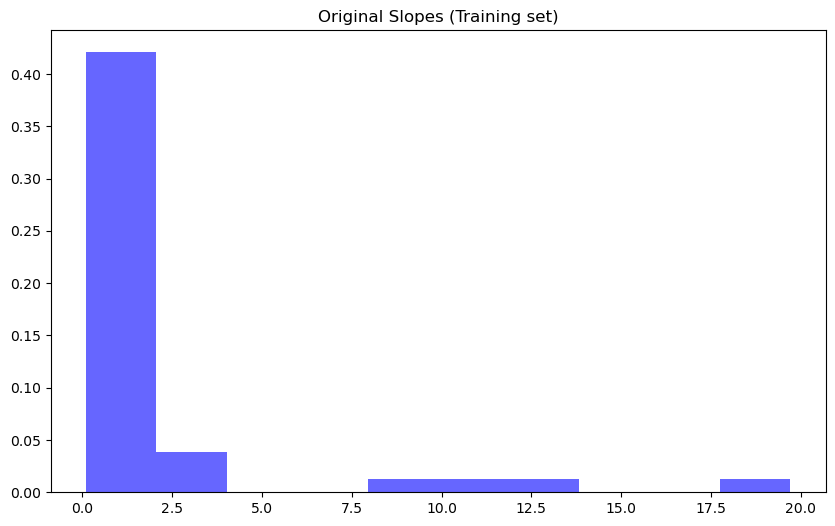

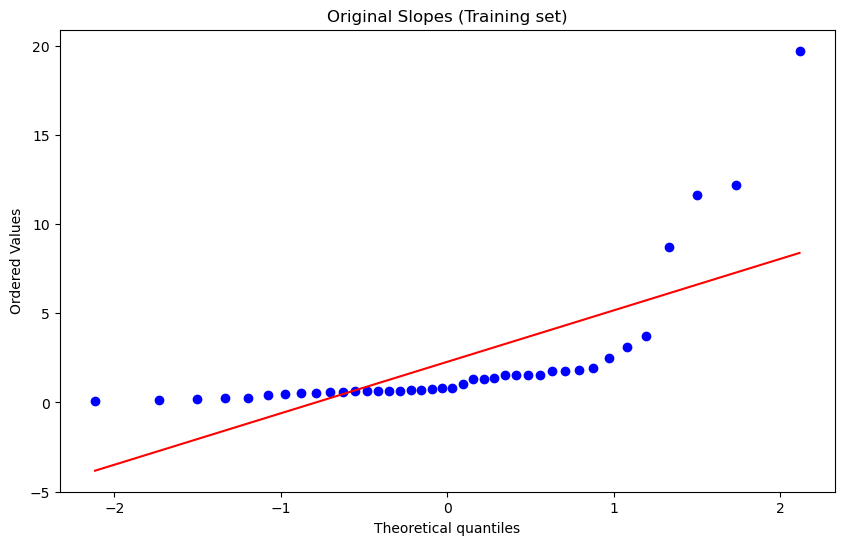

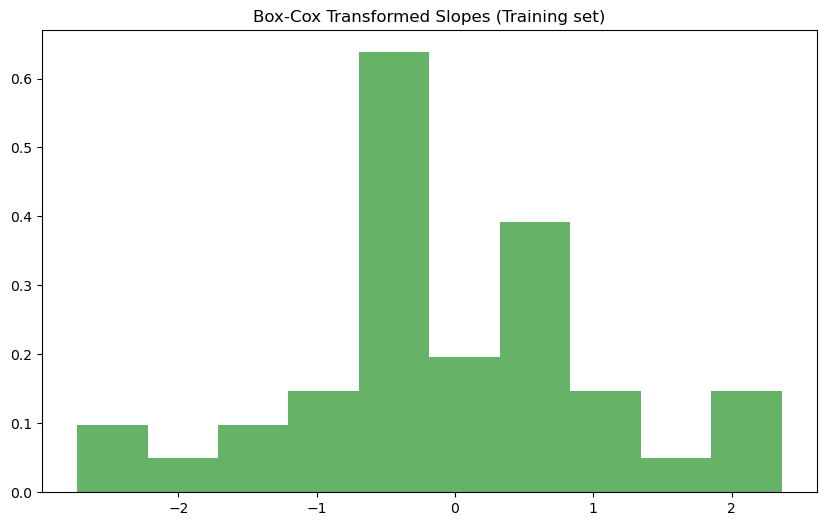

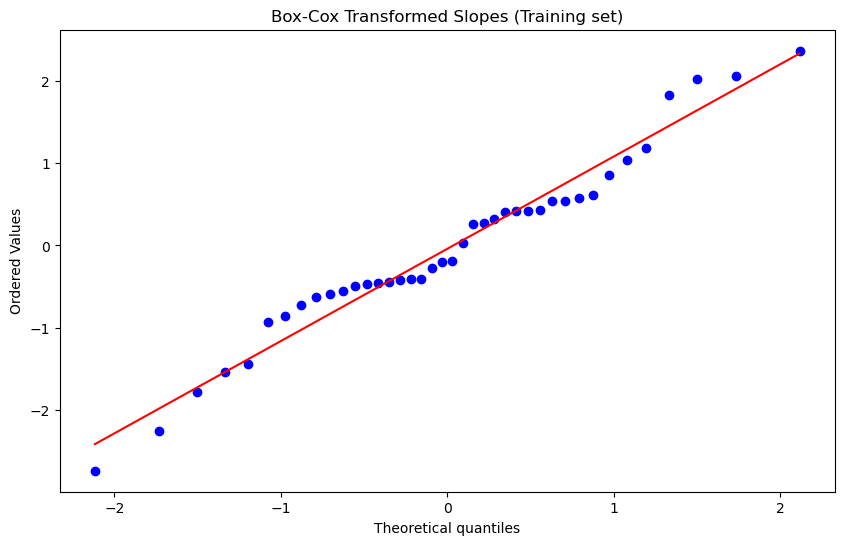

-----------------------------------------------------------------------------------------------------------
MODEL TRAINING: Building an SVR Model using All Applicable Mordred Descriptors
-----------------------------------------------------------------------------------------------------------
Checking for constant and inapplicable descriptors... 

Number of inapplicable descriptors removed: 177

Number of constant descriptors removed: 316

Number of inapplicable descriptors removed: 177

Number of constant descriptors removed: 316

Number of inapplicable descriptors removed: 177

Number of constant descriptors removed: 316

Removing outliers based on threshold...
Number of descriptors dropped due to outlier function: 0

Number of descriptors dropped due to outlier function: 25

Scaling descriptor matrices...
Building an SVR model using all applicable Mordred descriptors... 

Performing grid search hyperparameter optimization...
Fitting 10 folds for each of 18 candidates, totalling 180

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]The number of features selected:  305
Selection process completed. 

Modifying descriptor matrices to use only selected descriptors...
Applying feature selection mask...
Scaling descriptor matrices...
Descriptor matrices scaled. 

Building an SVR model with descriptors selected by RFE... 

Performing grid search hyperparameter optimization...
Fitting

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


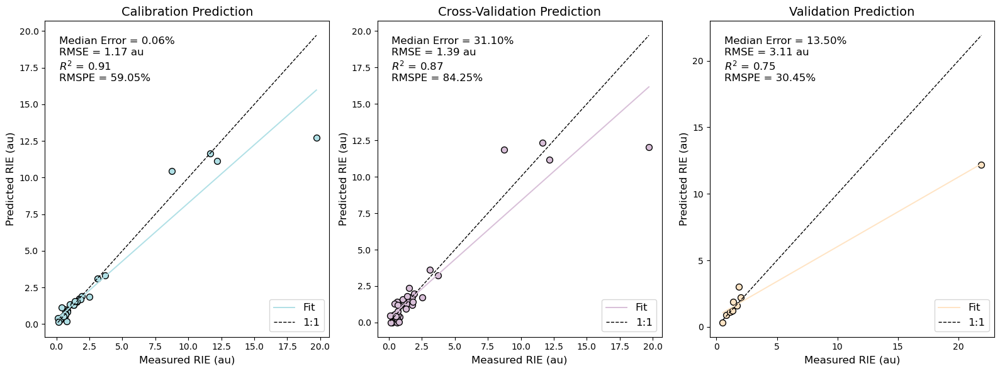

-----------------------------------------------------------------------------------------------------------
                                    RIE Predictor RFE Variable Selection
-----------------------------------------------------------------------------------------------------------


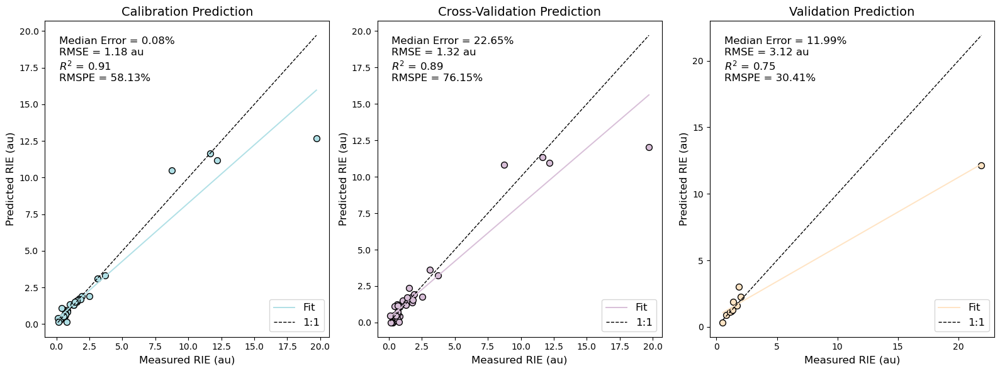

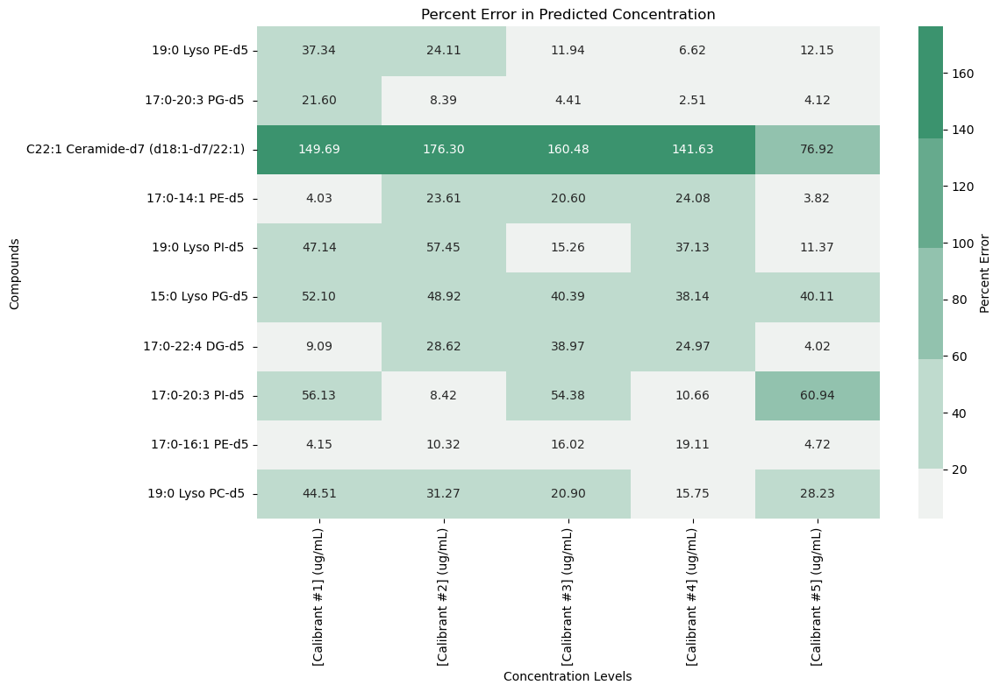

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



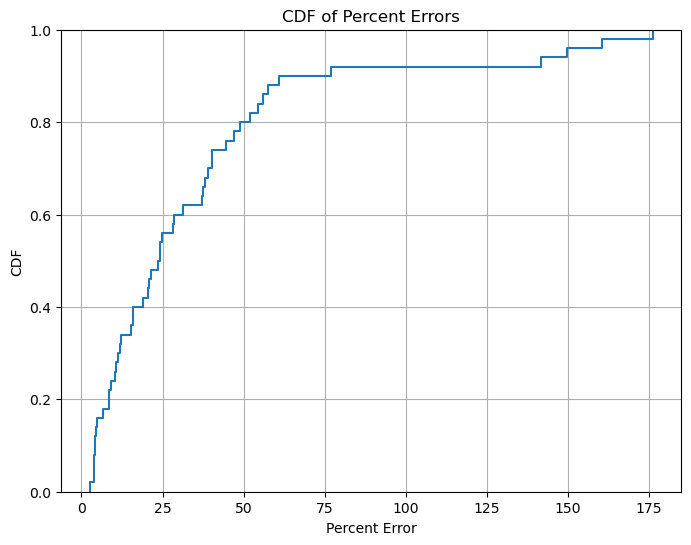

Mean Percent Error: 35.87%
Standard Deviation of Percent Errors: 40.18%
Median Percent Error: 23.84%


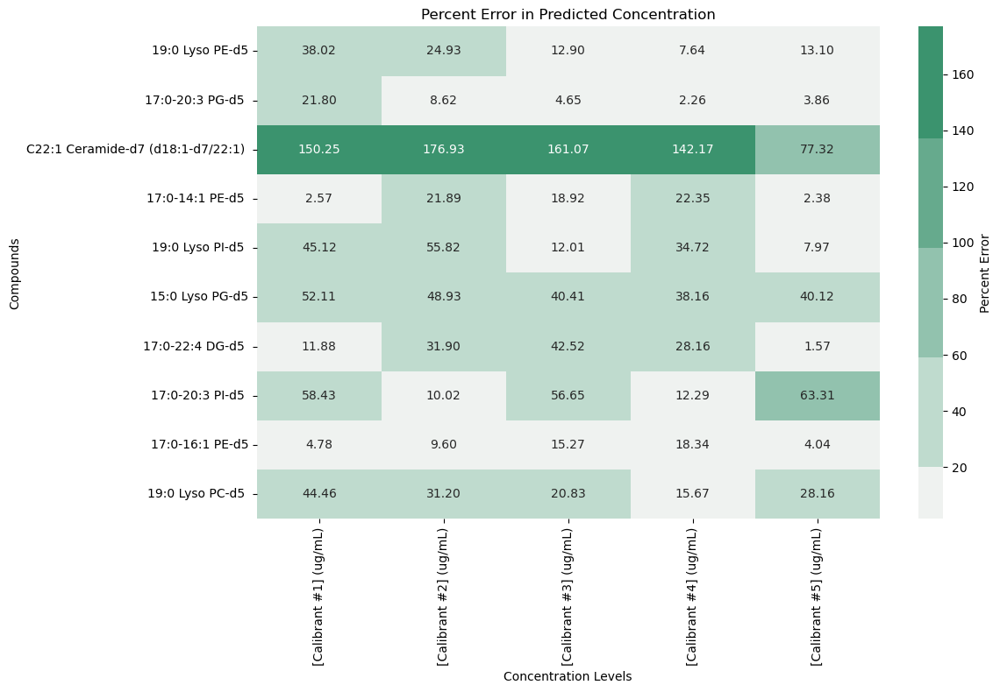

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



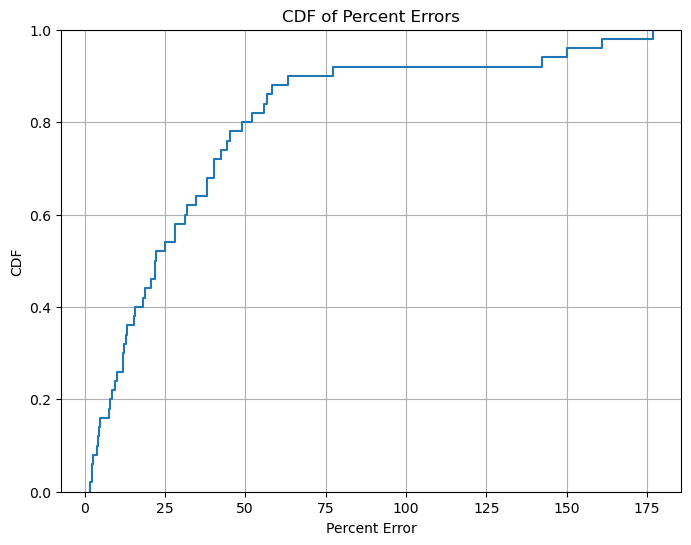

Mean Percent Error: 35.96%
Standard Deviation of Percent Errors: 40.47%
Median Percent Error: 22.12%
-----------------------------------------------------------------------------------------------------------
MODEL TRAINING: Building an SVR Model using All Applicable Mordred Descriptors
-----------------------------------------------------------------------------------------------------------
Checking for constant and inapplicable descriptors... 

Number of inapplicable descriptors removed: 177

Number of constant descriptors removed: 316

Number of inapplicable descriptors removed: 177

Number of constant descriptors removed: 316

Number of inapplicable descriptors removed: 177

Number of constant descriptors removed: 316

Removing outliers based on threshold...
Number of descriptors dropped due to outlier function: 0

Number of descriptors dropped due to outlier function: 0

Scaling descriptor matrices...
Building an SVR model using all applicable Mordred descriptors... 

Performing 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]The number of features selected:  50
Selection process completed. 

Modifying descriptor matrices to use only selected descripto

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


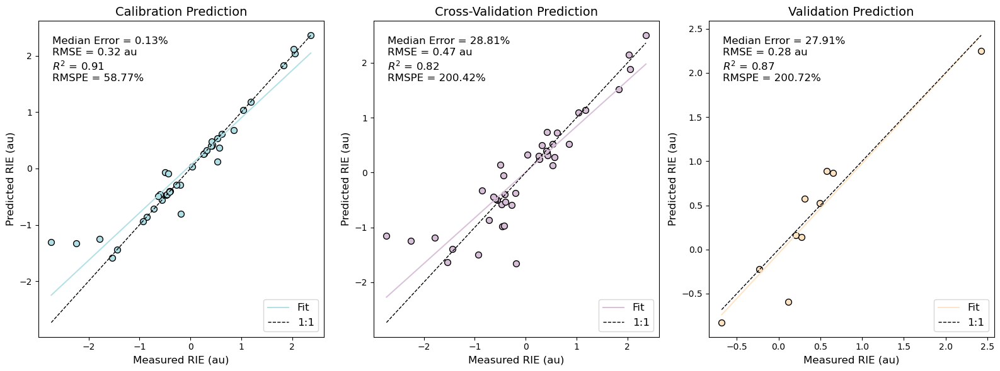

-----------------------------------------------------------------------------------------------------------
                                    RIE Predictor RFE Variable Selection
-----------------------------------------------------------------------------------------------------------


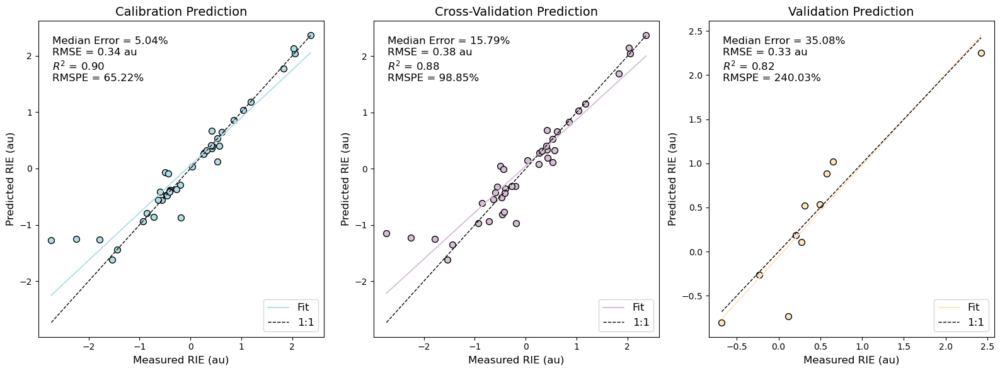

Untransforming predictions...
Untransforming predictions...


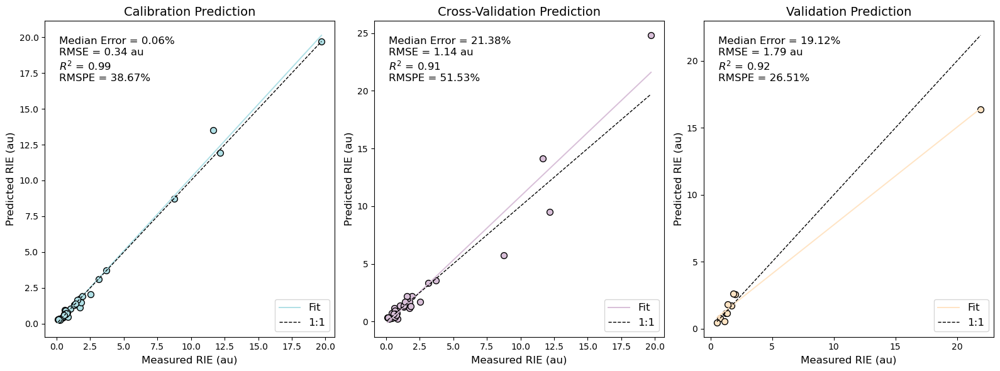

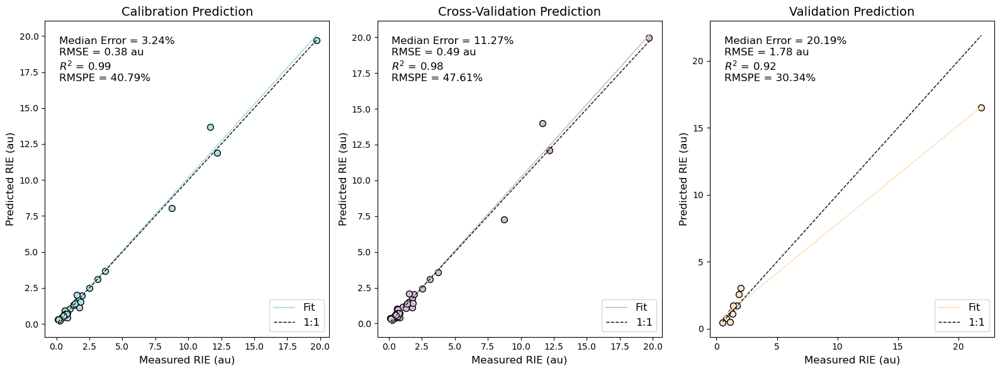

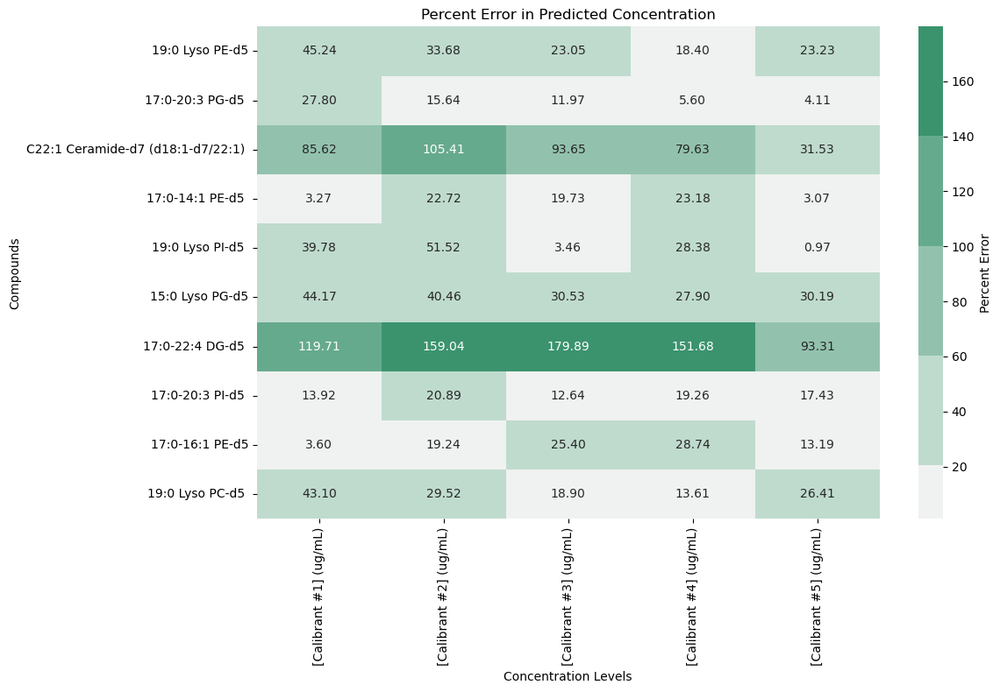

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



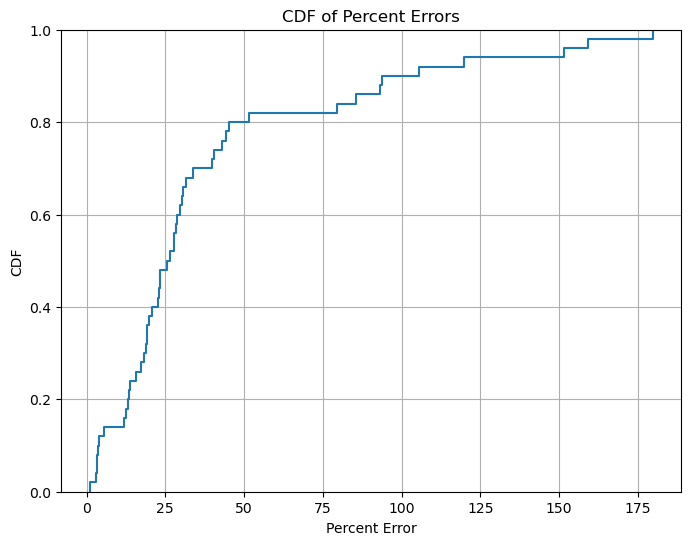

Mean Percent Error: 39.67%
Standard Deviation of Percent Errors: 41.37%
Median Percent Error: 25.91%


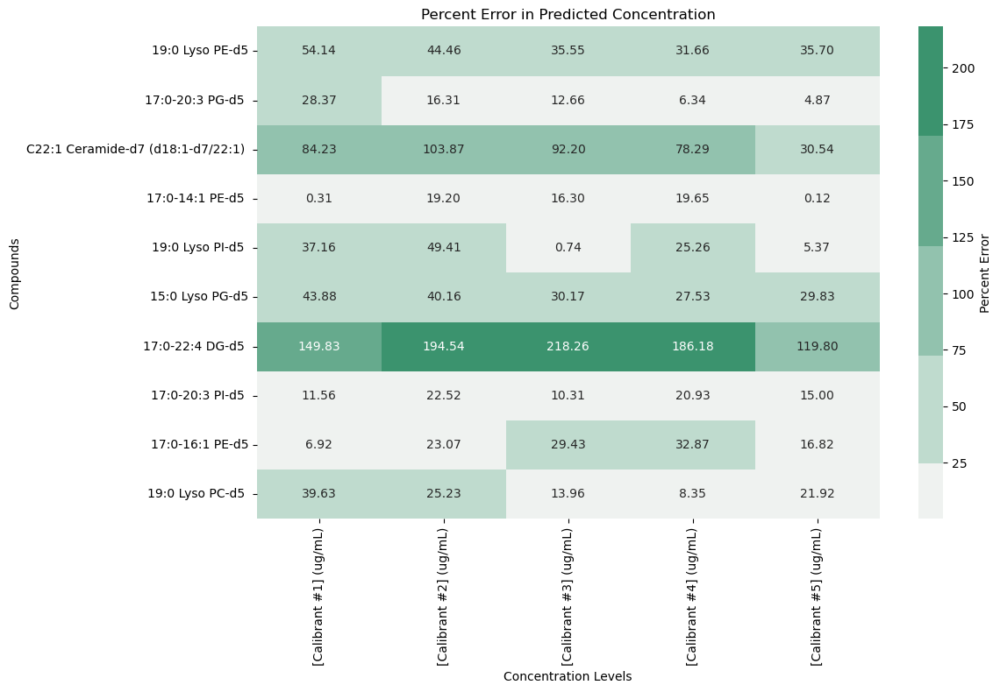

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



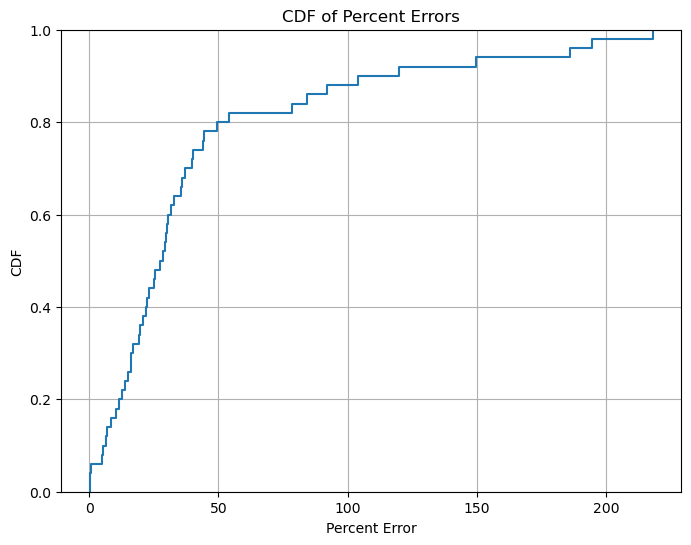

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



Mean Percent Error: 43.43%
Standard Deviation of Percent Errors: 49.92%
Median Percent Error: 27.95%
      Dataset  Mean Error (%)  Standard Deviation (%)  Median Error (%)
0  Normal All       35.871103               40.583782         23.843818
1  Normal RFE       35.961270               40.882355         22.116872
2  BoxCox All       39.668180               41.786724         25.905693
3  BoxCox RFE       43.428067               50.429766         27.950452


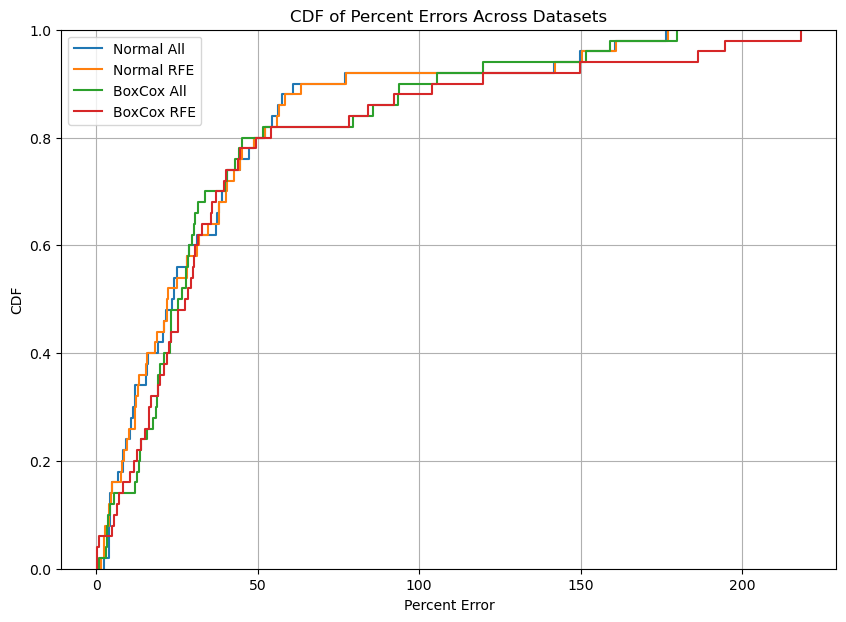

In [22]:
#Median of medians
Train_Book = experiment_results[80][878]['Train_Book']
Test_Book = experiment_results[80][878]['Test _Book']

#display(list(Train_Book['Input']))

X_train_raw = calculate_descriptors(list(Train_Book['Input']), input_type="SMILES")
X_test_raw = calculate_descriptors(list(Test_Book['Input']), input_type="SMILES")
X_target_raw = calculate_descriptors(list(Target_Book['Input']), input_type="SMILES")
verbose=True



# Step 2: Plot individual relative response vs. concentration
if verbose: print("____________________________________________________TRAIN DATA____________________________________________________")
slopes_train, intercepts_train, r2_values_train, results_df_train = plot_individual_relative_response_vs_concentration(
    Train_Book, TrainTest_Internal_Standard_Row, plot_graphs=verbose, display_table=verbose, verbose=verbose)

if verbose: print("____________________________________________________TEST DATA____________________________________________________")
slopes_test, intercepts_test, r2_values_test, results_df_test = plot_individual_relative_response_vs_concentration(
    Test_Book, TrainTest_Internal_Standard_Row, plot_graphs=verbose, display_table=verbose, verbose=verbose)


# Step 3: Filter datasets by results
threshold = 0.8  # Or any threshold value you want
results_dfs_names = [(results_df_train, 'results_df_train'), (results_df_test, 'results_df_test')]
input_books_names = [(Train_Book, 'Train_Book'), (Test_Book, 'Test_Book')]
descriptor_books_names = [(X_train_raw, 'X_train'), (X_test_raw, 'X_test')]




filtered_books_tuples, filtered_results_tuples, filtered_descriptors_tuples = filter_datasets_by_results(
    threshold, results_dfs_names, input_books_names, descriptor_books_names, verbose=verbose)

# Unpack the tuples to extract the DataFrames and their names, if needed
(filtered_train_book, _), (filtered_test_book, _) = filtered_books_tuples
(filtered_train_results, _), (filtered_test_results, _) = filtered_results_tuples
(filtered_X_train, _), (filtered_X_test, _) = filtered_descriptors_tuples

# Step 4: Box-Cox transform and plot
transformed_train, transformed_test, lambda_value = box_cox_transform_and_plot(
    filtered_train_results['Slope'].values, filtered_test_results['Slope'].values, plot_graphs=verbose, verbose=verbose)

# Step 5: Initial RIE prediction
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL TRAINING: Building an SVR Model using All Applicable Mordred Descriptors")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
X_train_clean, X_test_clean, X_target_clean, X_train_scaled, model, grid_results, y_train_predicted, y_train_cross_validation, y_test_predicted, y_target_predicted = initial_rie_prediction(
    filtered_X_train, list(filtered_train_results['Slope'].values), filtered_X_test, list(filtered_test_results['Slope'].values), X_target_raw, remove_outlier=True, threshold=3, verbose=verbose)

# Step 6: Model simplification with RFE
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL SIMPLIFICATION: Building an SVR Model using Recursive Feature Elimination")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
rfecv = rfe_variable_selection(X_train_scaled, list(filtered_train_results['Slope'].values), grid_results, verbose=verbose)

model_rfe, grid_result_rfe, X_test_rfe, y_train_predicted_rfe, y_train_cross_validation_rfe, y_test_predicted_rfe, y_target_predicted_rfe = rfe_rie_prediction(
    X_train_clean, list(filtered_train_results['Slope'].values), X_test_clean, list(filtered_test_results['Slope'].values), X_target_clean, rfecv, verbose=verbose)

#### Sometimes the predictions are negative when the model is poor; we'll make them zero instead. ####

# Convert lists to numpy arrays for efficient computation
y_train_predicted = np.maximum(0, np.array(y_train_predicted))
y_train_cross_validation = np.maximum(0, np.array(y_train_cross_validation))
y_test_predicted = np.maximum(0, np.array(y_test_predicted))
y_target_predicted = np.maximum(0, np.array(y_target_predicted))

y_train_predicted_rfe = np.maximum(0, np.array(y_train_predicted_rfe))
y_train_cross_validation_rfe = np.maximum(0, np.array(y_train_cross_validation_rfe))
y_test_predicted_rfe = np.maximum(0, np.array(y_test_predicted_rfe))
y_target_predicted_rfe = np.maximum(0, np.array(y_target_predicted_rfe))

# Log the sizes to identify mismatches
if verbose:
    print(f"Lengths:\nTrain True: {len(filtered_train_results['Slope'].values)}, Train Predicted: {len(y_train_predicted)}")
    print(f"Train CV: {len(y_train_cross_validation)}")
    print(f"Test True: {len(filtered_test_results['Slope'].values)}, Test Predicted: {len(y_test_predicted)}")

# Step 7: Model validation
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL VALIDATION")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("                                       RIE Predictor All Descriptors")
if verbose: print("-----------------------------------------------------------------------------------------------------------")

if verbose:

    summary_plot_all = summary_plot(list(filtered_train_results['Slope'].values), list(filtered_test_results['Slope'].values), 
                                    y_train_predicted, y_train_cross_validation, y_test_predicted, 
                                    labelsize=12, legendsize=12, titlesize=14, textsize=12)

if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("                                    RIE Predictor RFE Variable Selection")
if verbose: print("-----------------------------------------------------------------------------------------------------------")

if verbose:

    summary_plot_rfe = summary_plot(list(filtered_train_results['Slope'].values), list(filtered_test_results['Slope'].values), 
                                    y_train_predicted_rfe, y_train_cross_validation_rfe, y_test_predicted_rfe, 
                                    labelsize=12, legendsize=12, titlesize=14, textsize=12)

# Step 8: Percent error calculation
percent_errors_matrix_normal_all = calculate_and_plot_percent_error(
    df=filtered_test_book,
    internal_standard_row=TrainTest_Internal_Standard_Row,
    slopes=list(y_test_predicted),
    plot=verbose,
    verbose=verbose
)
percent_errors_matrix_normal_rfe = calculate_and_plot_percent_error(
    df=filtered_test_book,
    internal_standard_row=TrainTest_Internal_Standard_Row,
    slopes=list(y_test_predicted_rfe),
    plot=verbose,
    verbose=verbose
)

# Step 9: Initial RIE prediction with Box-Cox transformation
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL TRAINING: Building an SVR Model using All Applicable Mordred Descriptors")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
X_train_clean_transformed, X_test_clean_transformed, X_target_clean_transformed, X_train_scaled_transformed, model_transformed, grid_results_transformed, y_train_predicted_transformed, y_train_cross_validation_transformed, y_test_predicted_transformed, y_target_predicted_transformed = initial_rie_prediction(
    filtered_X_train, list(transformed_train), filtered_X_test, list(transformed_test), X_target_raw, remove_outlier=True, threshold=10, verbose=verbose)

# Step 10: Model simplification with RFE (Box-Cox transformed)
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL SIMPLIFICATION: Building an SVR Model using Recursive Feature Elimination")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
rfecv_transformed = rfe_variable_selection(X_train_scaled_transformed, list(transformed_train), grid_results_transformed, verbose=verbose)

model_rfe_transformed, grid_result_rfe_transformed, X_test_rfe_transformed, y_train_predicted_rfe_transformed, y_train_cross_validation_rfe_transformed, y_test_predicted_rfe_transformed, y_target_predicted_rfe_transformed = rfe_rie_prediction(
    X_train_clean_transformed, list(transformed_train), X_test_clean_transformed, list(transformed_test), X_target_clean_transformed, rfecv_transformed, verbose=verbose)

# Step 11: Model validation (Box-Cox transformed)
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL VALIDATION")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("                                       RIE Predictor All Descriptors")
if verbose: print("-----------------------------------------------------------------------------------------------------------")

if verbose:
    summary_plot_all_transformed = summary_plot(list(transformed_train), list(transformed_test), 
                                                y_train_predicted_transformed, y_train_cross_validation_transformed, 
                                                y_test_predicted_transformed, labelsize=12, legendsize=12, 
                                                titlesize=14, textsize=12)

if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("                                    RIE Predictor RFE Variable Selection")
if verbose: print("-----------------------------------------------------------------------------------------------------------")

if verbose:
    summary_plot_rfe_transformed = summary_plot(list(transformed_train), list(transformed_test), 
                                                y_train_predicted_rfe_transformed, y_train_cross_validation_rfe_transformed, 
                                                y_test_predicted_rfe_transformed, labelsize=12, legendsize=12, 
                                                titlesize=14, textsize=12)

# Step 12: Untransform predictions from Box-Cox transformation
y_train_untransformed = box_cox_untransform(list(transformed_train), lambda_value)
y_test_untransformed = box_cox_untransform(list(transformed_test), lambda_value)

y_train_predicted_untransformed, y_train_cross_validation_untransformed, y_test_predicted_untransformed, y_target_predicted_untransformed = untransform_predictions(
    y_train_predicted_transformed, y_train_cross_validation_transformed, y_test_predicted_transformed, y_target_predicted_transformed, lambda_value, verbose=verbose)

y_train_predicted_rfe_untransformed, y_train_cross_validation_rfe_untransformed, y_test_predicted_rfe_untransformed, y_target_predicted_rfe_untransformed = untransform_predictions(
    y_train_predicted_rfe_transformed, y_train_cross_validation_rfe_transformed, y_test_predicted_rfe_transformed, y_target_predicted_rfe_transformed, lambda_value, verbose=verbose)

if verbose:

    summary_plot_all_untransformed = summary_plot(y_train_untransformed, y_test_untransformed, 
                                                  y_train_predicted_untransformed, y_train_cross_validation_untransformed, 
                                                  y_test_predicted_untransformed, labelsize=12, legendsize=12, 
                                                  titlesize=14, textsize=12)

    summary_plot_rfe_untransformed = summary_plot(y_train_untransformed, y_test_untransformed, 
                                                  y_train_predicted_rfe_untransformed, y_train_cross_validation_rfe_untransformed, 
                                                  y_test_predicted_rfe_untransformed, labelsize=12, legendsize=12, 
                                                  titlesize=14, textsize=12)



# Step 13: Calculate percent error for Box-Cox transformed predictions
percent_errors_matrix_boxcox_all = calculate_and_plot_percent_error(
    df=filtered_test_book,
    internal_standard_row=TrainTest_Internal_Standard_Row,
    slopes=list(y_test_predicted_untransformed),
    plot=verbose,
    verbose=verbose
)
percent_errors_matrix_boxcox_rfe = calculate_and_plot_percent_error(
    df=filtered_test_book,
    internal_standard_row=TrainTest_Internal_Standard_Row,
    slopes=list(y_test_predicted_rfe_untransformed),
    plot=verbose,
    verbose=verbose
)

# Step 14: Summarize results
data = {
    "Dataset": ["Normal All", "Normal RFE", "BoxCox All", "BoxCox RFE"],
    "Mean Error (%)": [],
    "Standard Deviation (%)": [],
    "Median Error (%)": []
}

for matrix in [percent_errors_matrix_normal_all, percent_errors_matrix_normal_rfe, percent_errors_matrix_boxcox_all, percent_errors_matrix_boxcox_rfe]:
    mean_error, std_error, median_error = calculate_summary_statistics(matrix)
    data["Mean Error (%)"].append(mean_error)
    data["Standard Deviation (%)"].append(std_error)
    data["Median Error (%)"].append(median_error)

summary_df = pd.DataFrame(data)

if verbose:
    print(summary_df)

if verbose:
    # Uncomment to generate CDF plot
    plt.figure(figsize=(10, 7))
    for matrix, label in zip([percent_errors_matrix_normal_all, percent_errors_matrix_normal_rfe, percent_errors_matrix_boxcox_all, percent_errors_matrix_boxcox_rfe], ["Normal All", "Normal RFE", "BoxCox All", "BoxCox RFE"]):
        flattened_errors = matrix.flatten()
        flattened_errors = flattened_errors[~np.isnan(flattened_errors)]  # Remove NaN values
        sns.ecdfplot(flattened_errors, label=label)
    plt.xlabel('Percent Error')
    plt.ylabel('CDF')
    plt.title('CDF of Percent Errors Across Datasets')
    plt.legend()
    plt.grid(True)
    plt.show()



In [23]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def summary_plot_plotly(y_train, y_test, y_train_predicted, y_train_cross_validation, y_test_predicted, Train_Book, Test_Book, labelsize=12, legendsize=12, titlesize=14, textsize=12):
    # Create figure with subplots
    fig = make_subplots(rows=1, cols=3, subplot_titles=("Calibration Prediction", "Cross-Validation Prediction", "Validation Prediction"))

    # Calibration Prediction Plot
    fig.add_trace(
        go.Scatter(x=y_train, y=y_train_predicted, mode='markers', 
                   marker=dict(color='powderblue', line=dict(color='black', width=1)),
                   text=Train_Book['Name'],
                   hoverinfo='text+y+x'),
        row=1, col=1
    )

    # Cross-Validation Prediction Plot
    fig.add_trace(
        go.Scatter(x=y_train, y=y_train_cross_validation, mode='markers', 
                   marker=dict(color='thistle', line=dict(color='black', width=1)),
                   text=Train_Book['Name'],
                   hoverinfo='text+y+x'),
        row=1, col=2
    )

    # Validation Prediction Plot
    fig.add_trace(
        go.Scatter(x=y_test, y=y_test_predicted, mode='markers', 
                   marker=dict(color='bisque', line=dict(color='black', width=1)),
                   text=Test_Book['Name'],
                   hoverinfo='text+y+x'),
        row=1, col=3
    )

    # Update xaxis properties
    fig.update_xaxes(title_text="Actual", row=1, col=1)
    fig.update_xaxes(title_text="Actual", row=1, col=2)
    fig.update_xaxes(title_text="Actual", row=1, col=3)

    # Update yaxis properties
    fig.update_yaxes(title_text="Predicted", row=1, col=1)
    fig.update_yaxes(title_text="Predicted", row=1, col=2)
    fig.update_yaxes(title_text="Predicted", row=1, col=3)

    # Update layout
    fig.update_layout(height=600, width=1800, title_text="Summary of Predictions", showlegend=False, template=None)
    
    fig.show()

# Example usage
summary_plot_rfe_untransformed = summary_plot_plotly(y_train_untransformed, y_test_untransformed, 
                                              y_train_predicted_rfe_untransformed, y_train_cross_validation_rfe_untransformed, 
                                              y_test_predicted_rfe_untransformed, filtered_train_book, filtered_test_book, labelsize=12, legendsize=12, 
                                              titlesize=14, textsize=12)


In [24]:
# Most of the time, you wouldn't have access to the "true" target slopes. For external evaluation purposes, we will calculate them here.
verbose = True

slopes_target, intercepts_target, r2_values_target, results_df_target = plot_individual_relative_response_vs_concentration(
    Target_Book, Target_Internal_Standard_Row, plot_graphs=verbose, display_table=verbose, verbose=verbose)

Initializing data structures and checking input data...


<timed exec>:122: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Displaying results table...


,Compound,Slope,Intercept,R² Value
0,15:0 Lyso PE-d5,1.354797,0.722513,0.998244
1,17:0 Lyso PE-d5,2.220950,1.495989,0.998717
2,19:0 Lyso PE-d5,1.790339,0.748529,0.998421
3,15:0 Lyso PG-d5,1.610238,0.880362,0.997636
4,17:0 Lyso-PG-d5,2.724501,-1.230629,0.997905
5,19:0 Lyso PG-d5,3.243354,-3.764689,0.994787
6,15:0 Lyso PC-d5,0.210307,0.309953,0.983600
7,17:0 Lyso PC-d5,0.220449,2.248926,0.897160
8,19:0 Lyso PC-d5,0.158313,1.233420,0.841954
9,15:0 Lyso PS-d5,1.156133,0.789737,0.997539


In [25]:
print(len(slopes_target))
print(len(Target_Book['Name']))

import plotly.graph_objects as go

# Example usage:
# Assuming 'slopes_target' is your true values and 'y_test_predicted_rfe_untransformed' are your predicted values
plot_single_prediction_vs_true(y_target_predicted_rfe_untransformed, results_df_target['Slope'], 'Predicted Values', 'True Values')

50
50


In [26]:
import pandas as pd

# Assuming y_train_untransformed, y_train_predicted_rfe_untransformed, etc. are pandas Series
# Assuming Train_Book and Test_Book are pandas DataFrames

# Create DataFrame for the first sheet
df1 = pd.DataFrame({
    'Name': filtered_train_book['Name'],
    'y_train': y_train_untransformed,
    'y_train_predicted_rfe_untransformed': y_train_predicted_rfe_untransformed,
    'y_train_cross_validation_rfe_untransformed': y_train_cross_validation_rfe_untransformed
})

# Create DataFrame for the second sheet
df2 = pd.DataFrame({
    'Name': filtered_test_book['Name'],
    'y_test': y_test_untransformed,
    'y_test_predicted_rfe_untransformed': y_test_predicted_rfe_untransformed
})

# Create DataFrame for the third sheet
df3 = pd.DataFrame({
    'Name': Target_Book['Name'],
    'y_target': results_df_target['Slope'],
    'y_target_predicted_rfe_untransformed': y_target_predicted_rfe_untransformed
})

display(df1, df2, df3)

,Name,y_train,y_train_predicted_rfe_untransformed,y_train_cross_validation_rfe_untransformed
0,17:0-18:1 PI-d5,0.446564,0.476056,0.557556
1,C16:1 Ceramide-d7 (d18:1-d7/16:1),8.734722,8.049530,7.251554
2,17:0-16:1 PG-d5,1.542945,1.448896,1.421085
3,17:0 Lyso PS-d5,0.274779,0.274725,0.296037
4,17:0-16:1 DG-d5,0.209262,0.316581,0.321309
5,17:0-14:1 PC-d5,0.637272,0.637432,0.612015
6,17:0 Lyso PC-d5,1.554247,1.505468,1.216577
7,17:0 Lyso PE-d5,2.512194,2.513451,2.431724
8,20:1 SM (d18:1/20:1)-d9,0.623151,0.932465,1.048749
9,17:0-14:1 PG-d5,1.522974,1.523292,1.528111


,Name,y_test,y_test_predicted_rfe_untransformed
0,19:0 Lyso PE-d5,1.989986,3.048825
1,17:0-20:3 PG-d5,1.671910,1.747159
2,C22:1 Ceramide-d7 (d18:1-d7/22:1),21.910285,16.497121
3,17:0-14:1 PE-d5,1.230777,1.209096
4,19:0 Lyso PI-d5,0.798327,0.771308
5,15:0 Lyso PG-d5,1.838312,2.592215
6,17:0-22:4 DG-d5,1.120712,0.500359
7,17:0-20:3 PI-d5,0.524071,0.469915
8,17:0-16:1 PE-d5,1.320592,1.113676
9,19:0 Lyso PC-d5,1.376121,1.721127


,Name,y_target,y_target_predicted_rfe_untransformed
0,15:0 Lyso PE-d5,1.354797,2.033944
1,17:0 Lyso PE-d5,2.220950,2.513451
2,19:0 Lyso PE-d5,1.790339,3.048825
3,15:0 Lyso PG-d5,1.610238,2.592215
4,17:0 Lyso-PG-d5,2.724501,3.118854
5,19:0 Lyso PG-d5,3.243354,3.695159
6,15:0 Lyso PC-d5,0.210307,0.237284
7,17:0 Lyso PC-d5,0.220449,0.274725
8,19:0 Lyso PC-d5,0.158313,0.313685
9,15:0 Lyso PS-d5,1.156133,1.302733


In [27]:
import pandas as pd
from datetime import datetime
import openpyxl  # Make sure this is installed

# Generate a timestamp in the format YYYYMMDD-HHMMSS
timestamp = datetime.now().strftime("%Y%m%d-%H%M%S")

# Define the path with the timestamp included before the file extension
path = f'C:/Users/mrain/OneDrive/Documents/SQRAPIE_OKR_MAR/negative_train80_test20_iteration878_D1USM_D2USM_{timestamp}.xlsx'

# Create a Pandas Excel writer using openpyxl as the engine
with pd.ExcelWriter(path, engine='openpyxl') as writer:
    # Write DataFrames to Excel without the index
    df1.to_excel(writer, sheet_name='Train Data', index=False)
    df2.to_excel(writer, sheet_name='Test Data', index=False)
    df3.to_excel(writer, sheet_name='Target Data', index=False)

# The workbook is automatically saved after exiting the 'with' block.

# Open the workbook and adjust column widths
wb = openpyxl.load_workbook(path)
for sheet_name in wb.sheetnames:
    sheet = wb[sheet_name]
    for col in sheet.columns:
        max_length = 0
        column = col[0].column_letter  # Get the column name
        for cell in col:
            try:  # Necessary to avoid error on empty cells
                if len(str(cell.value)) > max_length:
                    max_length = len(str(cell.value))
            except:
                pass
        adjusted_width = (max_length + 2)  # Adding a little extra space
        sheet.column_dimensions[column].width = adjusted_width

# Save the changes to the workbook
wb.save(path)
print("Last saved at: ", timestamp)

Last saved at:  20240705-140956


# Section 10: Evaluating Impact of Biological Matrices (D1 USM $\rightarrow$ D2 USM)

In [28]:
print("The length of the traning set was:", len(y_train_predicted_rfe_transformed))
print("The length of the test set was:", len(y_test_predicted_rfe_transformed))
print("The full length of the target set was:", len(y_target_predicted_rfe_transformed))

print("The number of molecules from the target illustrated in the heat maps is:", len(y_train_predicted_rfe_transformed)+len(y_test_predicted_rfe_transformed))

The length of the traning set was: 40
The length of the test set was: 10
The full length of the target set was: 50
The number of molecules from the target illustrated in the heat maps is: 50


Mean Percent Error: 27.81%
Standard Deviation of Percent Errors: 30.12%
Median Percent Error: 18.76%
Mean Percent Error: 46.01%
Standard Deviation of Percent Errors: 51.19%
Median Percent Error: 31.07%


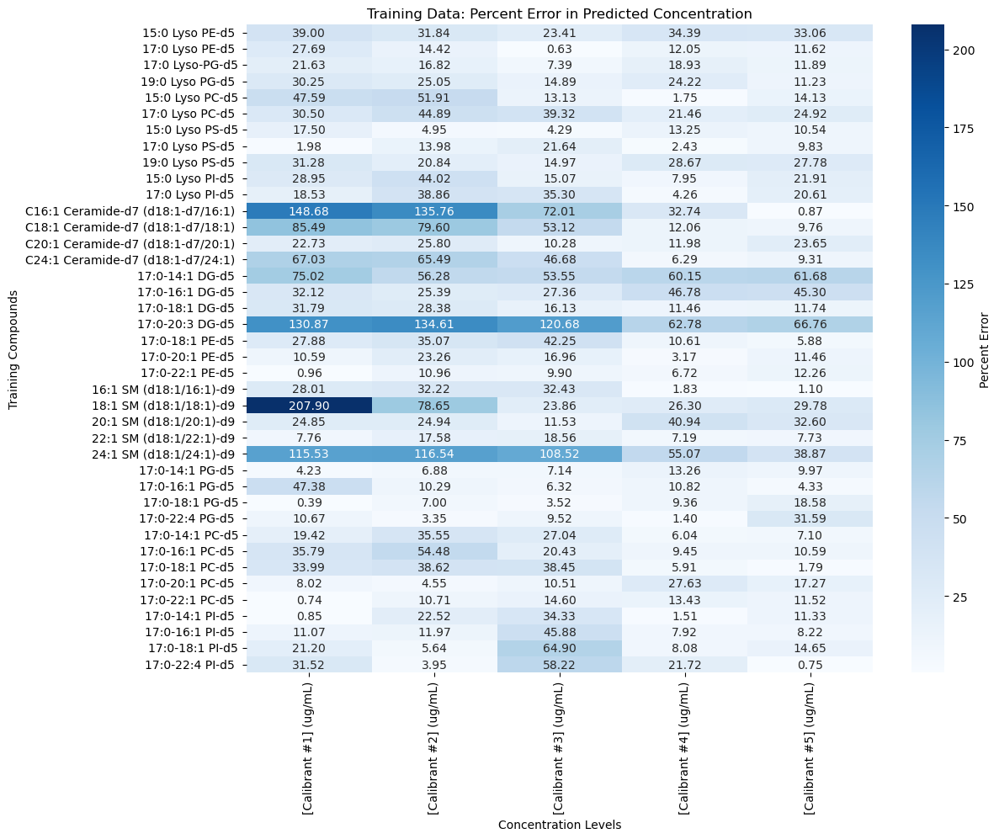

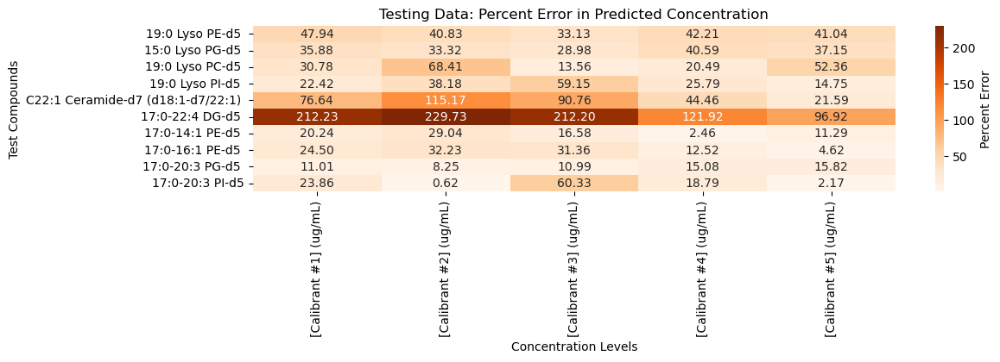

Train Mean:  27.808244623597503
Train Median:  18.757934876250765
Test Mean:  46.007096964823205
Test Median:  31.065531508361705


In [29]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have loaded your DataFrame 'filtered_train_book', 'filtered_test_book', and 'Target_Book'
# Normalize the names to make them consistent

def normalize_name(name):
    # Replace multiple non-alphanumeric characters with a single space
    # This handles cases like "Lyso PG-d5" -> "Lyso-PG-d5" by turning both into "Lyso PG d5"
    return pd.Series(name).replace('[^\w\s]', ' ', regex=True).str.replace('\s+', ' ', regex=True).str.strip()

# Apply normalization
train_names = set(normalize_name(filtered_train_book['Name']))
test_names = set(normalize_name(filtered_test_book['Name']))
Target_Book['Cleaned_Name'] = normalize_name(Target_Book['Name'])

# Filter the DataFrame using these normalized names
train_data = Target_Book[Target_Book['Cleaned_Name'].isin(train_names)]
test_data = Target_Book[Target_Book['Cleaned_Name'].isin(test_names)]

# Assuming the 'calculate_and_plot_percent_error' function is adjusted to not plot internally
# Calculate percent errors for training data
train_percent_errors = calculate_and_plot_percent_error(
    df=train_data,
    internal_standard_row=Target_Internal_Standard_Row,
    slopes=list(y_target_predicted_rfe_untransformed),
    plot=False,
    verbose=True
)

# Calculate percent errors for testing data
test_percent_errors = calculate_and_plot_percent_error(
    df=test_data,
    internal_standard_row=Target_Internal_Standard_Row,
    slopes=list(y_target_predicted_rfe_untransformed),
    plot=False,
    verbose=True
)

concentration_columns = [col for col in Target_Book.columns if "(ug/mL)" in col][1:]  # Skip the first column

# Calculate percent errors, ensuring the first column is excluded from the matrix
train_percent_errors_adjusted = train_percent_errors[:, 1:]  # Exclude the first column from data
test_percent_errors_adjusted = test_percent_errors[:, 1:]  # Exclude the first column from data


# Function to calculate the optimal figure height based on the number of rows
def calculate_fig_height(num_rows):
    base_height = 0.25  # Set base height per row in inches
    additional_height = 0  # Additional height for labels, title, etc.
    return num_rows * base_height + additional_height

# Plot training data heatmap with dynamic size
train_fig_height = calculate_fig_height(train_percent_errors_adjusted.shape[0])
plt.figure(figsize=(12, train_fig_height))
sns.heatmap(train_percent_errors_adjusted, annot=True, fmt=".2f", cmap='Blues', cbar_kws={'label': 'Percent Error'},
            xticklabels=concentration_columns, yticklabels=train_data['Name'])
plt.title("Training Data: Percent Error in Predicted Concentration")
plt.xlabel("Concentration Levels")
plt.ylabel("Training Compounds")
plt.show()

# Plot testing data heatmap with dynamic size
test_fig_height = calculate_fig_height(test_percent_errors_adjusted.shape[0])
plt.figure(figsize=(12, test_fig_height))
sns.heatmap(test_percent_errors_adjusted, annot=True, fmt=".2f", cmap='Oranges', cbar_kws={'label': 'Percent Error'},
            xticklabels=concentration_columns, yticklabels=test_data['Name'])
plt.title("Testing Data: Percent Error in Predicted Concentration")
plt.xlabel("Concentration Levels")
plt.ylabel("Test Compounds")
plt.show()

print("Train Mean: ", np.mean(train_percent_errors_adjusted))
print("Train Median: ", np.median(train_percent_errors_adjusted))

print("Test Mean: ", np.mean(test_percent_errors_adjusted))
print("Test Median: ", np.median(test_percent_errors_adjusted))

# Section 11: Measuring Model Accuracy for Novel Analytes within Donor (D1 USM -> D1 SM)

Run the selected model from Donor 1 Ultimate Splash on the Donor 1 Splash mix!

In [30]:
# Specify the paths to your Excel files here
traintest_file_path = 'C:/Users/mrain/OneDrive/Documents/SQRAPIE_OKR_MAR/Negative_15_B1_D1_Neg_F_Input_Blank_no6.xlsx'
target_file_path = 'C:/Users/mrain/Downloads/D1_Neg_ExternalVal_Input_Blank.xlsx'

# Read the Excel files into pandas DataFrames
TrainTest_Book = pd.read_excel(traintest_file_path)
Target_Book_Initial = pd.read_excel(target_file_path)

# Assuming calculate_descriptors function accepts pandas DataFrames and operates on them
X_traintest_complete = calculate_descriptors(TrainTest_Book['Input'][1:], input_type="SMILES")
X_target_complete = calculate_descriptors(Target_Book_Initial['Input'][1:], input_type="SMILES")

Converted 50 identifiers to molecules.


 40%|████      | 20/50 [00:02<00:02, 10.76it/s]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

 56%|█████▌    | 28/50 [00:02<00:01, 15.33it/s]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

 82%|████████▏ | 41/50 [00:02<00:00, 26.98it/s]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

100%|██████████| 50/50 [00:02<00:00, 18.15it/s]


Converted 8 identifiers to molecules.


100%|██████████| 8/8 [00:01<00:00,  6.30it/s]


C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

In [31]:
# Step 1: Select and split input files
Train_Book, Test_Book, Target_Book, X_train_raw, X_test_raw, X_target_raw, TrainTest_Internal_Standard_Row, Target_Internal_Standard_Row = select_input_files_playground(
    TrainTest_Book, Target_Book_Initial, X_traintest_complete, X_target_complete, split_percentage=80, verbose=True)

Extracting internal standard rows...
Shuffling and splitting the TrainTest_Book and X_traintest DataFrames together...
Data splitting complete.


Converted 40 identifiers to molecules.


C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

 50%|█████     | 20/40 [00:02<00:01, 10.78it/s]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

100%|██████████| 40/40 [00:02<00:00, 16.44it/s]


C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
Converted 10 identifiers to molecules.


 10%|█         | 1/10 [00:01<00:10,  1.20s/it]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


100%|██████████| 10/10 [00:01<00:00,  5.44it/s]


C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
Converted 8 identifiers to molecules.


100%|██████████| 8/8 [00:01<00:00,  6.88it/s]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

<timed exec>:122: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Displaying results table...


,Compound,Slope,Intercept,R² Value
0,17:0-18:1 PI-d5,0.446564,-0.648961,0.980794
1,C16:1 Ceramide-d7 (d18:1-d7/16:1),8.734722,170.618804,0.959219
2,17:0-16:1 PG-d5,1.542945,0.860446,0.999584
3,17:0 Lyso PS-d5,0.274779,-2.457426,0.940282
4,17:0-16:1 DG-d5,0.209262,0.423069,0.997645
5,17:0-14:1 PC-d5,0.637272,4.182932,0.970622
6,17:0 Lyso PC-d5,1.554247,5.521030,0.987048
7,17:0 Lyso PE-d5,2.512194,-2.591429,0.998936
8,20:1 SM (d18:1/20:1)-d9,0.623151,2.043452,0.970209
9,17:0-14:1 PG-d5,1.522974,1.048163,0.996913


____________________________________________________TEST DATA____________________________________________________
Initializing data structures and checking input data...


<timed exec>:122: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Displaying results table...


,Compound,Slope,Intercept,R² Value
0,19:0 Lyso PE-d5,1.989986,-0.429053,0.998663
1,17:0-20:3 PG-d5,1.671910,-2.693272,0.999650
2,C22:1 Ceramide-d7 (d18:1-d7/22:1),21.910285,205.668483,0.965017
3,17:0-14:1 PE-d5,1.230777,2.239994,0.990607
4,19:0 Lyso PI-d5,0.798327,-1.989332,0.978811
5,15:0 Lyso PG-d5,1.838312,-0.406924,0.999501
6,17:0-22:4 DG-d5,1.120712,4.348142,0.973005
7,17:0-20:3 PI-d5,0.524071,-2.096480,0.974446
8,17:0-16:1 PE-d5,1.320592,2.707920,0.995130
9,19:0 Lyso PC-d5,1.376121,1.185560,0.992149


Shapiro-Wilk test for the initial slopes (Training set): ShapiroResult(statistic=0.5194166898727417, pvalue=2.896146378272846e-10)
Best-fitting lambda value for training set: -0.16298848081335496
Shapiro-Wilk test for Box-Cox transformed slopes (Training set): ShapiroResult(statistic=0.9716009497642517, pvalue=0.4038936495780945)


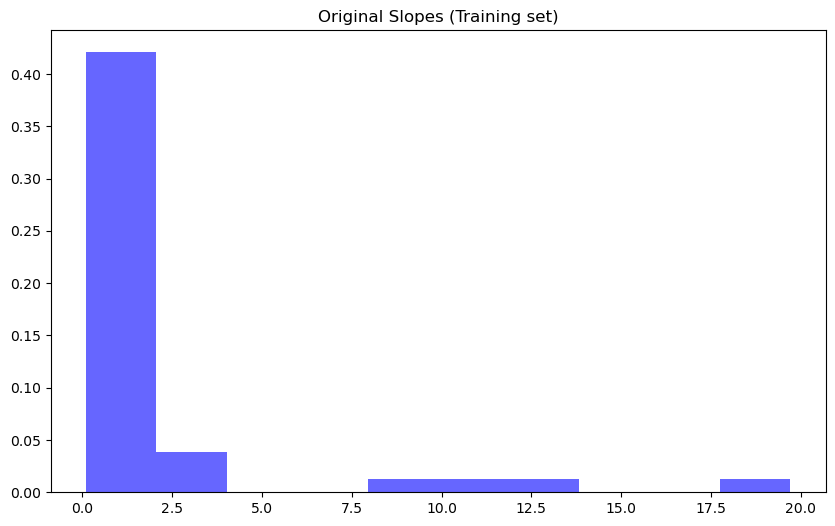

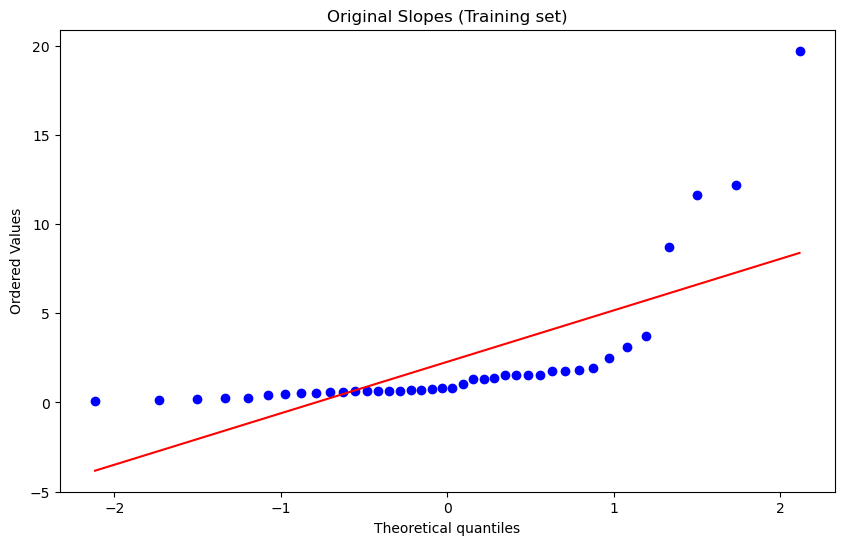

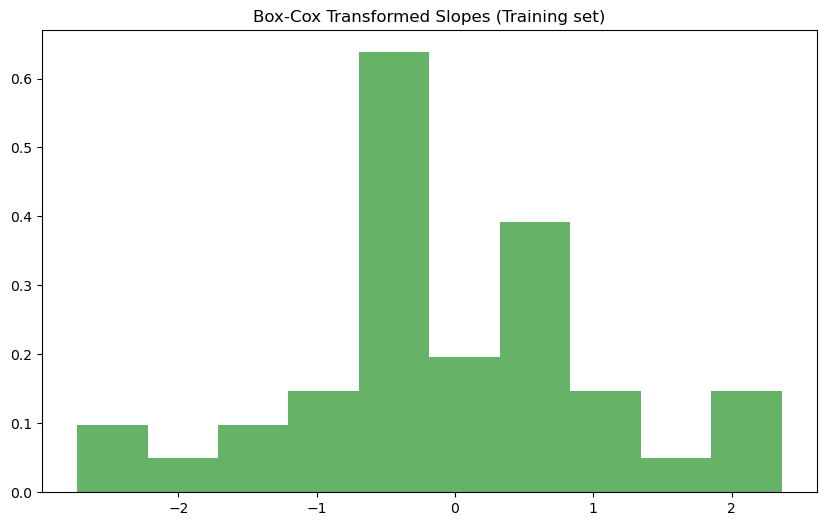

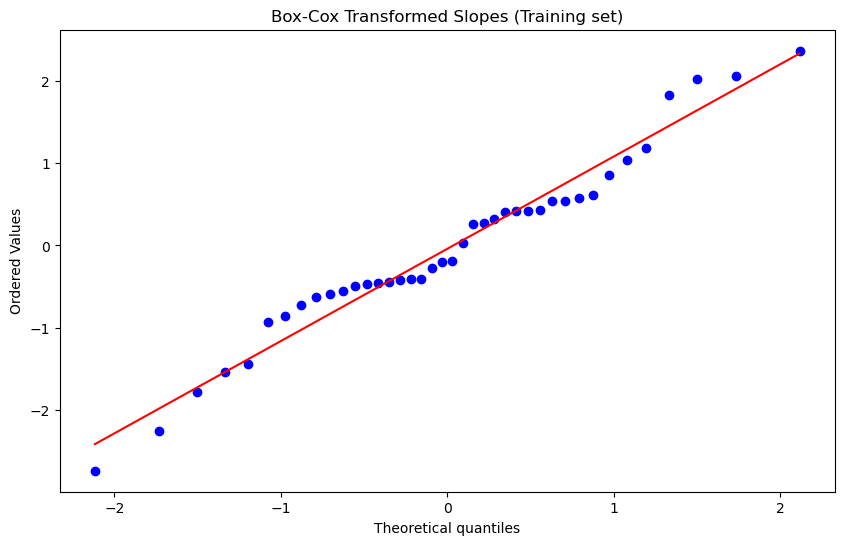

-----------------------------------------------------------------------------------------------------------
MODEL TRAINING: Building an SVR Model using All Applicable Mordred Descriptors
-----------------------------------------------------------------------------------------------------------
Checking for constant and inapplicable descriptors... 

Number of inapplicable descriptors removed: 177

Number of constant descriptors removed: 316

Number of inapplicable descriptors removed: 177

Number of constant descriptors removed: 316

Number of inapplicable descriptors removed: 171

Number of constant descriptors removed: 316

Removing outliers based on threshold...
Number of descriptors dropped due to outlier function: 0

Number of descriptors dropped due to outlier function: 13

Scaling descriptor matrices...
Building an SVR model using all applicable Mordred descriptors... 

Performing grid search hyperparameter optimization...
Fitting 10 folds for each of 18 candidates, totalling 180

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]The number of features selected:  277
Selection process completed. 

Modifying descriptor matrices to use only selected descriptors...
Applying feature selection mask...
Scaling descriptor matrices...
Descriptor matrices scaled. 

Building an SVR model with descriptors selected by RFE... 

Performing grid search hyperp

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


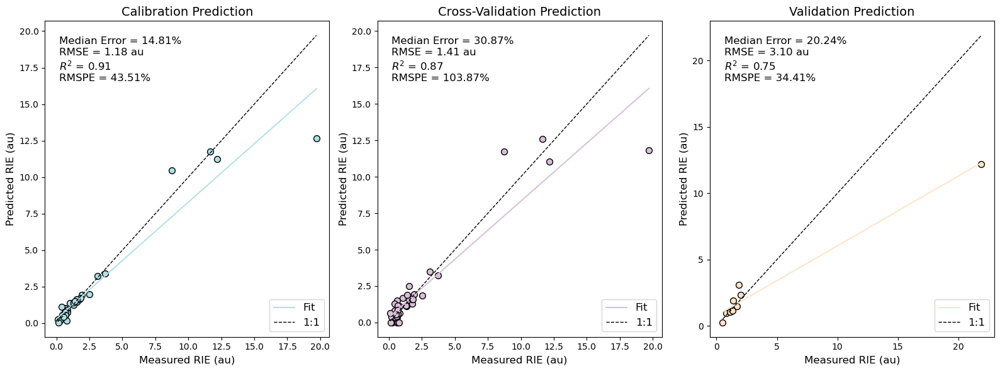

-----------------------------------------------------------------------------------------------------------
                                    RIE Predictor RFE Variable Selection
-----------------------------------------------------------------------------------------------------------


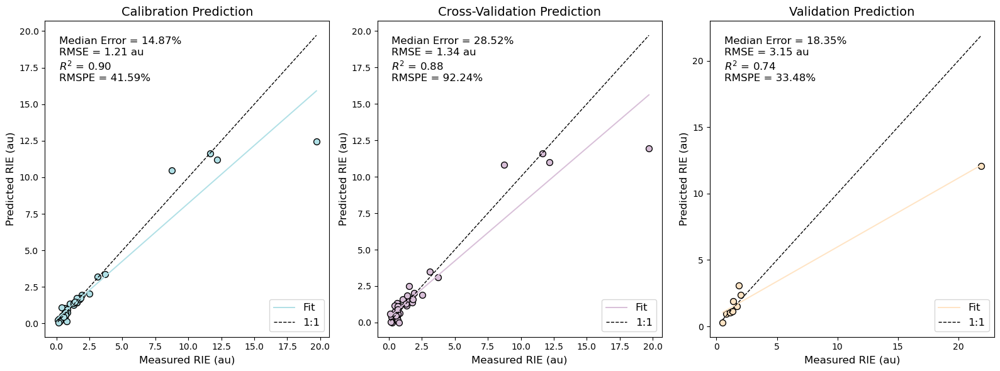

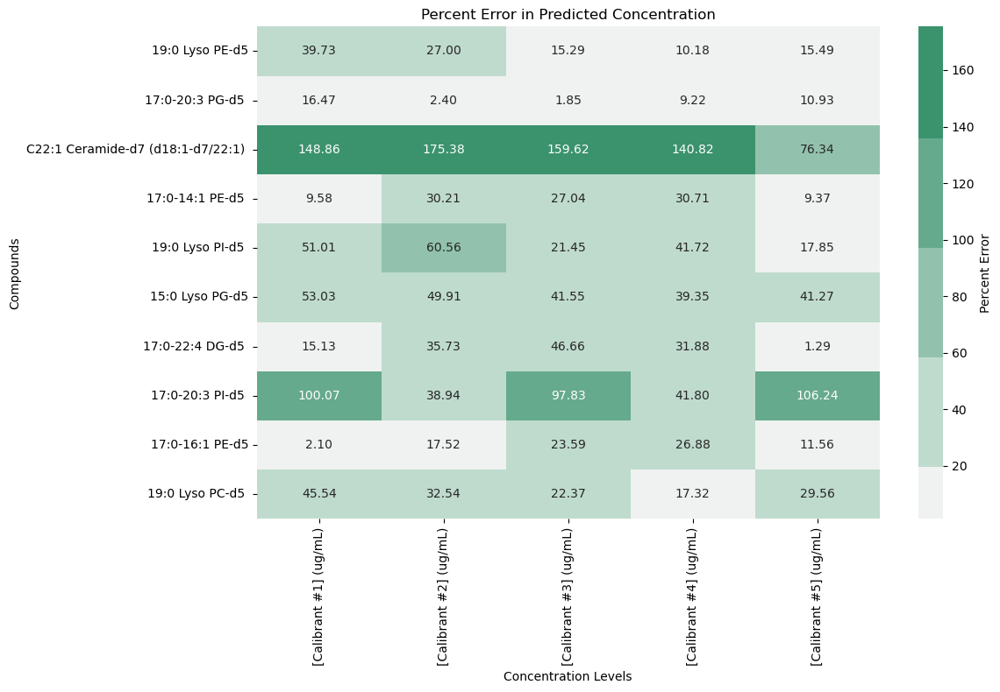

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



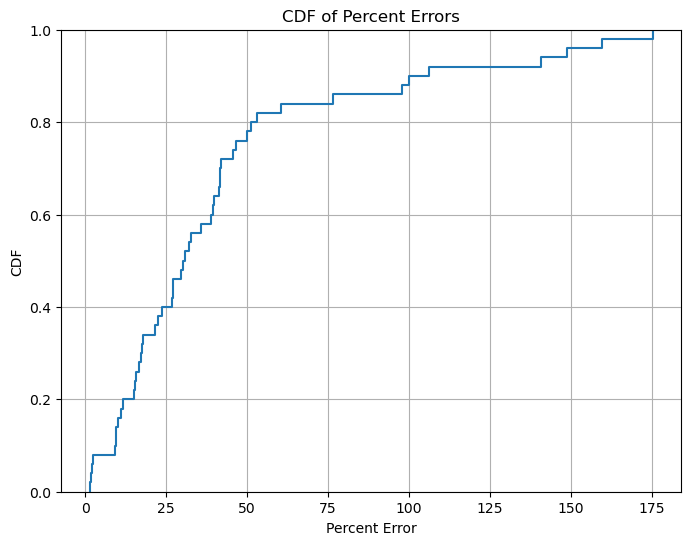

Mean Percent Error: 42.37%
Standard Deviation of Percent Errors: 41.19%
Median Percent Error: 30.46%


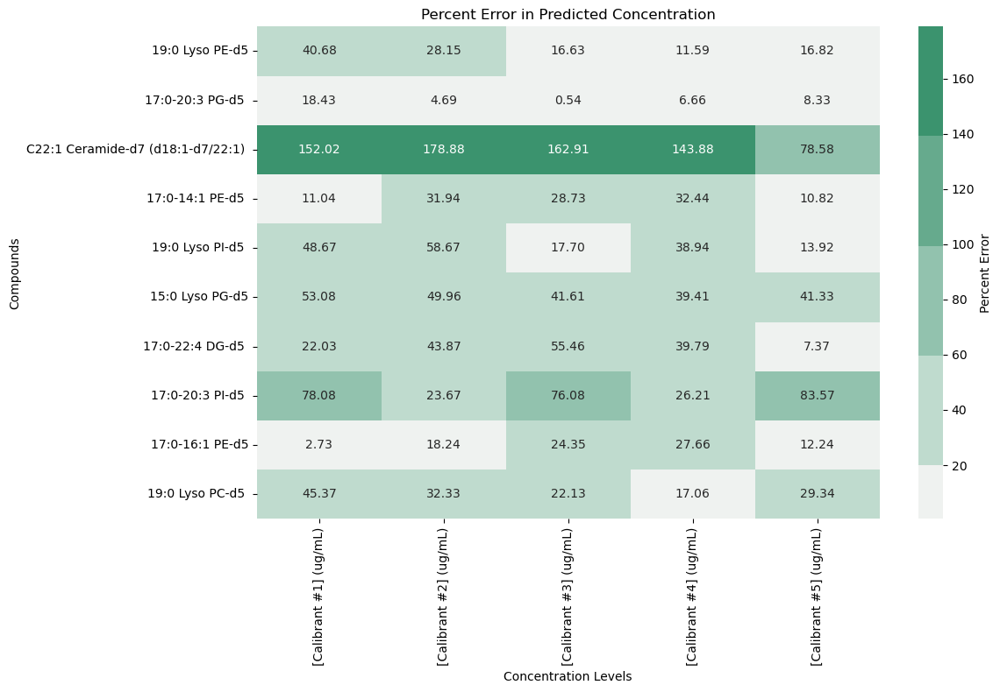

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



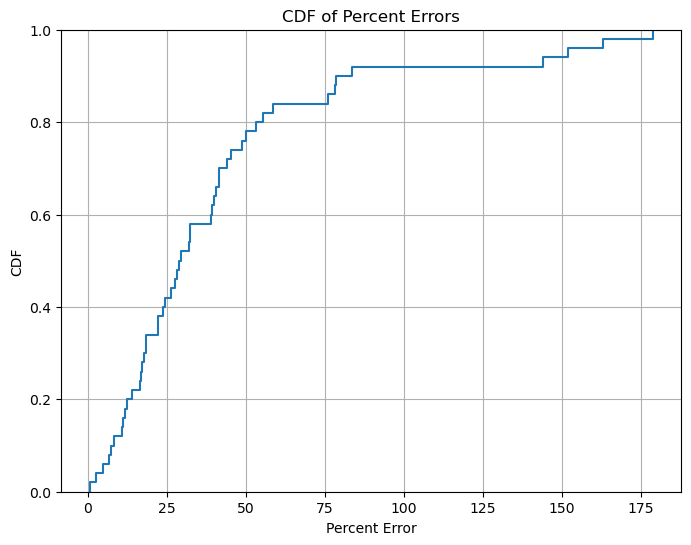

Mean Percent Error: 41.49%
Standard Deviation of Percent Errors: 40.29%
Median Percent Error: 29.04%
-----------------------------------------------------------------------------------------------------------
MODEL TRAINING: Building an SVR Model using All Applicable Mordred Descriptors
-----------------------------------------------------------------------------------------------------------
Checking for constant and inapplicable descriptors... 

Number of inapplicable descriptors removed: 177

Number of constant descriptors removed: 316

Number of inapplicable descriptors removed: 177

Number of constant descriptors removed: 316

Number of inapplicable descriptors removed: 171

Number of constant descriptors removed: 316

Removing outliers based on threshold...
Number of descriptors dropped due to outlier function: 0

Number of descriptors dropped due to outlier function: 0

Scaling descriptor matrices...
Building an SVR model using all applicable Mordred descriptors... 

Performing 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]The number of features selected:  50
Selection process completed. 

Modifying descriptor matrices to use only selected descripto

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


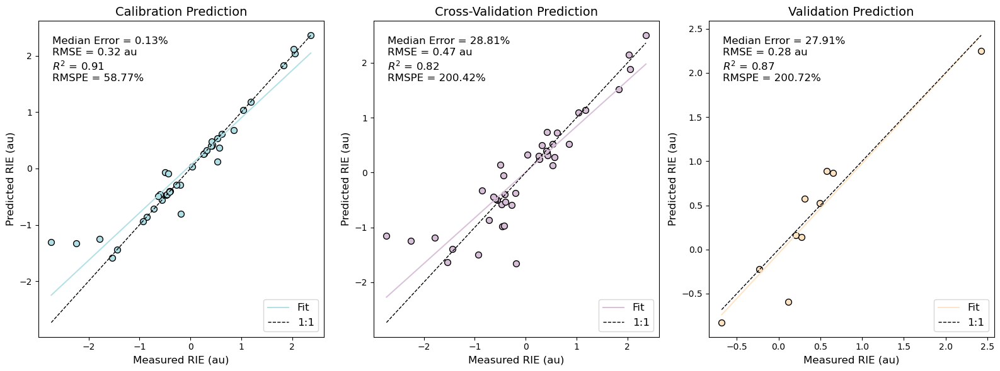

-----------------------------------------------------------------------------------------------------------
                                    RIE Predictor RFE Variable Selection
-----------------------------------------------------------------------------------------------------------


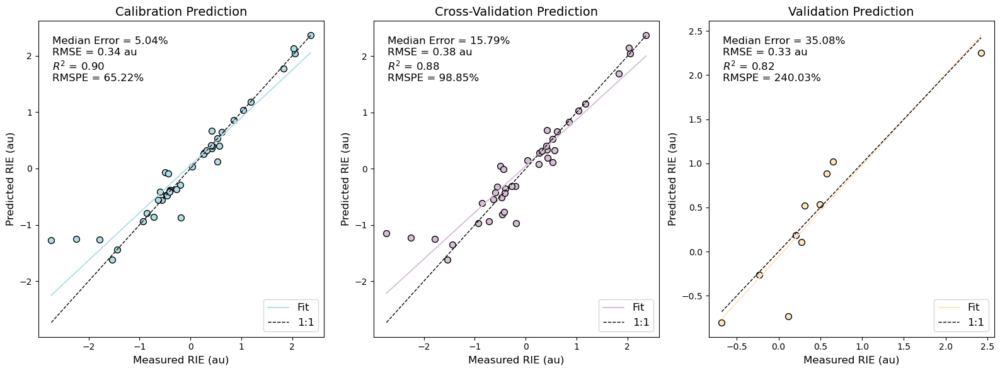

Untransforming predictions...
Untransforming predictions...


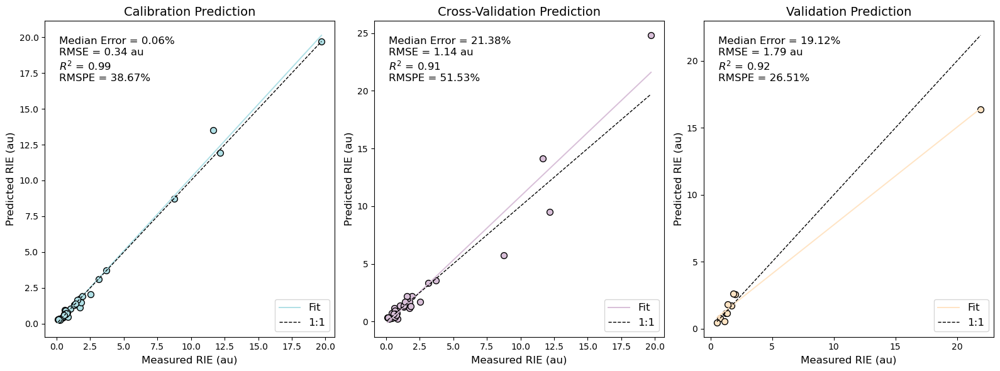

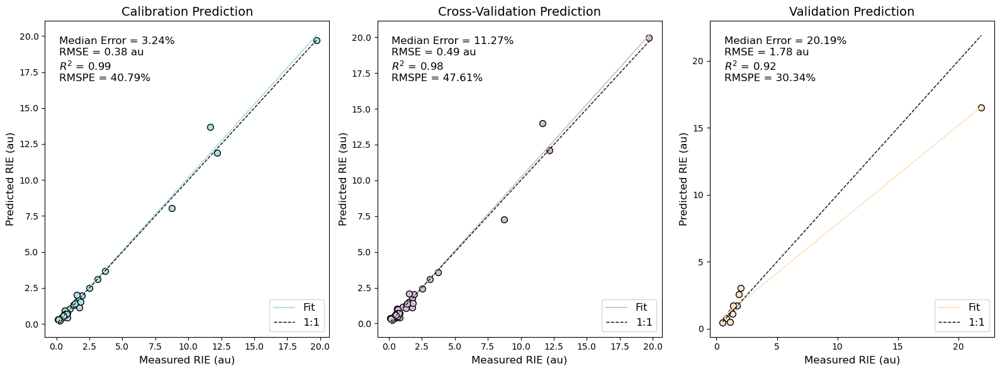

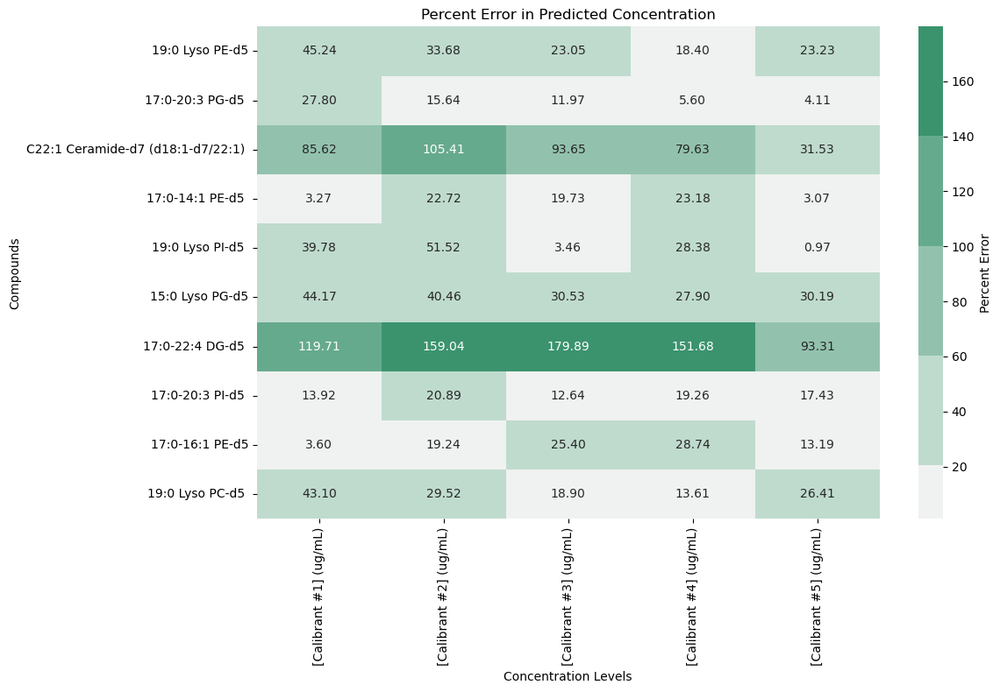

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



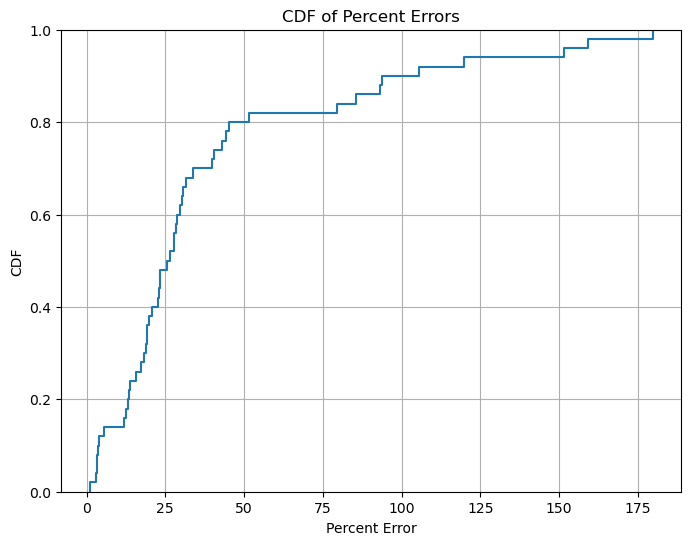

Mean Percent Error: 39.67%
Standard Deviation of Percent Errors: 41.37%
Median Percent Error: 25.91%


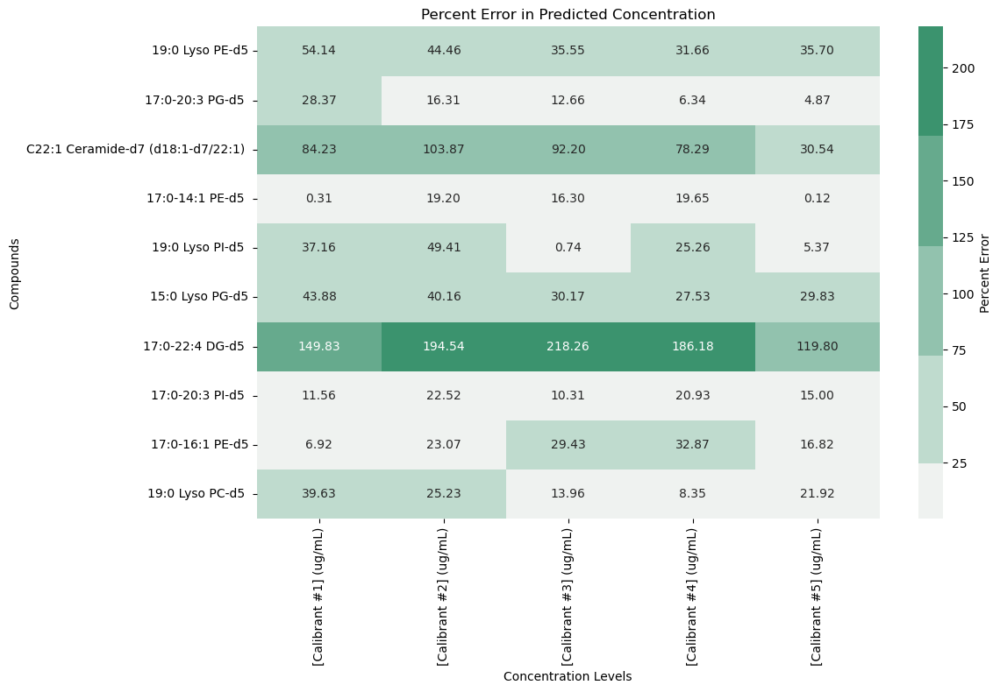

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



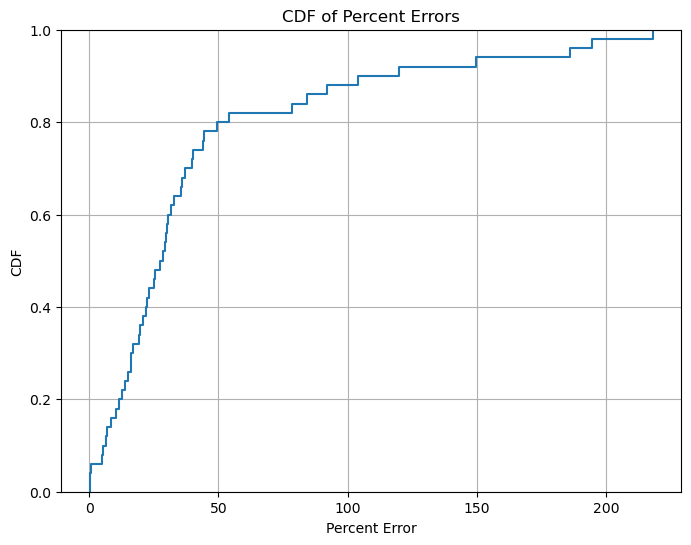

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



Mean Percent Error: 43.43%
Standard Deviation of Percent Errors: 49.92%
Median Percent Error: 27.95%
      Dataset  Mean Error (%)  Standard Deviation (%)  Median Error (%)
0  Normal All       42.374936               41.611675         30.458810
1  Normal RFE       41.493126               40.700407         29.036043
2  BoxCox All       39.668180               41.786724         25.905693
3  BoxCox RFE       43.428067               50.429766         27.950452


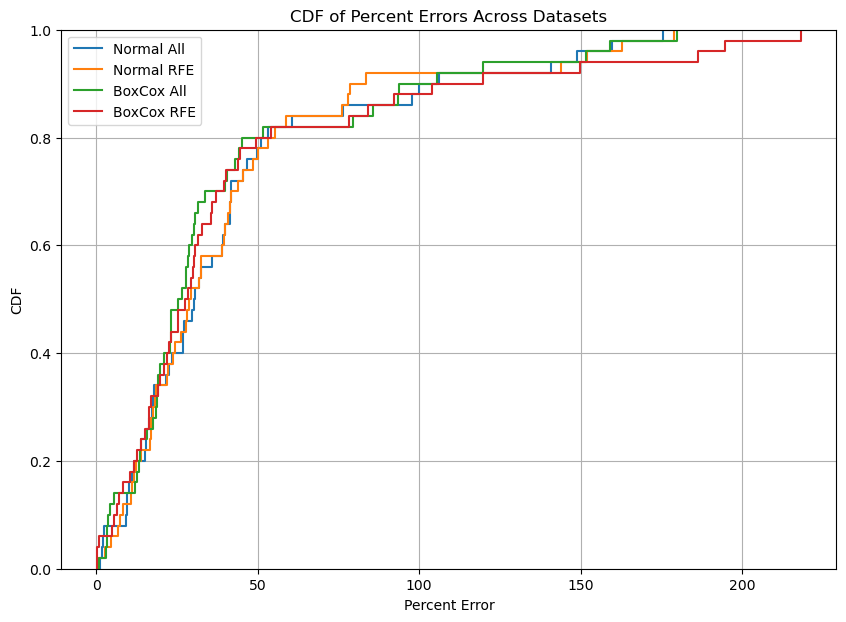

In [32]:
#Median of medians
Train_Book = experiment_results[80][878]['Train_Book']
Test_Book = experiment_results[80][878]['Test _Book']

#display(list(Train_Book['Input']))

X_train_raw = calculate_descriptors(list(Train_Book['Input']), input_type="SMILES")
X_test_raw = calculate_descriptors(list(Test_Book['Input']), input_type="SMILES")
X_target_raw = calculate_descriptors(list(Target_Book['Input']), input_type="SMILES")
verbose=True



# Step 2: Plot individual relative response vs. concentration
if verbose: print("____________________________________________________TRAIN DATA____________________________________________________")
slopes_train, intercepts_train, r2_values_train, results_df_train = plot_individual_relative_response_vs_concentration(
    Train_Book, TrainTest_Internal_Standard_Row, plot_graphs=verbose, display_table=verbose, verbose=verbose)

if verbose: print("____________________________________________________TEST DATA____________________________________________________")
slopes_test, intercepts_test, r2_values_test, results_df_test = plot_individual_relative_response_vs_concentration(
    Test_Book, TrainTest_Internal_Standard_Row, plot_graphs=verbose, display_table=verbose, verbose=verbose)


# Step 3: Filter datasets by results
threshold = 0.8  # Or any threshold value you want
results_dfs_names = [(results_df_train, 'results_df_train'), (results_df_test, 'results_df_test')]
input_books_names = [(Train_Book, 'Train_Book'), (Test_Book, 'Test_Book')]
descriptor_books_names = [(X_train_raw, 'X_train'), (X_test_raw, 'X_test')]




filtered_books_tuples, filtered_results_tuples, filtered_descriptors_tuples = filter_datasets_by_results(
    threshold, results_dfs_names, input_books_names, descriptor_books_names, verbose=verbose)

# Unpack the tuples to extract the DataFrames and their names, if needed
(filtered_train_book, _), (filtered_test_book, _) = filtered_books_tuples
(filtered_train_results, _), (filtered_test_results, _) = filtered_results_tuples
(filtered_X_train, _), (filtered_X_test, _) = filtered_descriptors_tuples

# Step 4: Box-Cox transform and plot
transformed_train, transformed_test, lambda_value = box_cox_transform_and_plot(
    filtered_train_results['Slope'].values, filtered_test_results['Slope'].values, plot_graphs=verbose, verbose=verbose)

# Step 5: Initial RIE prediction
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL TRAINING: Building an SVR Model using All Applicable Mordred Descriptors")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
X_train_clean, X_test_clean, X_target_clean, X_train_scaled, model, grid_results, y_train_predicted, y_train_cross_validation, y_test_predicted, y_target_predicted = initial_rie_prediction(
    filtered_X_train, list(filtered_train_results['Slope'].values), filtered_X_test, list(filtered_test_results['Slope'].values), X_target_raw, remove_outlier=True, threshold=3, verbose=verbose)

# Step 6: Model simplification with RFE
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL SIMPLIFICATION: Building an SVR Model using Recursive Feature Elimination")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
rfecv = rfe_variable_selection(X_train_scaled, list(filtered_train_results['Slope'].values), grid_results, verbose=verbose)

model_rfe, grid_result_rfe, X_test_rfe, y_train_predicted_rfe, y_train_cross_validation_rfe, y_test_predicted_rfe, y_target_predicted_rfe = rfe_rie_prediction(
    X_train_clean, list(filtered_train_results['Slope'].values), X_test_clean, list(filtered_test_results['Slope'].values), X_target_clean, rfecv, verbose=verbose)

#### Sometimes the predictions are negative when the model is poor; we'll make them zero instead. ####

# Convert lists to numpy arrays for efficient computation
y_train_predicted = np.maximum(0, np.array(y_train_predicted))
y_train_cross_validation = np.maximum(0, np.array(y_train_cross_validation))
y_test_predicted = np.maximum(0, np.array(y_test_predicted))
y_target_predicted = np.maximum(0, np.array(y_target_predicted))

y_train_predicted_rfe = np.maximum(0, np.array(y_train_predicted_rfe))
y_train_cross_validation_rfe = np.maximum(0, np.array(y_train_cross_validation_rfe))
y_test_predicted_rfe = np.maximum(0, np.array(y_test_predicted_rfe))
y_target_predicted_rfe = np.maximum(0, np.array(y_target_predicted_rfe))

# Log the sizes to identify mismatches
if verbose:
    print(f"Lengths:\nTrain True: {len(filtered_train_results['Slope'].values)}, Train Predicted: {len(y_train_predicted)}")
    print(f"Train CV: {len(y_train_cross_validation)}")
    print(f"Test True: {len(filtered_test_results['Slope'].values)}, Test Predicted: {len(y_test_predicted)}")

# Step 7: Model validation
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL VALIDATION")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("                                       RIE Predictor All Descriptors")
if verbose: print("-----------------------------------------------------------------------------------------------------------")

if verbose:

    summary_plot_all = summary_plot(list(filtered_train_results['Slope'].values), list(filtered_test_results['Slope'].values), 
                                    y_train_predicted, y_train_cross_validation, y_test_predicted, 
                                    labelsize=12, legendsize=12, titlesize=14, textsize=12)

if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("                                    RIE Predictor RFE Variable Selection")
if verbose: print("-----------------------------------------------------------------------------------------------------------")

if verbose:

    summary_plot_rfe = summary_plot(list(filtered_train_results['Slope'].values), list(filtered_test_results['Slope'].values), 
                                    y_train_predicted_rfe, y_train_cross_validation_rfe, y_test_predicted_rfe, 
                                    labelsize=12, legendsize=12, titlesize=14, textsize=12)

# Step 8: Percent error calculation
percent_errors_matrix_normal_all = calculate_and_plot_percent_error(
    df=filtered_test_book,
    internal_standard_row=TrainTest_Internal_Standard_Row,
    slopes=list(y_test_predicted),
    plot=verbose,
    verbose=verbose
)
percent_errors_matrix_normal_rfe = calculate_and_plot_percent_error(
    df=filtered_test_book,
    internal_standard_row=TrainTest_Internal_Standard_Row,
    slopes=list(y_test_predicted_rfe),
    plot=verbose,
    verbose=verbose
)

# Step 9: Initial RIE prediction with Box-Cox transformation
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL TRAINING: Building an SVR Model using All Applicable Mordred Descriptors")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
X_train_clean_transformed, X_test_clean_transformed, X_target_clean_transformed, X_train_scaled_transformed, model_transformed, grid_results_transformed, y_train_predicted_transformed, y_train_cross_validation_transformed, y_test_predicted_transformed, y_target_predicted_transformed = initial_rie_prediction(
    filtered_X_train, list(transformed_train), filtered_X_test, list(transformed_test), X_target_raw, remove_outlier=True, threshold=10, verbose=verbose)

# Step 10: Model simplification with RFE (Box-Cox transformed)
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL SIMPLIFICATION: Building an SVR Model using Recursive Feature Elimination")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
rfecv_transformed = rfe_variable_selection(X_train_scaled_transformed, list(transformed_train), grid_results_transformed, verbose=verbose)

model_rfe_transformed, grid_result_rfe_transformed, X_test_rfe_transformed, y_train_predicted_rfe_transformed, y_train_cross_validation_rfe_transformed, y_test_predicted_rfe_transformed, y_target_predicted_rfe_transformed = rfe_rie_prediction(
    X_train_clean_transformed, list(transformed_train), X_test_clean_transformed, list(transformed_test), X_target_clean_transformed, rfecv_transformed, verbose=verbose)

# Step 11: Model validation (Box-Cox transformed)
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL VALIDATION")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("                                       RIE Predictor All Descriptors")
if verbose: print("-----------------------------------------------------------------------------------------------------------")

if verbose:
    summary_plot_all_transformed = summary_plot(list(transformed_train), list(transformed_test), 
                                                y_train_predicted_transformed, y_train_cross_validation_transformed, 
                                                y_test_predicted_transformed, labelsize=12, legendsize=12, 
                                                titlesize=14, textsize=12)

if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("                                    RIE Predictor RFE Variable Selection")
if verbose: print("-----------------------------------------------------------------------------------------------------------")

if verbose:
    summary_plot_rfe_transformed = summary_plot(list(transformed_train), list(transformed_test), 
                                                y_train_predicted_rfe_transformed, y_train_cross_validation_rfe_transformed, 
                                                y_test_predicted_rfe_transformed, labelsize=12, legendsize=12, 
                                                titlesize=14, textsize=12)

# Step 12: Untransform predictions from Box-Cox transformation
y_train_untransformed = box_cox_untransform(list(transformed_train), lambda_value)
y_test_untransformed = box_cox_untransform(list(transformed_test), lambda_value)

y_train_predicted_untransformed, y_train_cross_validation_untransformed, y_test_predicted_untransformed, y_target_predicted_untransformed = untransform_predictions(
    y_train_predicted_transformed, y_train_cross_validation_transformed, y_test_predicted_transformed, y_target_predicted_transformed, lambda_value, verbose=verbose)

y_train_predicted_rfe_untransformed, y_train_cross_validation_rfe_untransformed, y_test_predicted_rfe_untransformed, y_target_predicted_rfe_untransformed = untransform_predictions(
    y_train_predicted_rfe_transformed, y_train_cross_validation_rfe_transformed, y_test_predicted_rfe_transformed, y_target_predicted_rfe_transformed, lambda_value, verbose=verbose)

if verbose:

    summary_plot_all_untransformed = summary_plot(y_train_untransformed, y_test_untransformed, 
                                                  y_train_predicted_untransformed, y_train_cross_validation_untransformed, 
                                                  y_test_predicted_untransformed, labelsize=12, legendsize=12, 
                                                  titlesize=14, textsize=12)

    summary_plot_rfe_untransformed = summary_plot(y_train_untransformed, y_test_untransformed, 
                                                  y_train_predicted_rfe_untransformed, y_train_cross_validation_rfe_untransformed, 
                                                  y_test_predicted_rfe_untransformed, labelsize=12, legendsize=12, 
                                                  titlesize=14, textsize=12)



# Step 13: Calculate percent error for Box-Cox transformed predictions
percent_errors_matrix_boxcox_all = calculate_and_plot_percent_error(
    df=filtered_test_book,
    internal_standard_row=TrainTest_Internal_Standard_Row,
    slopes=list(y_test_predicted_untransformed),
    plot=verbose,
    verbose=verbose
)
percent_errors_matrix_boxcox_rfe = calculate_and_plot_percent_error(
    df=filtered_test_book,
    internal_standard_row=TrainTest_Internal_Standard_Row,
    slopes=list(y_test_predicted_rfe_untransformed),
    plot=verbose,
    verbose=verbose
)

# Step 14: Summarize results
data = {
    "Dataset": ["Normal All", "Normal RFE", "BoxCox All", "BoxCox RFE"],
    "Mean Error (%)": [],
    "Standard Deviation (%)": [],
    "Median Error (%)": []
}

for matrix in [percent_errors_matrix_normal_all, percent_errors_matrix_normal_rfe, percent_errors_matrix_boxcox_all, percent_errors_matrix_boxcox_rfe]:
    mean_error, std_error, median_error = calculate_summary_statistics(matrix)
    data["Mean Error (%)"].append(mean_error)
    data["Standard Deviation (%)"].append(std_error)
    data["Median Error (%)"].append(median_error)

summary_df = pd.DataFrame(data)

if verbose:
    print(summary_df)

if verbose:
    # Uncomment to generate CDF plot
    plt.figure(figsize=(10, 7))
    for matrix, label in zip([percent_errors_matrix_normal_all, percent_errors_matrix_normal_rfe, percent_errors_matrix_boxcox_all, percent_errors_matrix_boxcox_rfe], ["Normal All", "Normal RFE", "BoxCox All", "BoxCox RFE"]):
        flattened_errors = matrix.flatten()
        flattened_errors = flattened_errors[~np.isnan(flattened_errors)]  # Remove NaN values
        sns.ecdfplot(flattened_errors, label=label)
    plt.xlabel('Percent Error')
    plt.ylabel('CDF')
    plt.title('CDF of Percent Errors Across Datasets')
    plt.legend()
    plt.grid(True)
    plt.show()



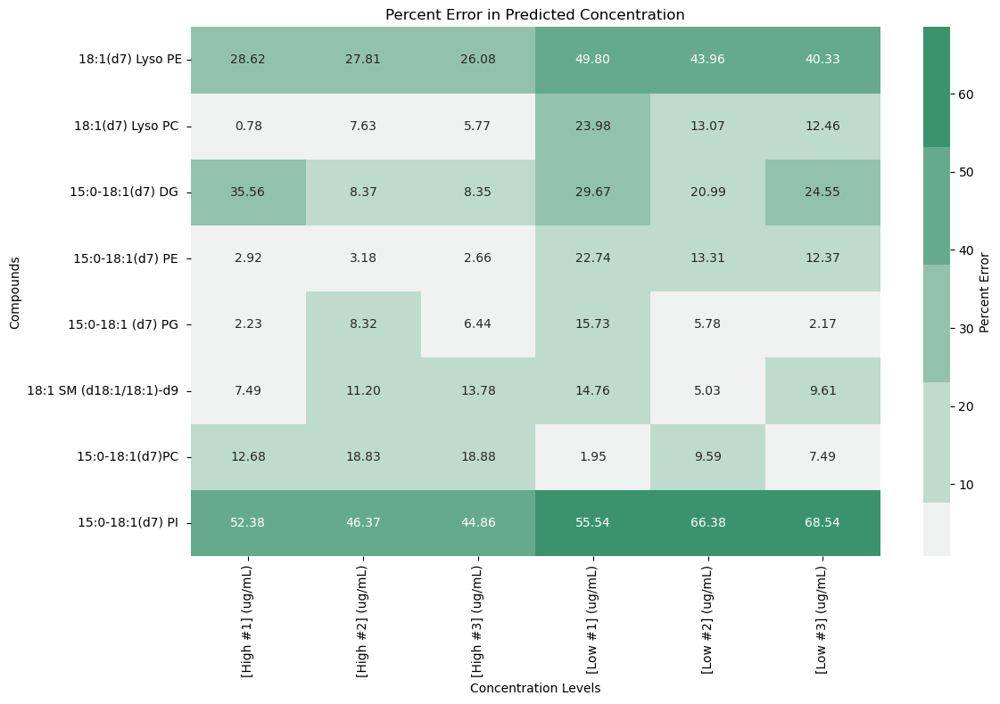

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



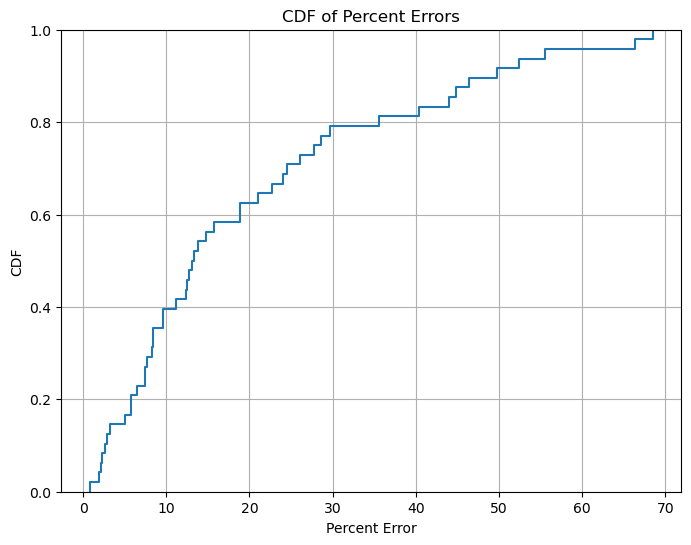

Mean Percent Error: 20.23%
Standard Deviation of Percent Errors: 17.73%
Median Percent Error: 13.19%


In [33]:
percent_errors_matrix_boxcox_rfe = calculate_and_plot_percent_error(
    df=Target_Book,
    internal_standard_row=Target_Internal_Standard_Row,
    slopes=list(y_target_predicted_rfe_untransformed),
    plot=verbose,
    verbose=verbose)


In [34]:
import pandas as pd

# Assuming y_train_untransformed, y_train_predicted_rfe_untransformed, etc. are pandas Series
# Assuming Train_Book and Test_Book are pandas DataFrames

# Create DataFrame for the first sheet
df1 = pd.DataFrame({
    'Name': filtered_train_book['Name'],
    'y_train': y_train_untransformed,
    'y_train_predicted_rfe_untransformed': y_train_predicted_rfe_untransformed,
    'y_train_cross_validation_rfe_untransformed': y_train_cross_validation_rfe_untransformed
})

# Create DataFrame for the second sheet
df2 = pd.DataFrame({
    'Name': filtered_test_book['Name'],
    'y_test': y_test_untransformed,
    'y_test_predicted_rfe_untransformed': y_test_predicted_rfe_untransformed
})

# Create DataFrame for the third sheet
df3 = pd.DataFrame({
    'Name': Target_Book['Name'],
    'y_target_predicted_rfe_untransformed': y_target_predicted_rfe_untransformed
})

display(df1, df2, df3)

,Name,y_train,y_train_predicted_rfe_untransformed,y_train_cross_validation_rfe_untransformed
0,17:0-18:1 PI-d5,0.446564,0.476056,0.557556
1,C16:1 Ceramide-d7 (d18:1-d7/16:1),8.734722,8.049530,7.251554
2,17:0-16:1 PG-d5,1.542945,1.448896,1.421085
3,17:0 Lyso PS-d5,0.274779,0.274725,0.296037
4,17:0-16:1 DG-d5,0.209262,0.316581,0.321309
5,17:0-14:1 PC-d5,0.637272,0.637432,0.612015
6,17:0 Lyso PC-d5,1.554247,1.505468,1.216577
7,17:0 Lyso PE-d5,2.512194,2.513451,2.431724
8,20:1 SM (d18:1/20:1)-d9,0.623151,0.932465,1.048749
9,17:0-14:1 PG-d5,1.522974,1.523292,1.528111


,Name,y_test,y_test_predicted_rfe_untransformed
0,19:0 Lyso PE-d5,1.989986,3.048825
1,17:0-20:3 PG-d5,1.671910,1.747159
2,C22:1 Ceramide-d7 (d18:1-d7/22:1),21.910285,16.497121
3,17:0-14:1 PE-d5,1.230777,1.209096
4,19:0 Lyso PI-d5,0.798327,0.771308
5,15:0 Lyso PG-d5,1.838312,2.592215
6,17:0-22:4 DG-d5,1.120712,0.500359
7,17:0-20:3 PI-d5,0.524071,0.469915
8,17:0-16:1 PE-d5,1.320592,1.113676
9,19:0 Lyso PC-d5,1.376121,1.721127


,Name,y_target_predicted_rfe_untransformed
0,18:1(d7) Lyso PE,2.504240
1,18:1(d7) Lyso PC,1.494149
2,15:0-18:1(d7) DG,0.363575
3,15:0-18:1(d7) PE,1.310168
4,15:0-18:1 (d7) PG,1.715246
5,18:1 SM (d18:1/18:1)-d9,0.909395
6,15:0-18:1(d7)PC,0.673296
7,15:0-18:1(d7) PI,0.730017


In [35]:
import pandas as pd
from datetime import datetime
import openpyxl  # Make sure this is installed

# Generate a timestamp in the format YYYYMMDD-HHMMSS
timestamp = datetime.now().strftime("%Y%m%d-%H%M%S")

# Define the path with the timestamp included before the file extension
path = f'C:/Users/mrain/OneDrive/Documents/SQRAPIE_OKR_MAR/negative_train80_test20_iteration878_D1USM_D1SM_{timestamp}.xlsx'

# Create a Pandas Excel writer using openpyxl as the engine
with pd.ExcelWriter(path, engine='openpyxl') as writer:
    # Write DataFrames to Excel without the index
    df1.to_excel(writer, sheet_name='Train Data', index=False)
    df2.to_excel(writer, sheet_name='Test Data', index=False)
    df3.to_excel(writer, sheet_name='Target Data', index=False)

# The workbook is automatically saved after exiting the 'with' block.

# Open the workbook and adjust column widths
wb = openpyxl.load_workbook(path)
for sheet_name in wb.sheetnames:
    sheet = wb[sheet_name]
    for col in sheet.columns:
        max_length = 0
        column = col[0].column_letter  # Get the column name
        for cell in col:
            try:  # Necessary to avoid error on empty cells
                if len(str(cell.value)) > max_length:
                    max_length = len(str(cell.value))
            except:
                pass
        adjusted_width = (max_length + 2)  # Adding a little extra space
        sheet.column_dimensions[column].width = adjusted_width

# Save the changes to the workbook
wb.save(path)
print("Last saved at: ", timestamp)

Last saved at:  20240705-141031


# Section 11: Measuring Model Accuracy for Novel Analytes between Donors (D1 USM $\rightarrow$ D2 SM)

Here, we are testing the impact of using a model built with standards in Donor 1 on unknowns in Donor 2.

In [36]:
# Specify the paths to your Excel files here
traintest_file_path = 'C:/Users/mrain/OneDrive/Documents/SQRAPIE_OKR_MAR/Negative_15_B1_D1_Neg_F_Input_Blank_no6.xlsx'
target_file_path = 'C:/Users/mrain/Downloads/D2_Neg_ExternalVal_Input_Blank.xlsx'

# Read the Excel files into pandas DataFrames
TrainTest_Book = pd.read_excel(traintest_file_path)
Target_Book_Initial = pd.read_excel(target_file_path)

# Assuming calculate_descriptors function accepts pandas DataFrames and operates on them
X_traintest_complete = calculate_descriptors(TrainTest_Book['Input'][1:], input_type="SMILES")
X_target_complete = calculate_descriptors(Target_Book_Initial['Input'][1:], input_type="SMILES")

Converted 50 identifiers to molecules.


 54%|█████▍    | 27/50 [00:01<00:00, 26.32it/s]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

 80%|████████  | 40/50 [00:02<00:00, 29.48it/s]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

100%|██████████| 50/50 [00:02<00:00, 22.17it/s]


Converted 8 identifiers to molecules.


100%|██████████| 8/8 [00:01<00:00,  7.73it/s]


C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

In [37]:
# Step 1: Select and split input files
Train_Book, Test_Book, Target_Book, X_train_raw, X_test_raw, X_target_raw, TrainTest_Internal_Standard_Row, Target_Internal_Standard_Row = select_input_files_playground(
    TrainTest_Book, Target_Book_Initial, X_traintest_complete, X_target_complete, split_percentage=80, verbose=True)

Extracting internal standard rows...
Shuffling and splitting the TrainTest_Book and X_traintest DataFrames together...
Data splitting complete.


Converted 40 identifiers to molecules.


 22%|██▎       | 9/40 [00:01<00:55,  1.78s/it]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

 72%|███████▎  | 29/40 [00:02<00:00, 22.96it/s]

C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

100%|██████████| 40/40 [00:02<00:00, 18.41it/s]


C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
Converted 10 identifiers to molecules.


100%|██████████| 10/10 [00:01<00:00,  8.29it/s]


C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

100%|██████████| 8/8 [00:01<00:00,  5.90it/s]


C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encount

<timed exec>:122: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Displaying results table...


,Compound,Slope,Intercept,R² Value
0,17:0-18:1 PI-d5,0.446564,-0.648961,0.980794
1,C16:1 Ceramide-d7 (d18:1-d7/16:1),8.734722,170.618804,0.959219
2,17:0-16:1 PG-d5,1.542945,0.860446,0.999584
3,17:0 Lyso PS-d5,0.274779,-2.457426,0.940282
4,17:0-16:1 DG-d5,0.209262,0.423069,0.997645
5,17:0-14:1 PC-d5,0.637272,4.182932,0.970622
6,17:0 Lyso PC-d5,1.554247,5.521030,0.987048
7,17:0 Lyso PE-d5,2.512194,-2.591429,0.998936
8,20:1 SM (d18:1/20:1)-d9,0.623151,2.043452,0.970209
9,17:0-14:1 PG-d5,1.522974,1.048163,0.996913


____________________________________________________TEST DATA____________________________________________________
Initializing data structures and checking input data...


<timed exec>:122: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



Displaying results table...


,Compound,Slope,Intercept,R² Value
0,19:0 Lyso PE-d5,1.989986,-0.429053,0.998663
1,17:0-20:3 PG-d5,1.671910,-2.693272,0.999650
2,C22:1 Ceramide-d7 (d18:1-d7/22:1),21.910285,205.668483,0.965017
3,17:0-14:1 PE-d5,1.230777,2.239994,0.990607
4,19:0 Lyso PI-d5,0.798327,-1.989332,0.978811
5,15:0 Lyso PG-d5,1.838312,-0.406924,0.999501
6,17:0-22:4 DG-d5,1.120712,4.348142,0.973005
7,17:0-20:3 PI-d5,0.524071,-2.096480,0.974446
8,17:0-16:1 PE-d5,1.320592,2.707920,0.995130
9,19:0 Lyso PC-d5,1.376121,1.185560,0.992149


Shapiro-Wilk test for the initial slopes (Training set): ShapiroResult(statistic=0.5194166898727417, pvalue=2.896146378272846e-10)
Best-fitting lambda value for training set: -0.16298848081335496
Shapiro-Wilk test for Box-Cox transformed slopes (Training set): ShapiroResult(statistic=0.9716009497642517, pvalue=0.4038936495780945)


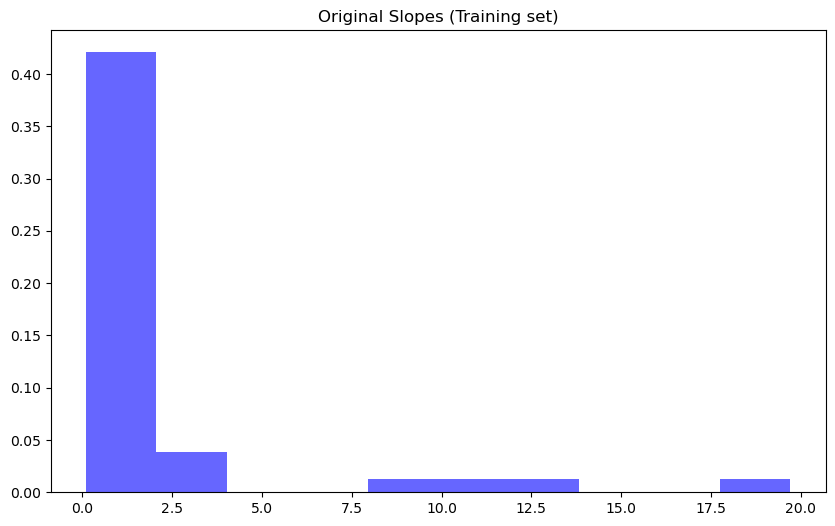

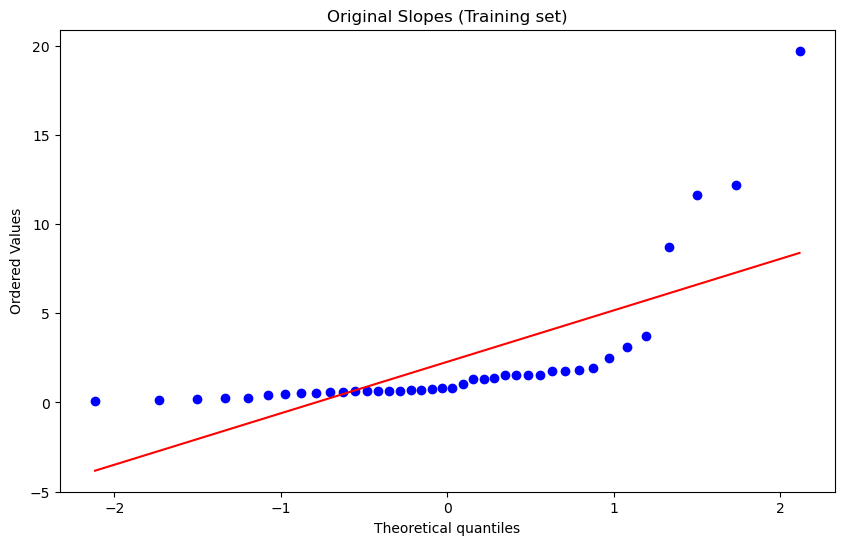

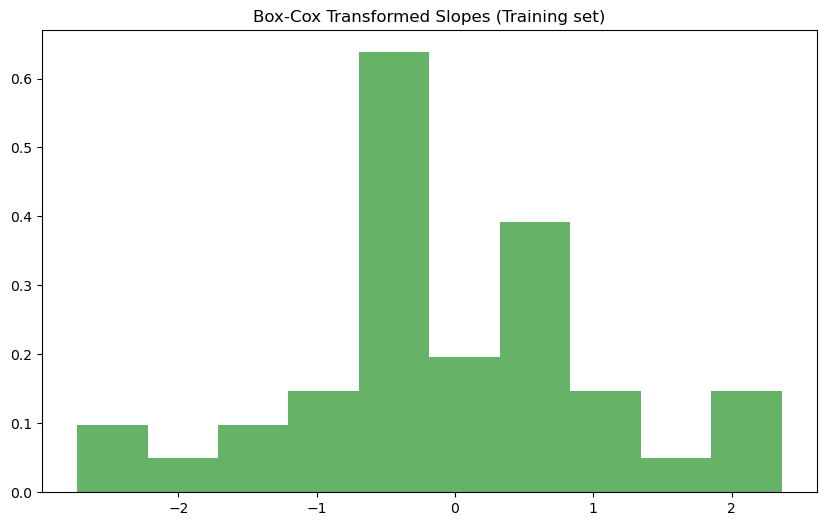

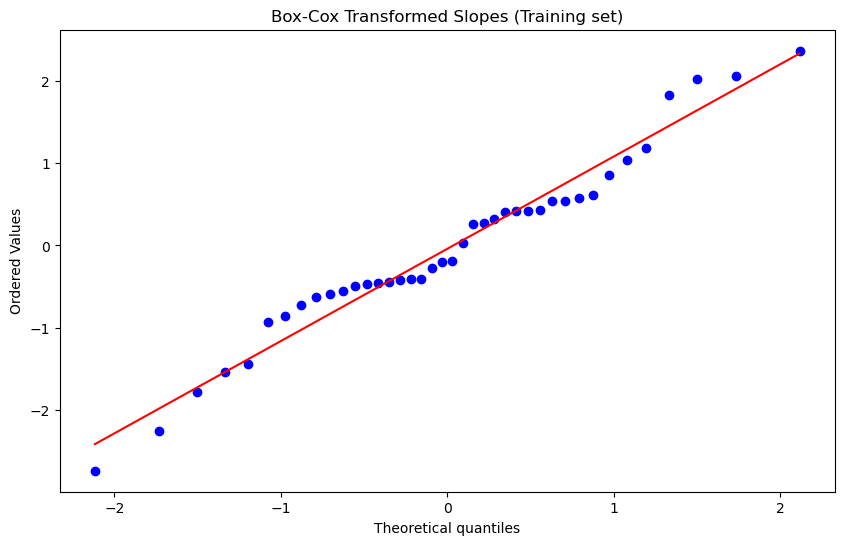

-----------------------------------------------------------------------------------------------------------
MODEL TRAINING: Building an SVR Model using All Applicable Mordred Descriptors
-----------------------------------------------------------------------------------------------------------
Checking for constant and inapplicable descriptors... 

Number of inapplicable descriptors removed: 177

Number of constant descriptors removed: 316

Number of inapplicable descriptors removed: 177

Number of constant descriptors removed: 316

Number of inapplicable descriptors removed: 171

Number of constant descriptors removed: 316

Removing outliers based on threshold...
Number of descriptors dropped due to outlier function: 0

Number of descriptors dropped due to outlier function: 13

Scaling descriptor matrices...
Building an SVR model using all applicable Mordred descriptors... 

Performing grid search hyperparameter optimization...
Fitting 10 folds for each of 18 candidates, totalling 180

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]The number of features selected:  277
Selection process completed. 

Modifying descriptor matrices to use only selected descriptors...
Applying feature selection mask...
Scaling descriptor matrices...
Descriptor matrices scaled. 

Building an SVR model with descriptors selected by RFE... 

Performing grid search hyperp

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


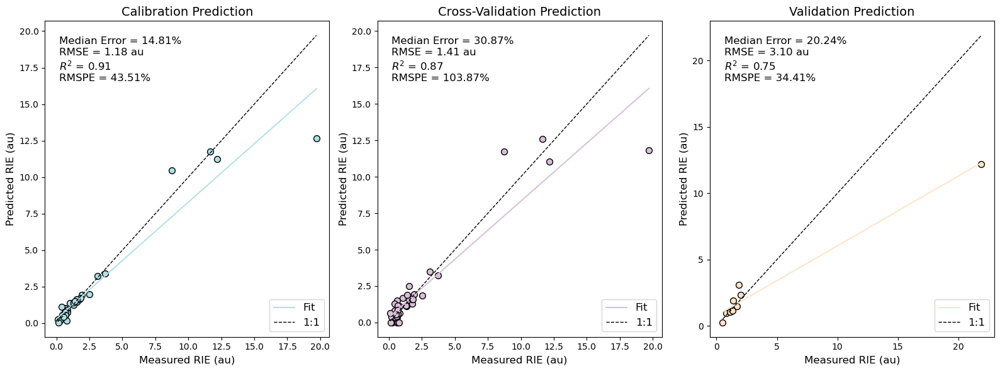

-----------------------------------------------------------------------------------------------------------
                                    RIE Predictor RFE Variable Selection
-----------------------------------------------------------------------------------------------------------


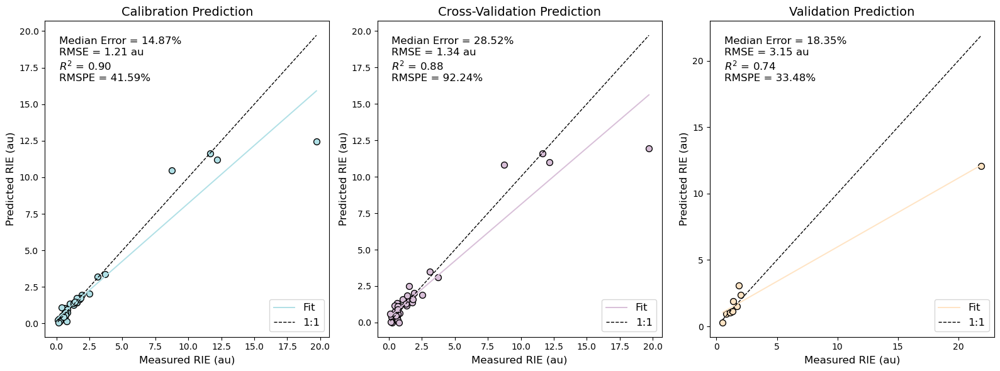

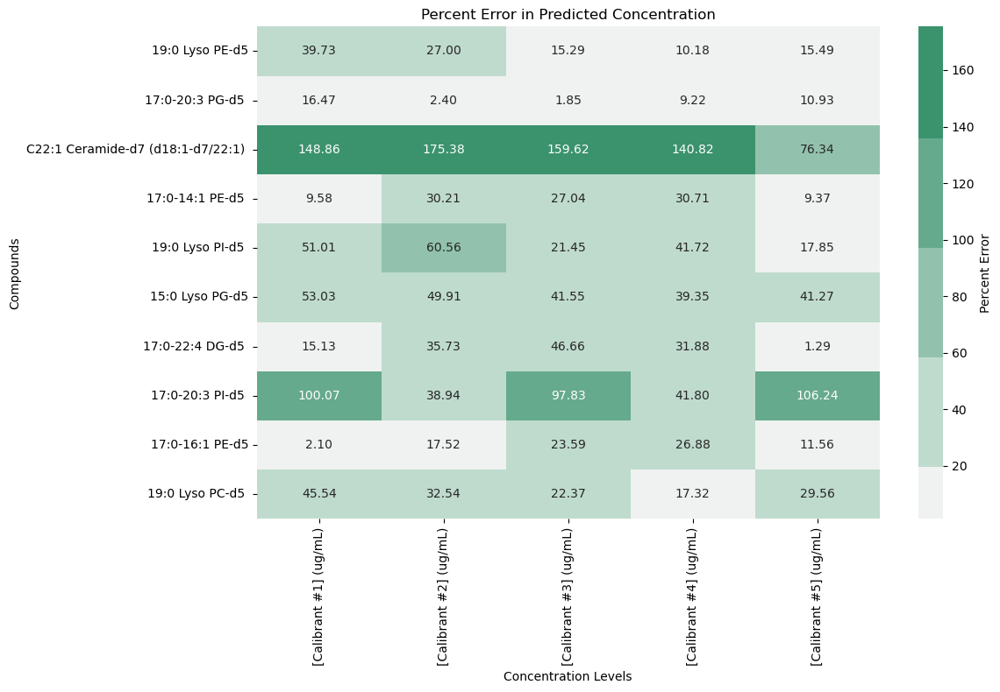

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



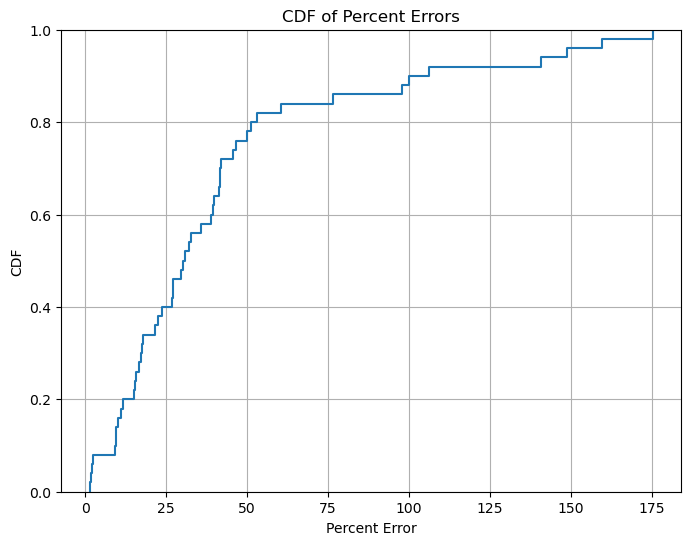

Mean Percent Error: 42.37%
Standard Deviation of Percent Errors: 41.19%
Median Percent Error: 30.46%


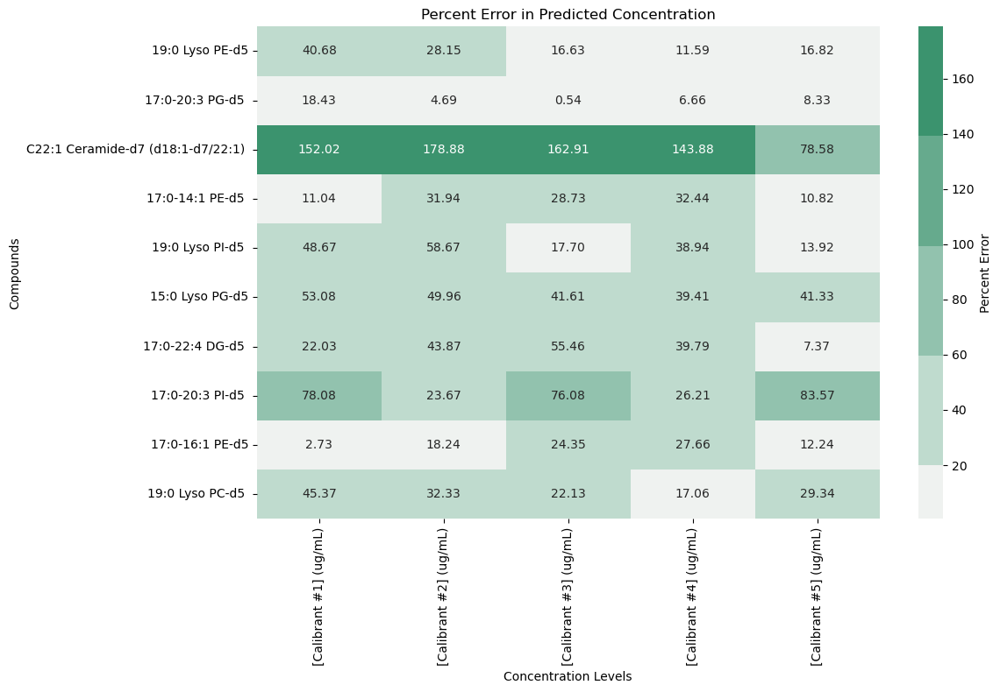

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



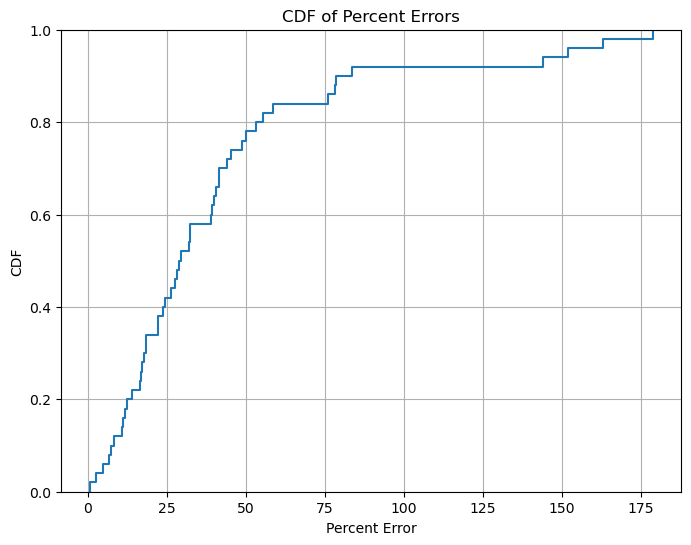

Mean Percent Error: 41.49%
Standard Deviation of Percent Errors: 40.29%
Median Percent Error: 29.04%
-----------------------------------------------------------------------------------------------------------
MODEL TRAINING: Building an SVR Model using All Applicable Mordred Descriptors
-----------------------------------------------------------------------------------------------------------
Checking for constant and inapplicable descriptors... 

Number of inapplicable descriptors removed: 177

Number of constant descriptors removed: 316

Number of inapplicable descriptors removed: 177

Number of constant descriptors removed: 316

Number of inapplicable descriptors removed: 171

Number of constant descriptors removed: 316

Removing outliers based on threshold...
Number of descriptors dropped due to outlier function: 0

Number of descriptors dropped due to outlier function: 0

Scaling descriptor matrices...
Building an SVR model using all applicable Mordred descriptors... 

Performing 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]The number of features selected:  50
Selection process completed. 

Modifying descriptor matrices to use only selected descripto

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


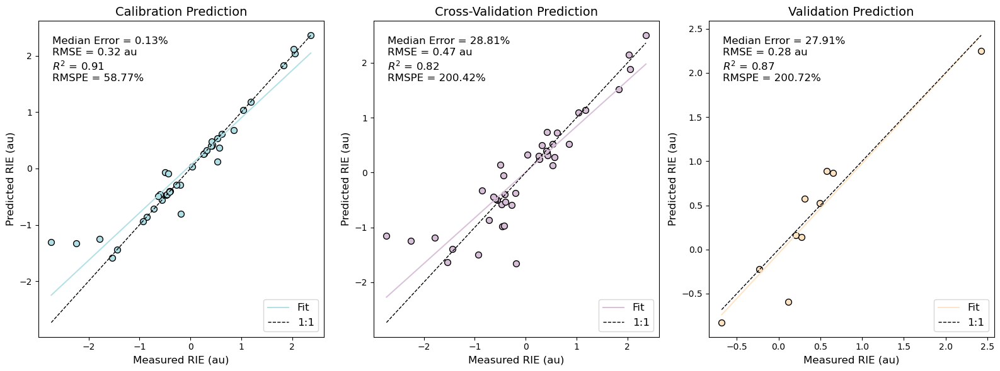

-----------------------------------------------------------------------------------------------------------
                                    RIE Predictor RFE Variable Selection
-----------------------------------------------------------------------------------------------------------


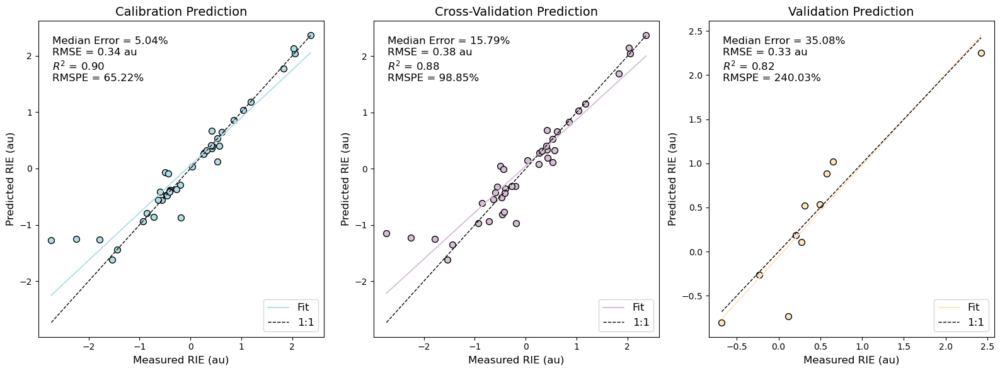

Untransforming predictions...
Untransforming predictions...


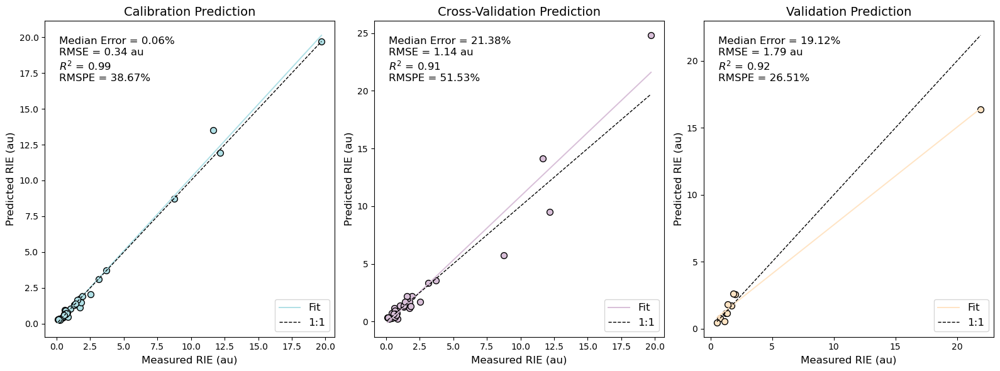

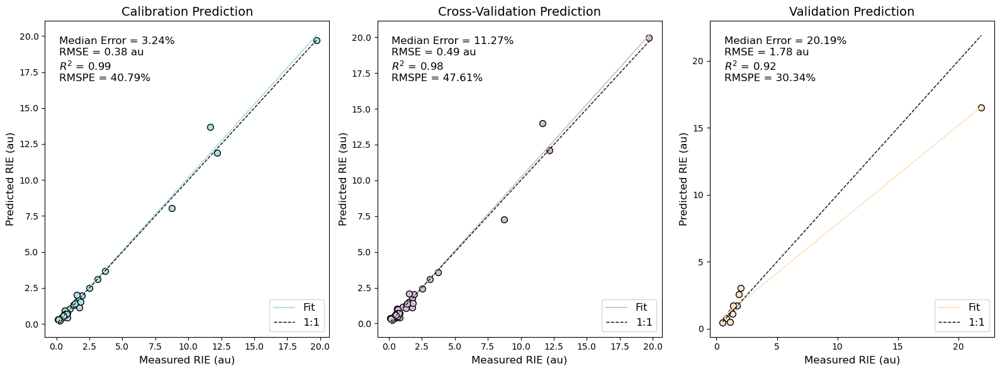

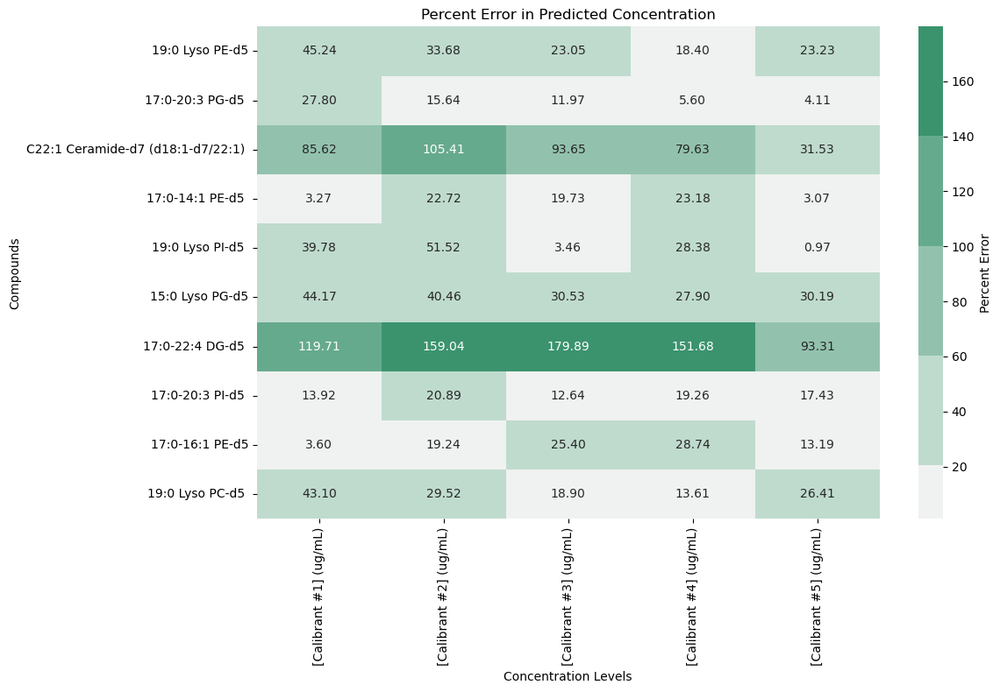

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



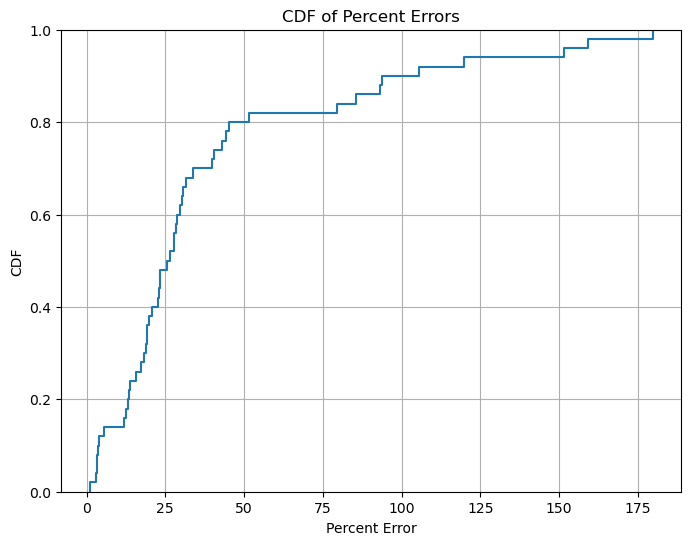

Mean Percent Error: 39.67%
Standard Deviation of Percent Errors: 41.37%
Median Percent Error: 25.91%


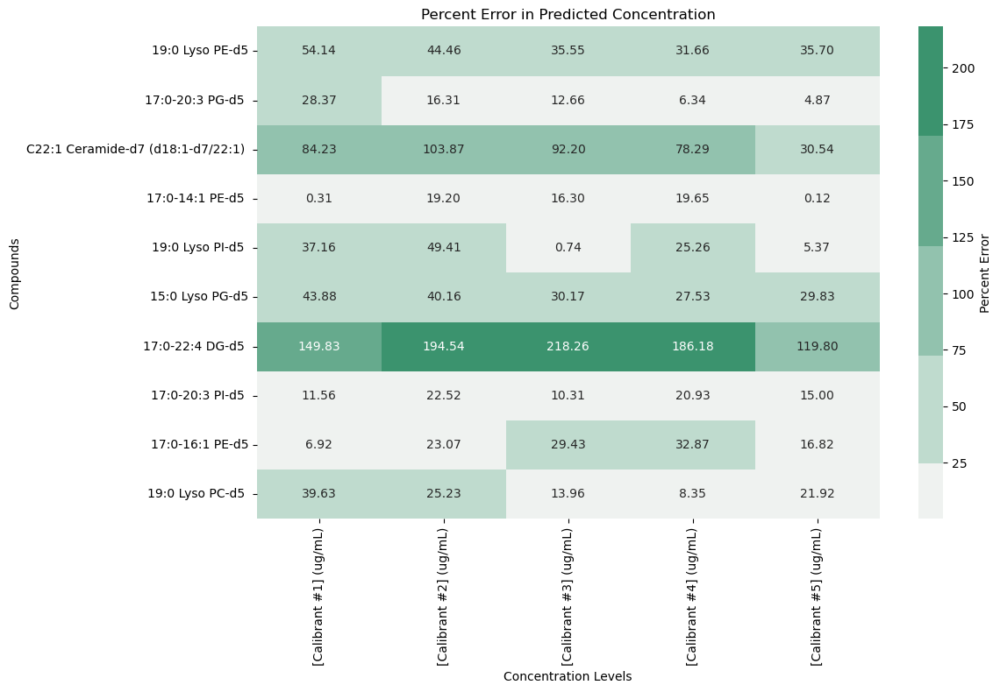

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



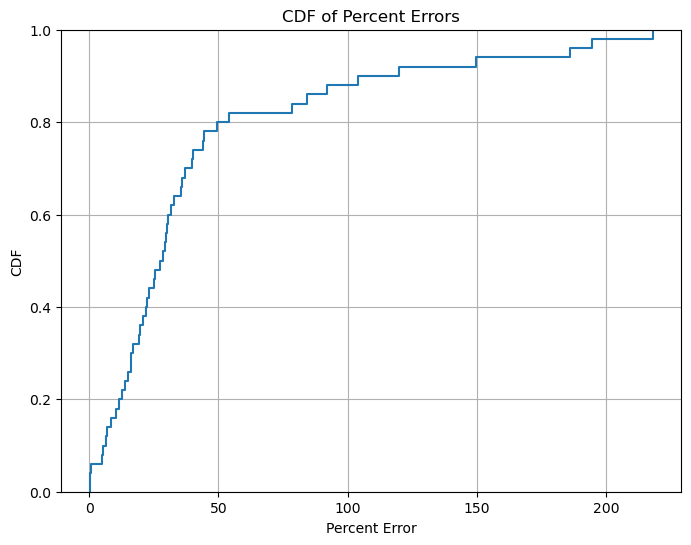

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



Mean Percent Error: 43.43%
Standard Deviation of Percent Errors: 49.92%
Median Percent Error: 27.95%
      Dataset  Mean Error (%)  Standard Deviation (%)  Median Error (%)
0  Normal All       42.374936               41.611675         30.458810
1  Normal RFE       41.493126               40.700407         29.036043
2  BoxCox All       39.668180               41.786724         25.905693
3  BoxCox RFE       43.428067               50.429766         27.950452


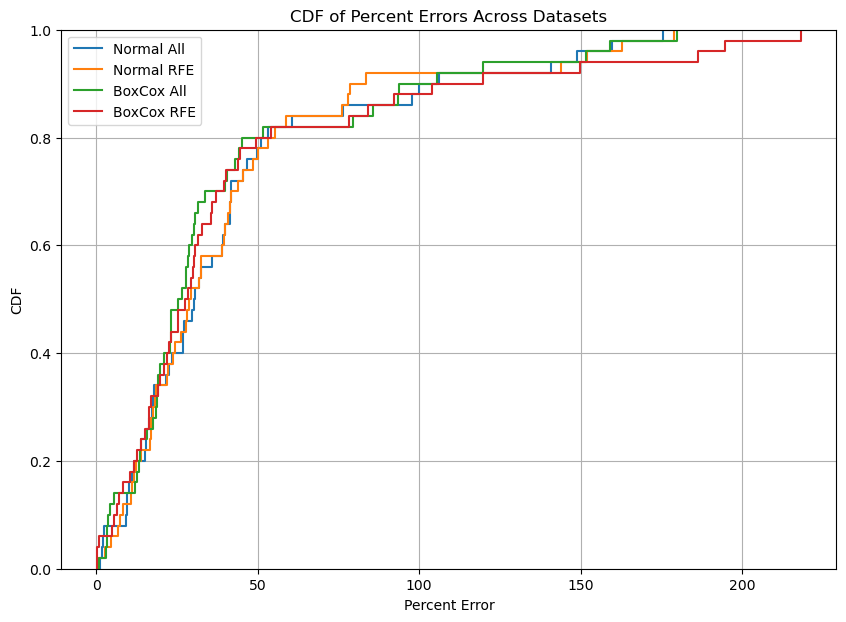

In [38]:
#Median of medians
Train_Book = experiment_results[80][878]['Train_Book']
Test_Book = experiment_results[80][878]['Test _Book']

#display(list(Train_Book['Input']))

X_train_raw = calculate_descriptors(list(Train_Book['Input']), input_type="SMILES")
X_test_raw = calculate_descriptors(list(Test_Book['Input']), input_type="SMILES")
X_target_raw = calculate_descriptors(list(Target_Book['Input']), input_type="SMILES")
verbose=True



# Step 2: Plot individual relative response vs. concentration
if verbose: print("____________________________________________________TRAIN DATA____________________________________________________")
slopes_train, intercepts_train, r2_values_train, results_df_train = plot_individual_relative_response_vs_concentration(
    Train_Book, TrainTest_Internal_Standard_Row, plot_graphs=verbose, display_table=verbose, verbose=verbose)

if verbose: print("____________________________________________________TEST DATA____________________________________________________")
slopes_test, intercepts_test, r2_values_test, results_df_test = plot_individual_relative_response_vs_concentration(
    Test_Book, TrainTest_Internal_Standard_Row, plot_graphs=verbose, display_table=verbose, verbose=verbose)


# Step 3: Filter datasets by results
threshold = 0.8  # Or any threshold value you want
results_dfs_names = [(results_df_train, 'results_df_train'), (results_df_test, 'results_df_test')]
input_books_names = [(Train_Book, 'Train_Book'), (Test_Book, 'Test_Book')]
descriptor_books_names = [(X_train_raw, 'X_train'), (X_test_raw, 'X_test')]




filtered_books_tuples, filtered_results_tuples, filtered_descriptors_tuples = filter_datasets_by_results(
    threshold, results_dfs_names, input_books_names, descriptor_books_names, verbose=verbose)

# Unpack the tuples to extract the DataFrames and their names, if needed
(filtered_train_book, _), (filtered_test_book, _) = filtered_books_tuples
(filtered_train_results, _), (filtered_test_results, _) = filtered_results_tuples
(filtered_X_train, _), (filtered_X_test, _) = filtered_descriptors_tuples

# Step 4: Box-Cox transform and plot
transformed_train, transformed_test, lambda_value = box_cox_transform_and_plot(
    filtered_train_results['Slope'].values, filtered_test_results['Slope'].values, plot_graphs=verbose, verbose=verbose)

# Step 5: Initial RIE prediction
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL TRAINING: Building an SVR Model using All Applicable Mordred Descriptors")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
X_train_clean, X_test_clean, X_target_clean, X_train_scaled, model, grid_results, y_train_predicted, y_train_cross_validation, y_test_predicted, y_target_predicted = initial_rie_prediction(
    filtered_X_train, list(filtered_train_results['Slope'].values), filtered_X_test, list(filtered_test_results['Slope'].values), X_target_raw, remove_outlier=True, threshold=3, verbose=verbose)

# Step 6: Model simplification with RFE
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL SIMPLIFICATION: Building an SVR Model using Recursive Feature Elimination")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
rfecv = rfe_variable_selection(X_train_scaled, list(filtered_train_results['Slope'].values), grid_results, verbose=verbose)

model_rfe, grid_result_rfe, X_test_rfe, y_train_predicted_rfe, y_train_cross_validation_rfe, y_test_predicted_rfe, y_target_predicted_rfe = rfe_rie_prediction(
    X_train_clean, list(filtered_train_results['Slope'].values), X_test_clean, list(filtered_test_results['Slope'].values), X_target_clean, rfecv, verbose=verbose)

#### Sometimes the predictions are negative when the model is poor; we'll make them zero instead. ####

# Convert lists to numpy arrays for efficient computation
y_train_predicted = np.maximum(0, np.array(y_train_predicted))
y_train_cross_validation = np.maximum(0, np.array(y_train_cross_validation))
y_test_predicted = np.maximum(0, np.array(y_test_predicted))
y_target_predicted = np.maximum(0, np.array(y_target_predicted))

y_train_predicted_rfe = np.maximum(0, np.array(y_train_predicted_rfe))
y_train_cross_validation_rfe = np.maximum(0, np.array(y_train_cross_validation_rfe))
y_test_predicted_rfe = np.maximum(0, np.array(y_test_predicted_rfe))
y_target_predicted_rfe = np.maximum(0, np.array(y_target_predicted_rfe))

# Log the sizes to identify mismatches
if verbose:
    print(f"Lengths:\nTrain True: {len(filtered_train_results['Slope'].values)}, Train Predicted: {len(y_train_predicted)}")
    print(f"Train CV: {len(y_train_cross_validation)}")
    print(f"Test True: {len(filtered_test_results['Slope'].values)}, Test Predicted: {len(y_test_predicted)}")

# Step 7: Model validation
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL VALIDATION")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("                                       RIE Predictor All Descriptors")
if verbose: print("-----------------------------------------------------------------------------------------------------------")

if verbose:

    summary_plot_all = summary_plot(list(filtered_train_results['Slope'].values), list(filtered_test_results['Slope'].values), 
                                    y_train_predicted, y_train_cross_validation, y_test_predicted, 
                                    labelsize=12, legendsize=12, titlesize=14, textsize=12)

if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("                                    RIE Predictor RFE Variable Selection")
if verbose: print("-----------------------------------------------------------------------------------------------------------")

if verbose:

    summary_plot_rfe = summary_plot(list(filtered_train_results['Slope'].values), list(filtered_test_results['Slope'].values), 
                                    y_train_predicted_rfe, y_train_cross_validation_rfe, y_test_predicted_rfe, 
                                    labelsize=12, legendsize=12, titlesize=14, textsize=12)

# Step 8: Percent error calculation
percent_errors_matrix_normal_all = calculate_and_plot_percent_error(
    df=filtered_test_book,
    internal_standard_row=TrainTest_Internal_Standard_Row,
    slopes=list(y_test_predicted),
    plot=verbose,
    verbose=verbose
)
percent_errors_matrix_normal_rfe = calculate_and_plot_percent_error(
    df=filtered_test_book,
    internal_standard_row=TrainTest_Internal_Standard_Row,
    slopes=list(y_test_predicted_rfe),
    plot=verbose,
    verbose=verbose
)

# Step 9: Initial RIE prediction with Box-Cox transformation
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL TRAINING: Building an SVR Model using All Applicable Mordred Descriptors")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
X_train_clean_transformed, X_test_clean_transformed, X_target_clean_transformed, X_train_scaled_transformed, model_transformed, grid_results_transformed, y_train_predicted_transformed, y_train_cross_validation_transformed, y_test_predicted_transformed, y_target_predicted_transformed = initial_rie_prediction(
    filtered_X_train, list(transformed_train), filtered_X_test, list(transformed_test), X_target_raw, remove_outlier=True, threshold=10, verbose=verbose)

# Step 10: Model simplification with RFE (Box-Cox transformed)
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL SIMPLIFICATION: Building an SVR Model using Recursive Feature Elimination")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
rfecv_transformed = rfe_variable_selection(X_train_scaled_transformed, list(transformed_train), grid_results_transformed, verbose=verbose)

model_rfe_transformed, grid_result_rfe_transformed, X_test_rfe_transformed, y_train_predicted_rfe_transformed, y_train_cross_validation_rfe_transformed, y_test_predicted_rfe_transformed, y_target_predicted_rfe_transformed = rfe_rie_prediction(
    X_train_clean_transformed, list(transformed_train), X_test_clean_transformed, list(transformed_test), X_target_clean_transformed, rfecv_transformed, verbose=verbose)

# Step 11: Model validation (Box-Cox transformed)
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("MODEL VALIDATION")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("                                       RIE Predictor All Descriptors")
if verbose: print("-----------------------------------------------------------------------------------------------------------")

if verbose:
    summary_plot_all_transformed = summary_plot(list(transformed_train), list(transformed_test), 
                                                y_train_predicted_transformed, y_train_cross_validation_transformed, 
                                                y_test_predicted_transformed, labelsize=12, legendsize=12, 
                                                titlesize=14, textsize=12)

if verbose: print("-----------------------------------------------------------------------------------------------------------")
if verbose: print("                                    RIE Predictor RFE Variable Selection")
if verbose: print("-----------------------------------------------------------------------------------------------------------")

if verbose:
    summary_plot_rfe_transformed = summary_plot(list(transformed_train), list(transformed_test), 
                                                y_train_predicted_rfe_transformed, y_train_cross_validation_rfe_transformed, 
                                                y_test_predicted_rfe_transformed, labelsize=12, legendsize=12, 
                                                titlesize=14, textsize=12)

# Step 12: Untransform predictions from Box-Cox transformation
y_train_untransformed = box_cox_untransform(list(transformed_train), lambda_value)
y_test_untransformed = box_cox_untransform(list(transformed_test), lambda_value)

y_train_predicted_untransformed, y_train_cross_validation_untransformed, y_test_predicted_untransformed, y_target_predicted_untransformed = untransform_predictions(
    y_train_predicted_transformed, y_train_cross_validation_transformed, y_test_predicted_transformed, y_target_predicted_transformed, lambda_value, verbose=verbose)

y_train_predicted_rfe_untransformed, y_train_cross_validation_rfe_untransformed, y_test_predicted_rfe_untransformed, y_target_predicted_rfe_untransformed = untransform_predictions(
    y_train_predicted_rfe_transformed, y_train_cross_validation_rfe_transformed, y_test_predicted_rfe_transformed, y_target_predicted_rfe_transformed, lambda_value, verbose=verbose)

if verbose:

    summary_plot_all_untransformed = summary_plot(y_train_untransformed, y_test_untransformed, 
                                                  y_train_predicted_untransformed, y_train_cross_validation_untransformed, 
                                                  y_test_predicted_untransformed, labelsize=12, legendsize=12, 
                                                  titlesize=14, textsize=12)

    summary_plot_rfe_untransformed = summary_plot(y_train_untransformed, y_test_untransformed, 
                                                  y_train_predicted_rfe_untransformed, y_train_cross_validation_rfe_untransformed, 
                                                  y_test_predicted_rfe_untransformed, labelsize=12, legendsize=12, 
                                                  titlesize=14, textsize=12)



# Step 13: Calculate percent error for Box-Cox transformed predictions
percent_errors_matrix_boxcox_all = calculate_and_plot_percent_error(
    df=filtered_test_book,
    internal_standard_row=TrainTest_Internal_Standard_Row,
    slopes=list(y_test_predicted_untransformed),
    plot=verbose,
    verbose=verbose
)
percent_errors_matrix_boxcox_rfe = calculate_and_plot_percent_error(
    df=filtered_test_book,
    internal_standard_row=TrainTest_Internal_Standard_Row,
    slopes=list(y_test_predicted_rfe_untransformed),
    plot=verbose,
    verbose=verbose
)

# Step 14: Summarize results
data = {
    "Dataset": ["Normal All", "Normal RFE", "BoxCox All", "BoxCox RFE"],
    "Mean Error (%)": [],
    "Standard Deviation (%)": [],
    "Median Error (%)": []
}

for matrix in [percent_errors_matrix_normal_all, percent_errors_matrix_normal_rfe, percent_errors_matrix_boxcox_all, percent_errors_matrix_boxcox_rfe]:
    mean_error, std_error, median_error = calculate_summary_statistics(matrix)
    data["Mean Error (%)"].append(mean_error)
    data["Standard Deviation (%)"].append(std_error)
    data["Median Error (%)"].append(median_error)

summary_df = pd.DataFrame(data)

if verbose:
    print(summary_df)

if verbose:
    # Uncomment to generate CDF plot
    plt.figure(figsize=(10, 7))
    for matrix, label in zip([percent_errors_matrix_normal_all, percent_errors_matrix_normal_rfe, percent_errors_matrix_boxcox_all, percent_errors_matrix_boxcox_rfe], ["Normal All", "Normal RFE", "BoxCox All", "BoxCox RFE"]):
        flattened_errors = matrix.flatten()
        flattened_errors = flattened_errors[~np.isnan(flattened_errors)]  # Remove NaN values
        sns.ecdfplot(flattened_errors, label=label)
    plt.xlabel('Percent Error')
    plt.ylabel('CDF')
    plt.title('CDF of Percent Errors Across Datasets')
    plt.legend()
    plt.grid(True)
    plt.show()



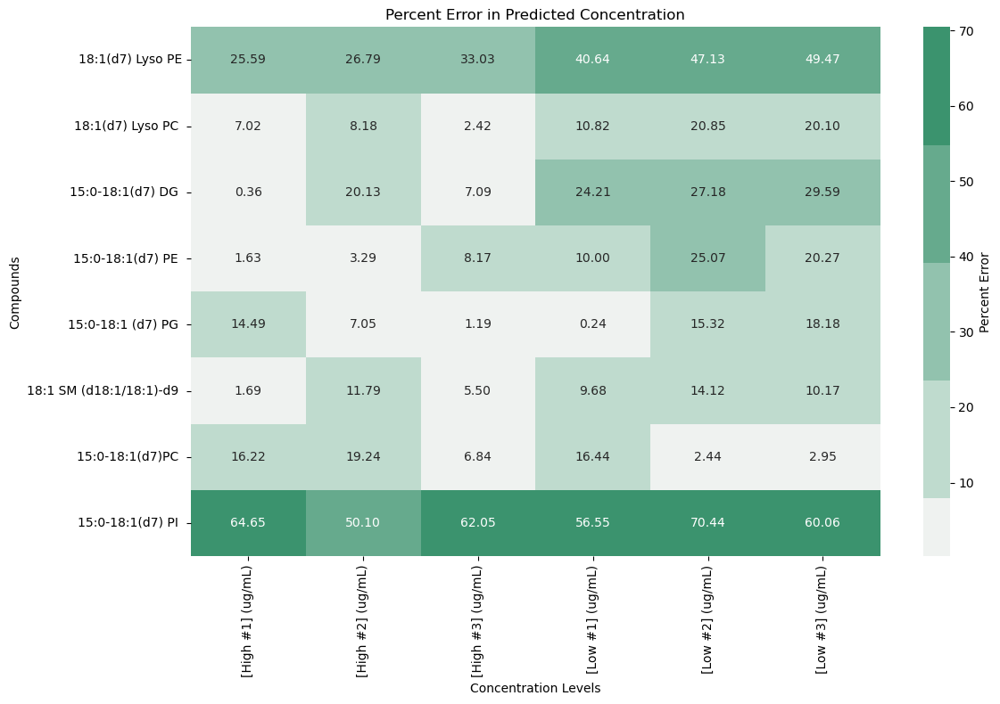

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



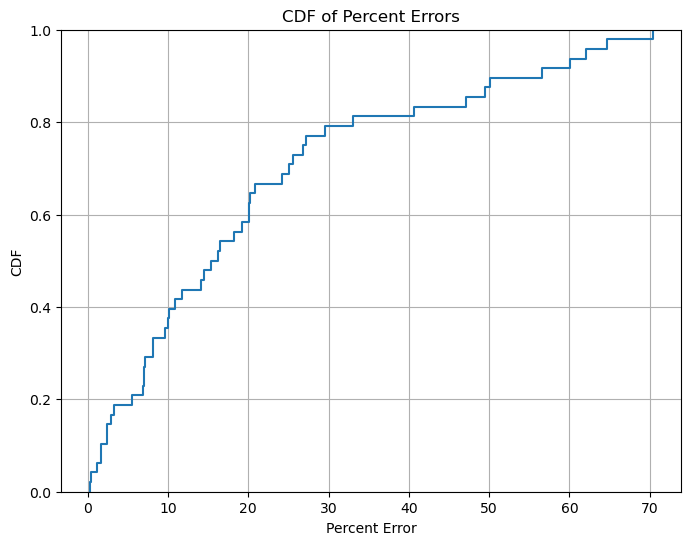

Mean Percent Error: 20.97%
Standard Deviation of Percent Errors: 18.99%
Median Percent Error: 15.77%
D2 Splash Mean:  20.9671197840829
D2 Splash Median:  15.769138633649142


In [39]:
percent_errors_matrix_boxcox_rfe = calculate_and_plot_percent_error(
    df=Target_Book,
    internal_standard_row=Target_Internal_Standard_Row,
    slopes=list(y_target_predicted_rfe_untransformed),
    plot=verbose,
    verbose=verbose)


print("D2 Splash Mean: ", np.nanmean(percent_errors_matrix_boxcox_rfe))
print("D2 Splash Median: ", np.nanmedian(percent_errors_matrix_boxcox_rfe))

In [40]:
import pandas as pd

# Assuming y_train_untransformed, y_train_predicted_rfe_untransformed, etc. are pandas Series
# Assuming Train_Book and Test_Book are pandas DataFrames

# Create DataFrame for the first sheet
df1 = pd.DataFrame({
    'Name': filtered_train_book['Name'],
    'y_train': y_train_untransformed,
    'y_train_predicted_rfe_untransformed': y_train_predicted_rfe_untransformed,
    'y_train_cross_validation_rfe_untransformed': y_train_cross_validation_rfe_untransformed
})

# Create DataFrame for the second sheet
df2 = pd.DataFrame({
    'Name': filtered_test_book['Name'],
    'y_test': y_test_untransformed,
    'y_test_predicted_rfe_untransformed': y_test_predicted_rfe_untransformed
})

# Create DataFrame for the third sheet
df3 = pd.DataFrame({
    'Name': Target_Book['Name'],
    'y_target_predicted_rfe_untransformed': y_target_predicted_rfe_untransformed
})

display(df1, df2, df3)

,Name,y_train,y_train_predicted_rfe_untransformed,y_train_cross_validation_rfe_untransformed
0,17:0-18:1 PI-d5,0.446564,0.476056,0.557556
1,C16:1 Ceramide-d7 (d18:1-d7/16:1),8.734722,8.049530,7.251554
2,17:0-16:1 PG-d5,1.542945,1.448896,1.421085
3,17:0 Lyso PS-d5,0.274779,0.274725,0.296037
4,17:0-16:1 DG-d5,0.209262,0.316581,0.321309
5,17:0-14:1 PC-d5,0.637272,0.637432,0.612015
6,17:0 Lyso PC-d5,1.554247,1.505468,1.216577
7,17:0 Lyso PE-d5,2.512194,2.513451,2.431724
8,20:1 SM (d18:1/20:1)-d9,0.623151,0.932465,1.048749
9,17:0-14:1 PG-d5,1.522974,1.523292,1.528111


,Name,y_test,y_test_predicted_rfe_untransformed
0,19:0 Lyso PE-d5,1.989986,3.048825
1,17:0-20:3 PG-d5,1.671910,1.747159
2,C22:1 Ceramide-d7 (d18:1-d7/22:1),21.910285,16.497121
3,17:0-14:1 PE-d5,1.230777,1.209096
4,19:0 Lyso PI-d5,0.798327,0.771308
5,15:0 Lyso PG-d5,1.838312,2.592215
6,17:0-22:4 DG-d5,1.120712,0.500359
7,17:0-20:3 PI-d5,0.524071,0.469915
8,17:0-16:1 PE-d5,1.320592,1.113676
9,19:0 Lyso PC-d5,1.376121,1.721127


,Name,y_target_predicted_rfe_untransformed
0,18:1(d7) Lyso PE,2.504240
1,18:1(d7) Lyso PC,1.494149
2,15:0-18:1(d7) DG,0.363575
3,15:0-18:1(d7) PE,1.310168
4,15:0-18:1 (d7) PG,1.715246
5,18:1 SM (d18:1/18:1)-d9,0.909395
6,15:0-18:1(d7)PC,0.673296
7,15:0-18:1(d7) PI,0.730017


In [41]:
import pandas as pd
from datetime import datetime
import openpyxl  # Make sure this is installed

# Generate a timestamp in the format YYYYMMDD-HHMMSS
timestamp = datetime.now().strftime("%Y%m%d-%H%M%S")

# Define the path with the timestamp included before the file extension
path = f'C:/Users/mrain/OneDrive/Documents/SQRAPIE_OKR_MAR/negative_train80_test20_iteration878_D1USM_D2SM_{timestamp}.xlsx'

# Create a Pandas Excel writer using openpyxl as the engine
with pd.ExcelWriter(path, engine='openpyxl') as writer:
    # Write DataFrames to Excel without the index
    df1.to_excel(writer, sheet_name='Train Data', index=False)
    df2.to_excel(writer, sheet_name='Test Data', index=False)
    df3.to_excel(writer, sheet_name='Target Data', index=False)

# The workbook is automatically saved after exiting the 'with' block.

# Open the workbook and adjust column widths
wb = openpyxl.load_workbook(path)
for sheet_name in wb.sheetnames:
    sheet = wb[sheet_name]
    for col in sheet.columns:
        max_length = 0
        column = col[0].column_letter  # Get the column name
        for cell in col:
            try:  # Necessary to avoid error on empty cells
                if len(str(cell.value)) > max_length:
                    max_length = len(str(cell.value))
            except:
                pass
        adjusted_width = (max_length + 2)  # Adding a little extra space
        sheet.column_dimensions[column].width = adjusted_width

# Save the changes to the workbook
wb.save(path)
print("Last saved at: ", timestamp)

Last saved at:  20240705-141104


In [44]:
import session_info
session_info.show()

In [43]:
pip install session_info

Defaulting to user installation because normal site-packages is not writeable
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Obtaining dependency information for stdlib_list from https://files.pythonhosted.org/packages/13/d9/9085375f0d23a4896b307bf14dcc61b49ec8cc67cb33e06cf95bf3af3966/stdlib_list-0.10.0-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/79.8 kB ? eta -:--:--
   ---------------------------------------- 0.0/79.8 kB ? eta -:--:--
   --------------- ------------------------ 30.7/79.8 kB 1.3 MB/s eta 0:00:01
   ------------------------------ --------- 61.4/79.8 kB 656.4 kB/s eta 0:00:01
   ---------------------------------------- 79.8/79.8 kB 638.3 kB/s eta 0:00:00
  Created wheel for session_info: filename=session_info-1.0.0-py3-none-any.whl size=8073 sha256=c1deb2d52aeb952420134178362826ed0c163424cae66922a7cd6a1d97083990
  Stored in directory: c:\users\mrain\appdata\local\pip\cache\wheels\4e\5